## Load modules & data

In [1]:
#Base
from glob import glob
import sys, os, pdb
import numpy as np
import xarray as xr
import pandas as pd
import scipy.stats as st
from scipy.spatial import KDTree
from tqdm.notebook import trange, tqdm

#Plot
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
import matplotlib.gridspec as gridspec
from matplotlib.patches import Polygon
color_names=['amber','red','windows blue','faded green',
             'dusty purple',
             'orange',
             'steel blue',
             'pink',
             'greyish',
             'mint',
             'clay',
             'light cyan',
             'forest green',
             'pastel purple',
             'salmon',
             'dark brown',
             'lavender',
             'pale green',
             'dark red',
             'gold',
             'dark teal',
             'rust',
             'fuchsia',
             'pale orange',
             'cobalt blue',
             'mahogany',
             'cloudy blue',
             'dark pastel green',
             'dust',
             'electric lime',
             'fresh green',
             'light eggplant',
             'nasty green']
 
color_palette = sns.xkcd_palette(color_names)

#V1DD
from allen_v1dd.client import OPhysClient, EMClient
from allen_v1dd.stimulus_analysis import analysis_tools as at
at.set_stylesheet()

# EM-coregistration Github
# https://github.com/RussTorres/em_coregistration/tree/rmt_working_branch
sys.path.append('/home/david.wyrick/Git/em_coregistration/')
import coregister
import coregister.transform
import coregister.data_loader
from coregister.process.affine_matrices import transform_pts
from coregister.process.roi import center_from_pix_mask
from coregister.io.read_nwb import ROI_mask_nwb

#Cave
import requests
from requests.auth import HTTPBasicAuth
import caveclient

%matplotlib inline
%load_ext autoreload
%autoreload 2

em_final_voxel_size = np.array([4.85, 4.85, 45])

PlotDir = '/home/david.wyrick/projects/V1DD/coregistration/plots'


def get_array_subset_indices(set_arr, subset_arr):
    set_arr_sorted = np.argsort(set_arr)
    subset_arr_pos = np.searchsorted(set_arr[set_arr_sorted], subset_arr)
    indices = set_arr_sorted[subset_arr_pos]
    return indices

def chaseROI_to_russelROI(key_list):
    new_key_list = []; roi_list = []; plane_list = []
    for chase_key in key_list:
        split = chase_key.split('_')
        pp = int(split[2])-1
        rr = int(split[3])

        russel_key = f'plane{pp}_roi_{rr:04d}'
        new_key_list.append(russel_key)
        # print(f'{chase_key:20s} \t->\t',russel_key)
        plane_list.append(pp)
        roi_list.append(rr)

    return new_key_list, plane_list, roi_list

def russelROI_to_chaseROI(key_list):
    new_key_list = []; roi_list = []; plane_list = []
    for russel_key in key_list:
        split = russel_key.split('_')
        pp = int(split[0][-1])+1
        rr = int(split[2])

        chase_key = f'M409828_13_{pp}_{rr}'
        new_key_list.append(chase_key)
        # print(f'{russel_key:20s} \t->\t',chase_key)
        plane_list.append(pp)
        roi_list.append(rr)

    return new_key_list, plane_list, roi_list

def calculate_hash(quad_xy):
    
    #Define cells A & B
    max = 0
    for i in range(4):
        for j in range(4):
            dist = np.linalg.norm(quad_xy[j]-quad_xy[i])
            if dist > max:
                i_a = i; i_b = j
                max = dist
                
    A_xy = quad_xy[i_a]
    B_xy = quad_xy[i_b]
    
    #Calculate local coordinates
    quad_xy_local =  (quad_xy - A_xy)/(B_xy - A_xy)
    
    #Define C&D relative to the coordinate system defined by A-B
    i_cd = np.setxor1d([i_a,i_b],np.arange(4))

    #Break C/D symmetry by x_c <= x_d & x_c + x_d<=1
    if quad_xy_local[i_cd][0,0] < quad_xy_local[i_cd][1,0]:
        i_c = i_cd[0]; i_d = i_cd[1]
    else:
        i_c = i_cd[1]; i_d = i_cd[0]
        
    #Create hash based on CD local coordinates
    quad_hash = np.concatenate((quad_xy_local[i_c],quad_xy_local[i_d]))
    
    #Check to make sure x_c + x_d is less than 1
    if ((quad_hash[0] + quad_hash[2]) >= 1) | (np.any(np.abs(B_xy - A_xy) < 1)):
        error = 1
    else: 
        error = 0
    
    i_abcd = np.array([i_a,i_b,i_c,i_d])
    
    return quad_hash, i_abcd, error  

def plot_quad(quad_xy, i_abcd=None,ax=None,polygon_c=None,label=None):
    if np.all(i_abcd==None):
        i_a = 0; i_b = 1; i_c = 2; i_d = 3
    else:
        i_a, i_b, i_c, i_d = i_abcd

    if ax == None:
        fig, ax = plt.subplots(figsize=(8,8))
    
    if polygon_c == None:
        polygon_c == cc(0)
    ax.scatter(quad_xy[i_a,0],quad_xy[i_a,1],marker='$A$',s=55)
    ax.scatter(quad_xy[i_b,0],quad_xy[i_b,1],marker='$B$',s=55)
    ax.scatter(quad_xy[i_c,0],quad_xy[i_c,1],marker='$C$',s=55)
    ax.scatter(quad_xy[i_d,0],quad_xy[i_d,1],marker='$D$',s=55)
    
    ax.plot(quad_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],quad_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.25,zorder=1)
    poly = Polygon(quad_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=polygon_c, alpha=0.1,label=label)
    ax.add_patch(poly)
 
    
# coreg_table_russelkeys, _, _ = chaseROI_to_russelROI(coreg_table['roi'].values)
scalar = 1000
cc  = sns.color_palette("icefire", as_cmap=True)
cc2  = sns.color_palette("Spectral", as_cmap=True)

In [2]:
# matrix that describes the transformation from the input functional space (in pixels) to the coregistration space (in microns) and its inverse
func_raw2coreg_tform_fn = "/allen/programs/celltypes/workgroups/em-connectomics/russelt/v1dd_coregistration/C1V3_processing/coregistration_data/transforms/func_raw2coreg_tform.npy"
func_raw2coreg_tform = np.load(func_raw2coreg_tform_fn)
func_coreg2raw_tform = np.linalg.inv(func_raw2coreg_tform)

# matrix that describes the transformation from the input EM coregistration space (in microns) to the final EM space (in voxels)
em_coreg2final_tform_fn = "/allen/programs/celltypes/workgroups/em-connectomics/russelt/v1dd_coregistration/C1V3_processing/coregistration_data/transforms/em_coreg2final_tform.npy"
em_coreg2final_tform = np.load(em_coreg2final_tform_fn)
em_final2coreg_tform = np.linalg.inv(em_coreg2final_tform)

In [3]:
coreg_df = pd.read_csv('/home/david.wyrick/Git/allen_v1dd/data_frames/coreg_cells_table_20230517.csv',index_col=0)
coreg_df = coreg_df.convert_dtypes()
coreg_roi_ids = coreg_df['chase_key'].values
coreg_em_ids  = coreg_df['em_id'].values
em_coreg = np.array(coreg_df[['pt_position_x','pt_position_y','pt_position_z']],dtype=float)
ophys_coreg = np.array(coreg_df[['ophys_x','ophys_y','ophys_z']],dtype=float)



In [50]:
tmp_df  = em_client.query_table('manual_central_types')
tmp_df

,id_ref,created_ref,valid_ref,volume,pt_supervoxel_id,pt_root_id,id,created,valid,target_id,classification_system,cell_type,pt_position,bb_start_position,bb_end_position
0,350562,2022-02-04 06:21:10.300143+00:00,t,326.965400,94866276031228266,864691132773514104,1132,2022-04-20 02:59:02+00:00,t,350562,coarse_manual,PYC,"[894573, 478559, 163530]","[891003, 473981, 17111]","[898608, 483370, 18134]"
1,383955,2022-02-04 06:21:10.432163+00:00,t,504.192300,95649060060623076,864691132569667100,214,2022-04-20 02:59:02+00:00,t,383955,coarse_manual,PYC,"[920802, 795478, 329220]","[914826, 790822, 34920]","[926389, 800366, 36123]"
2,385028,2022-02-04 06:21:10.464813+00:00,t,415.785065,95863052645657911,864691132781402571,13,2022-04-20 02:59:02+00:00,t,385028,coarse_manual,PYC,"[929338, 898530, 386595]","[924914, 892245, 41162]","[933994, 903885, 42103]"
3,293764,2022-02-04 06:21:10.538881+00:00,t,231.369357,94450111081742956,864691132625300120,717,2022-04-20 02:59:02+00:00,t,293764,coarse_manual,PYC,"[878665, 697702, 245475]","[874009, 694365, 26030]","[883554, 701349, 26859]"
4,351373,2022-02-04 06:21:10.585360+00:00,t,277.321739,96276193669654108,864691132689074198,2604,2022-04-20 02:59:02+00:00,t,351373,coarse_manual,PYC,"[944314, 572378, 210330]","[939814, 568187, 22179]","[948505, 576413, 23110]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3760,292731,2022-02-04 06:31:30.470280+00:00,t,252.520910,94380291959274554,864691132790131702,2011,2022-04-20 02:59:02+00:00,t,292731,coarse_manual,PYC,"[877966, 717645, 202455]","[873388, 713920, 21359]","[883554, 721214, 22266]"
3761,350799,2022-02-04 06:31:31.095792+00:00,t,333.801934,95711250717436130,864691132762899335,2257,2022-04-20 02:59:02+00:00,t,350799,coarse_manual,PYC,"[924759, 499589, 172665]","[920181, 494545, 18076]","[929182, 503934, 19109]"
3762,277788,2022-02-04 06:31:30.717740+00:00,t,331.094581,93742231818908043,864691132653866455,425,2022-04-20 02:59:02+00:00,t,277788,coarse_manual,PYC,"[853833, 547235, 263385]","[849410, 542734, 27946]","[858722, 551658, 28843]"
3763,383757,2022-02-04 06:31:30.756589+00:00,t,438.738900,96145008457434329,864691132617158087,395,2022-04-20 02:59:02+00:00,t,383757,coarse_manual,PYC,"[938960, 917232, 319095]","[934071, 913197, 33814]","[944625, 921733, 34925]"


<AxesSubplot: ylabel='Count'>

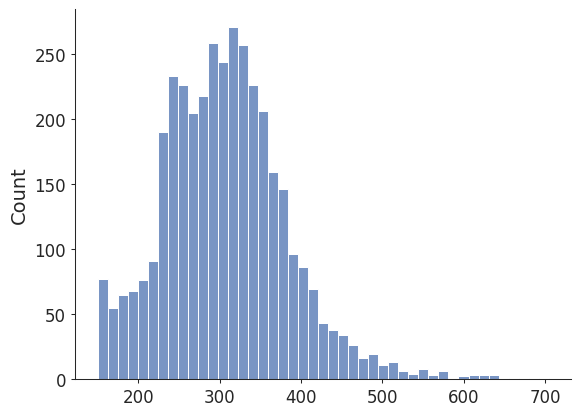

In [62]:
sns.histplot(tmp_df['volume'].values)

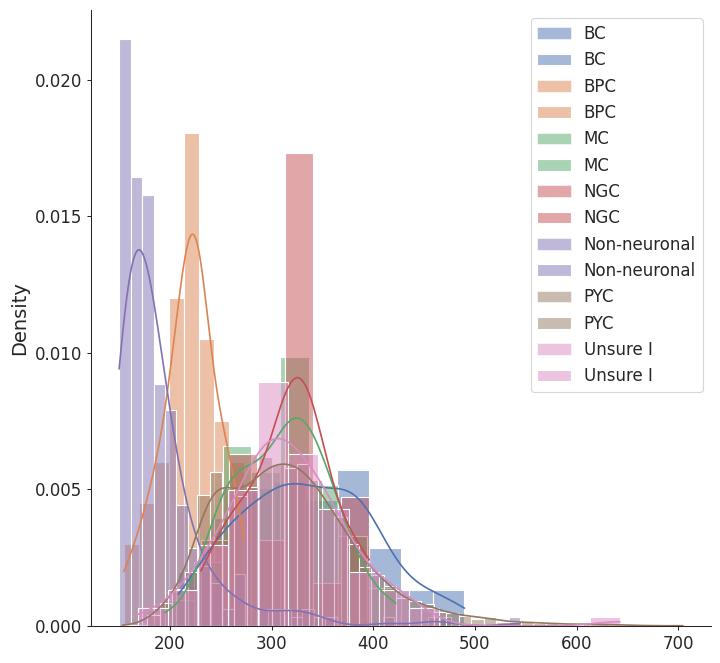

In [61]:
fig, ax = plt.subplots(figsize=(8,8))
for ct in np.unique(tmp_df['cell_type']):
    sub_df = tmp_df.loc[tmp_df.cell_type == ct]
    sns.histplot(sub_df['volume'].values,ax=ax,kde=True,alpha=0.5,stat='density',label=ct)
ax.legend()

In [4]:

em_origin = np.array([-802,50,-722])
volume_thresh = 150
em_client = EMClient()

#Create query box of potential EM objects this ophys data could be coregistered to

# query_bbox = np.array([min_nm - buffer,max_nm + buffer])
#Get all cells in EM volume within bounding region
nucleus_table = em_client.materialize.query_table(
    "nucleus_detection_v0")#,filter_spatial_dict={"pt_position": query_bbox})

## Load EM data
nucleus_table = em_client.query_table('nucleus_detection_v0')
nucleus_table = nucleus_table.loc[nucleus_table.volume > volume_thresh]
nucleus_table.reset_index(inplace=True)

#Extract point position 
nucleus_pts = np.array([i for i in nucleus_table.pt_position])
nucleus_ids = np.array([i for i in nucleus_table.id])

#Standard transform
nucleus_points_microns = em_client.transform_position_to_microns(nucleus_pts)
# nucleus_points_microns = nucleus_points_microns - em_origin
nucleus_table['em_microns'] = None

for ii in range(len(nucleus_points_microns)):
    nucleus_table.at[ii,'em_microns'] = nucleus_points_microns[ii]

nucleus_table = nucleus_table.set_index('id')
nucleus_table

/home/david.wyrick/anaconda3/envs/v1dd/lib/python3.10/site-packages/standard_transform/datasets.py:21: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot, _ = R.align_vectors(np.array([[0, 1, 0]]), [up])


,index,created,superceded_id,valid,volume,pt_supervoxel_id,pt_root_id,pt_position,bb_start_position,bb_end_position,em_microns
id,,,,,,,,,,,
228132,0,2022-02-04 06:21:10.292663+00:00,NaN,t,458.464831,87485049993200655,864691132737039043,"[632828, 749849, 738270]","[626620, 746124, 78876]","[638493, 753341, 80137]","[-272.90240857566243, 643.1244056729837, 99.05..."
203262,2,2022-02-04 06:21:10.297516+00:00,NaN,t,338.276613,87197526360541948,864691132654552792,"[624680, 531094, 283770]","[619869, 525818, 30089]","[629414, 535750, 31050]","[-282.70505678483306, 310.7332642296362, -280...."
350562,3,2022-02-04 06:21:10.300143+00:00,NaN,t,326.965400,94866276031228266,864691132773514104,"[894573, 478559, 163530]","[891003, 473981, 17111]","[898608, 483370, 18134]","[-13.227572489958257, 226.5862979342912, -382...."
718122,4,2022-02-04 06:21:10.302911+00:00,NaN,t,333.888647,118515535938912588,864691132774106773,"[1729859, 674111, 781200]","[1722177, 667205, 83852]","[1736610, 682026, 84536]","[823.8089641267544, 576.1823768548031, 160.695..."
680726,5,2022-02-04 06:21:10.305207+00:00,NaN,t,706.847075,115982398587674903,864691132780109973,"[1640231, 677370, 768015]","[1635265, 671938, 82014]","[1645663, 683268, 83401]","[734.1801361963976, 576.2391191404597, 147.119..."
...,...,...,...,...,...,...,...,...,...,...,...
267622,207448,2022-02-04 06:31:31.242501+00:00,NaN,t,349.824934,93527689948393260,864691133046970980,"[847392, 420980, 388980]","[842969, 416324, 41419]","[851893, 425558, 42360]","[-60.38373421917821, 231.69362136028388, -149...."
382516,207449,2022-02-04 06:31:31.243847+00:00,NaN,t,173.763515,96074570859091110,864691132720900052,"[937718, 914826, 255285]","[933140, 911334, 27121]","[941443, 919172, 27887]","[32.13148650490679, 671.2734608592033, -410.46..."
168582,207451,2022-02-04 06:31:31.246802+00:00,NaN,t,369.919126,83482550844689534,864691133042980384,"[491518, 1057067, 92070]","[485388, 1052877, 9399]","[497571, 1061413, 10389]","[-413.5982755972819, 766.8526707663702, -605.7..."


In [16]:
# mystery_transform = np.array([[ 0.99413636, 0.107377 , 0.01277015],
# [-0.107377 , 0.96632485, 0.23385137],
# [ 0.01277015, -0.23385137, 0.97218849]])
# # nucleus_pts_transformed =  nucleus_pts @ mystery_transform.T

In [5]:
em_coreg_microns = em_client.transform_position_to_microns(em_coreg)
# em_coreg_microns = em_coreg_microns - em_origin
np.min(em_coreg_microns,axis=0)

array([-242.44860756,  339.42362049, -528.53613362])

In [ ]:
tt, cc = np.unique(nucleus_table['pt_root_id'],return_counts=True)
np.unique(cc,return_counts=True)

## Let's try 2D constellation method visually first
for session 13

In [6]:
from allen_v1dd.stimulus_analysis import analysis_tools as at
metrics = at.load_roi_metrics('/home/david.wyrick/Git/allen_v1dd/data_frames/v1dd_metrics.csv',remove_duplicates=False)
metrics_13 = metrics.loc[(metrics.volume == 3) & (metrics.is_valid == True) & (metrics.is_ignored_duplicate == False)]
valid_cells_ids = metrics_13.index.values

In [7]:
#Get 2p functional data for column 1 volumn 3
nwb_file = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/processed/M409828_13_20181213.nwb'
with ROI_mask_nwb(nwb_file, vol=3, mode="r") as rmn:
    # import pdb; pdb.set_trace()
    all_roi_info = [*rmn.yield_roi_info()] 

# Get 2p ROI center of mass 
all_roi_raw_center_pts = np.array([center_from_pix_mask(roi.pix_mask).tolist() + [roi.plane_z] for roi in all_roi_info])

# Get names
all_roi_names = np.array([roi.chase_ROI for roi in all_roi_info])

#Get pika scores
pika_threshold = 0.5
all_pika_scores = np.array([roi.pika_score for roi in all_roi_info])
all_valid_cells = all_pika_scores > pika_threshold

#Get indices of cells that are valid and don't have a duplicate
func_cell_indices = get_array_subset_indices(all_roi_names,valid_cells_ids)

In [8]:
all_2p_cell_centers = all_roi_raw_center_pts[func_cell_indices]
all_2p_cell_centers

array([[359.30295343,  46.6542582 ,   0.        ],
       [188.07566668, 165.6618855 ,   0.        ],
       [316.04247124, 343.19308775,   0.        ],
       ...,
       [271.20084891, 294.92680363,   5.        ],
       [267.00777811, 352.82714132,   5.        ],
       [297.1512436 , 447.13271887,   5.        ]])

Plane 1:  min: 339.4, max: 365.2,  mean: 352.8, 95th%tile: 363.4, std: 7.4
Plane 2:  min: 352.7, max: 379.4,  mean: 366.5, 95th%tile: 379.2, std: 7.8
Plane 3:  min: 361.1, max: 396.8,  mean: 375.0, 95th%tile: 392.1, std: 8.5
Plane 4:  min: 373.2, max: 402.6,  mean: 386.3, 95th%tile: 395.9, std: 7.2
Plane 5:  min: 384.6, max: 425.4,  mean: 404.1, 95th%tile: 424.0, std: 12.3
Plane 6:  min: 409.0, max: 442.1,  mean: 419.8, 95th%tile: 434.6, std: 8.9


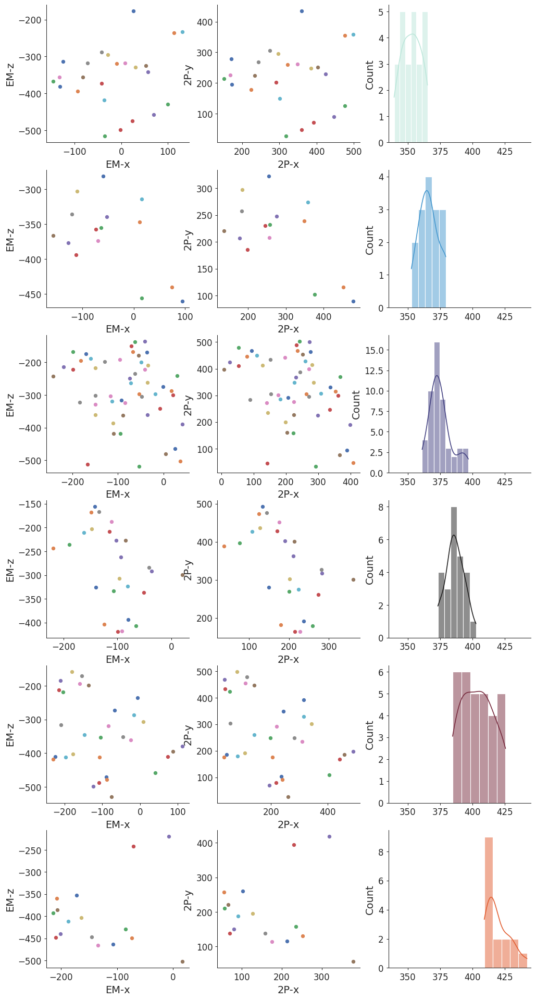

In [9]:
scalar = 1000
cc = sns.color_palette("icefire", as_cmap=True)
##Plot coregistered cells from each plane and the corresponding EM locations
fig, axes = plt.subplots(6,3,figsize=(12,24))

for ii in range(6):
    # #Plot all 2p cells in plane
    # indy = all_2p_cell_centers[:,2] == ii
    # ax.scatter(all_2p_cell_centers[indy,0], all_2p_cell_centers[indy,1],marker= '.', color='k',s=35)

    sub_df = coreg_df.loc[coreg_df.ophys_plane == ii+1]
    em_xyz = np.array(sub_df[["pt_position_x","pt_position_y", "pt_position_z"]],dtype=float)
    em_coreg_microns = em_client.transform_position_to_microns(em_xyz)

    em_xz = em_coreg_microns[:,[0,2]] #np.array(sub_df[["pt_position_x", "pt_position_z"]],dtype=float)/scalar
    em_y = em_coreg_microns[:,1]
    
    # em_y = np.array(sub_df["pt_position_y"],dtype=float)/scalar
    ophys_xy = np.array(sub_df[["ophys_x", "ophys_y"]],dtype=float)

    y_width = np.max(em_y)-np.min(em_y)
    print(f'Plane {ii+1}:  min: {np.min(em_y):.1f}, max: {np.max(em_y):.1f},  mean: {np.mean(em_y):.1f}, 95th%tile: {np.percentile(em_y,95):.1f}, std: {np.std(em_y):.1f}')
    for jj in range(ophys_xy.shape[0]):
        color = axes[ii,1].scatter(ophys_xy[jj,0], ophys_xy[jj,1],marker= 'o', s=20).get_facecolors()[0]
        axes[ii,0].scatter(em_xz[jj, 0], em_xz[jj, 1],facecolors=color, marker='o',s=20)

    ax = axes[ii,0]
    ax.set_xlabel(f'EM-x')
    ax.set_ylabel(f'EM-z')

    ax = axes[ii,1]
    ax.set_xlabel(f'2P-x')
    ax.set_ylabel(f'2P-y')
    
    ax = axes[ii,2]
    sns.histplot(em_y,color=cc(ii/6),ax=ax,kde=True)
    ax.set_xlim([335,445])

    

## Estimate z-depth using duplicates

In [155]:
## Load data
base_folder = r"\\allen\programs\mindscope\workgroups\surround\v1dd_in_vivo_new_segmentation\data" #Server
base_folder = "/data/v1dd_in_vivo_new_segmentation" # Local on robinson for golden mouse
ophys_client = OPhysClient(base_folder)

## Central volume from golden mouse
mouse_id = 409828; col = 1; vol = 3; plane = 3

sess12 = ophys_client.load_ophys_session(mouse=mouse_id, column=col, volume=2)
sess13 = ophys_client.load_ophys_session(mouse=mouse_id, column=col, volume=3)
sess14 = ophys_client.load_ophys_session(mouse=mouse_id, column=col, volume=4)

## Load data
base_folder = r"\\allen\programs\mindscope\workgroups\surround\v1dd_in_vivo_new_segmentation\data" #Server
base_folder = "/data/v1dd_in_vivo_new_segmentation" # Local on robinson for golden mouse
ophys_client = OPhysClient(base_folder)

## Central volume from golden mouse
mouse_id = 409828; col = 1; vol = 3; plane = 3

sess = ophys_client.load_ophys_session(mouse=mouse_id, column=col, volume=vol)
print(f"Loaded ophys session {sess.get_session_id()} (mouse {sess.get_mouse_id()}, column {sess.get_column_id()}, volume {sess.get_volume_id()})")


Loaded ophys session M409828_13 (mouse 409828, column 1, volume 3)


In [156]:
from allen_v1dd import duplicate_rois as dr
from allen_v1dd.stimulus_analysis import analysis_tools as at
metrics = at.load_roi_metrics('/home/david.wyrick/Git/allen_v1dd/data_frames/v1dd_metrics.csv',remove_duplicates=False)
metrics_13 = metrics.loc[(metrics.volume == 3) & (metrics.is_valid == True) & (metrics.is_ignored_duplicate == False)]


duplicates_df = metrics.loc[metrics.has_duplicate]
tmp_df = duplicates_df.loc[(duplicates_df.plane == 1) | (duplicates_df.plane == 6)]


M409828_13_1_505 223.73157894736843 274.0421052631579
True
M409828_13_2_207 224.84183673469389 273.73979591836735
True
M409828_13_3_237 223.1890756302521 275.1218487394958
True
M409828_13_4_387 224.09574468085106 274.8244680851064
True
M409828_13_5_501 224.07784431137725 274.5748502994012
True
M409828_13_6_240 223.76436781609195 273.9022988505747
True


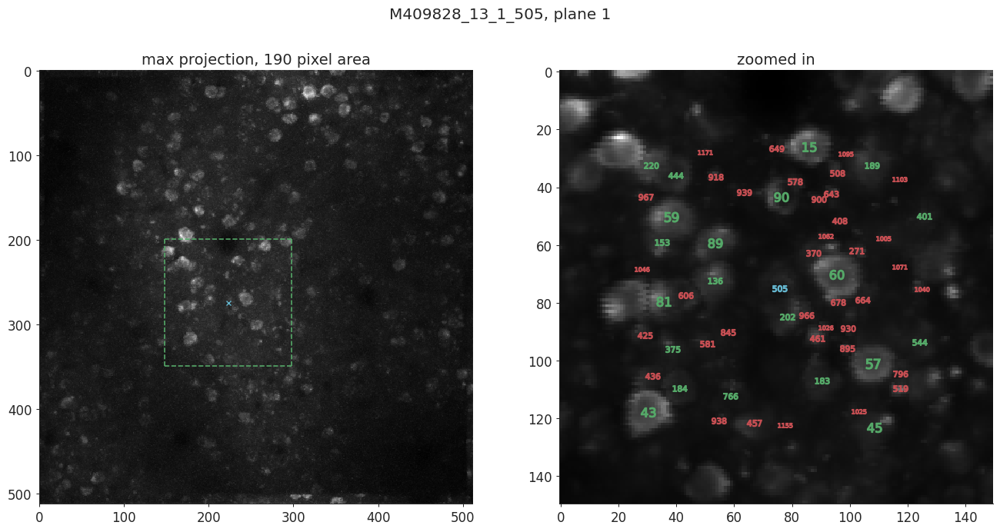

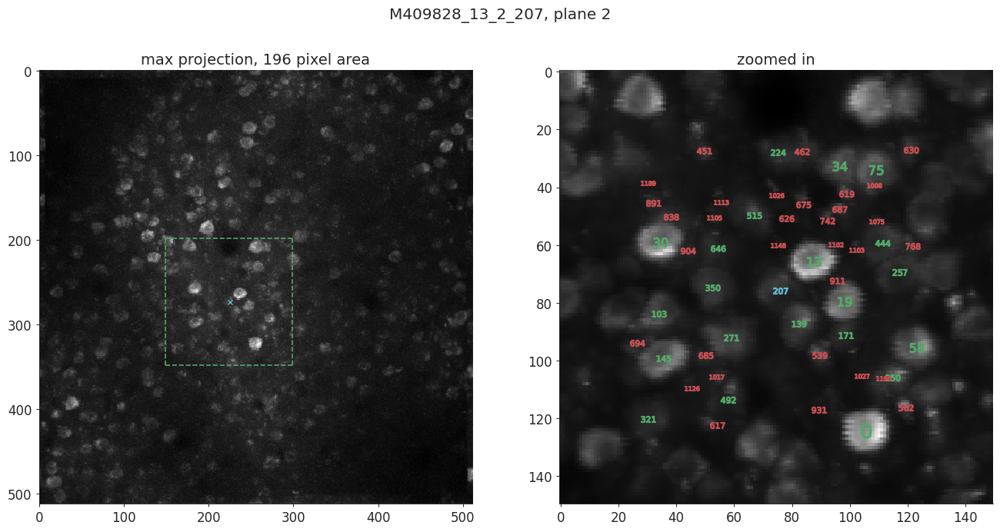

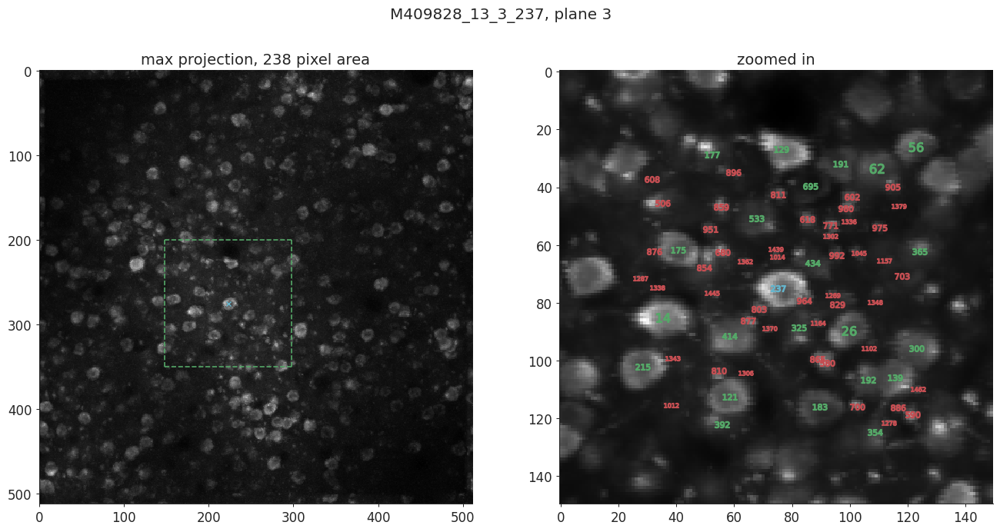

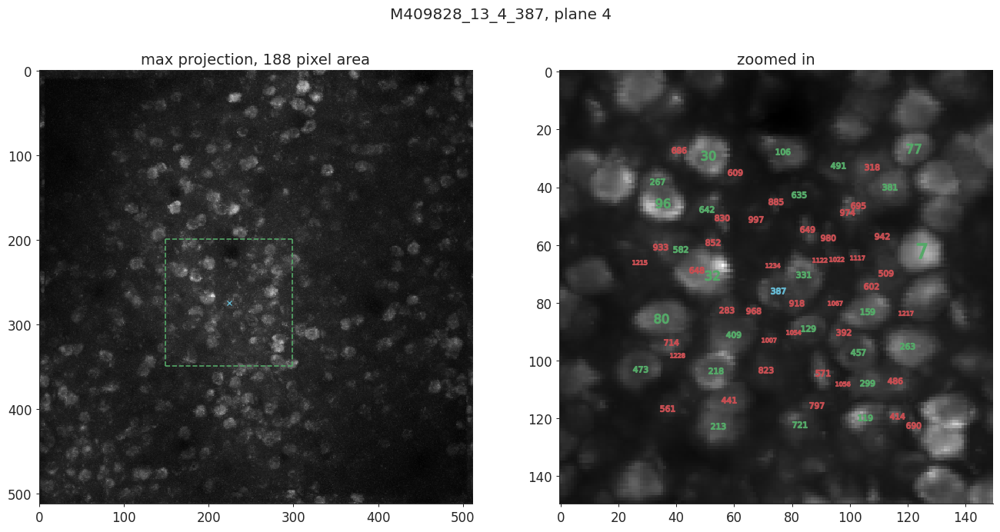

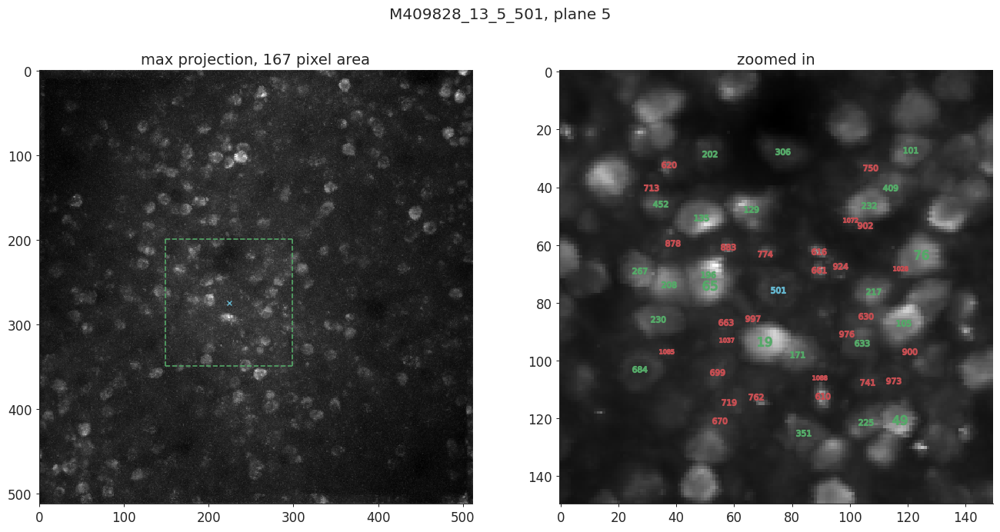

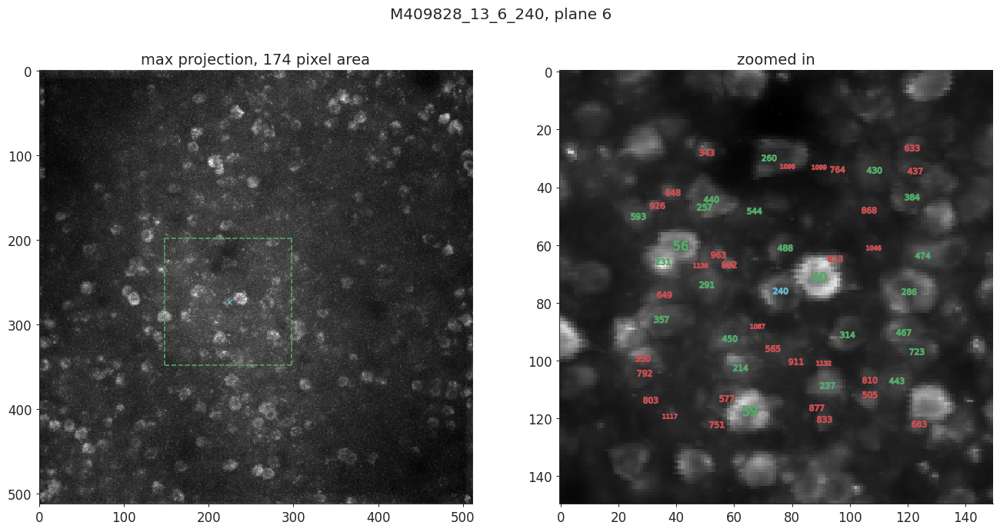

In [157]:
# Pt-40          : False 		 M409828_13_4_7             M409828_13_5_76           -> M409828_13_4_7, M409828_13_5_76
# Pt-116 4_0419 basal: True 		 M409828_13_4_921           M409828_13_4_240          -> M409828_13_4_240, M409828_13_4_303
# M409828_13_3_331          / M409828_13_4_139          / M409828_13_4_139
#M409828_13_3_83           / M409828_13_3_327          /

dupli = ['M409828_13_1_505', 'M409828_13_2_207', 'M409828_13_3_237', 'M409828_13_4_387', 'M409828_13_5_501', 'M409828_13_6_240']
tmp = np.zeros((6,3)); depths = np.zeros((6,1))
for ii, d in enumerate(dupli):
    text = d.split('_')
    col = int(text[1][0])
    vol = int(text[1][1])
    plane = int(text[2])
    roi_center = int(text[3])
    xypixels = sess.get_roi_xy_pixels(plane,roi_center)

    mask = sess.get_roi_image_mask(plane,roi_center)
    proj_raw_mean, proj_raw_max, proj_de_mean, proj_de_max, proj_de_corr = sess.get_plane_projection_images(plane)

    yc = np.mean(xypixels[0])
    xc = np.mean(xypixels[1])
    area = np.sum(mask)
    # import pdb; pdb.set_trace()
    print(d,yc,xc)

    fig, axes = plt.subplots(1,2,figsize=(16,8))
    plt.suptitle(f'{d}, plane {plane}',y=0.95)

    ax = axes[0]
    buff = 75
    ax.imshow(proj_raw_max, cmap='gray', interpolation='nearest')
    # ax.imshow(proj_raw_max[slice(int(xc)-buff,int(xc)+buff),slice(int(yc)-buff,int(yc)+buff)], cmap='gray', interpolation='nearest')
    ax.plot(yc,xc,'xc')
    ax.vlines(int(yc)-buff,int(xc)-buff,int(xc)+buff,ls='--',color='g')
    ax.vlines(int(yc)+buff,int(xc)-buff,int(xc)+buff,ls='--',color='g')

    ax.hlines(int(xc)-buff,int(yc)-buff,int(yc)+buff,ls='--',color='g')
    ax.hlines(int(xc)+buff,int(yc)-buff,int(yc)+buff,ls='--',color='g')

    ax.set_title(f'max projection, {area} pixel area')

    ax = axes[1]
    # ax.imshow(proj_de_max, cmap='gray', interpolation='nearest')
    ax.imshow(proj_de_max[slice(int(xc)-buff,int(xc)+buff),slice(int(yc)-buff,int(yc)+buff)], cmap='gray', interpolation='nearest')
    # sub_arrays.append(proj_de_max[slice(int(xc)-buff,int(xc)+buff),slice(int(yc)-buff,int(yc)+buff)])

    # ax.plot(buff,buff,'Xg')
    ax.set_title('zoomed in')

    rois = np.array(sess.get_rois(plane))
    xstart = int(xc)-buff; ystart = int(yc)-buff
    
    for roi in rois:
        is_valid = sess.is_roi_valid(plane,roi)
        xypixels = sess.get_roi_xy_pixels(plane,roi)
        color = 'g' if is_valid else 'r'
        x = np.mean(xypixels[1])
        y = np.mean(xypixels[0])
        if roi == roi_center:
            color = 'c'
            print(is_valid)
        
        if (x > xc - 50) & (x < xc + 50) & (y > yc - 50) & (y < yc + 50):
            ax.plot(y-ystart,x-xstart,color=color,marker=f'${roi}$',markersize=14)

In [ ]:
pdfdoc = PdfPages(os.path.join(PlotDir,'duplicates_across-volumes_40.pdf'))

# dupli = ['M409828_13_1_106','M409828_13_2_351']
dupli = ['M409828_13_1_8','M409828_13_2_70']
dupli = ['M409828_13_5_314','M409828_13_6_70']

for idx, row in tmp_df.iterrows():
    dupli = row['duplicate_rois'].split(', ')
    xc_list = []
    yc_list = []
    roi_duplicates = []
    for ii, d in enumerate(dupli):

        text = d.split('_')
        col = int(text[1][0])
        vol = int(text[1][1])
        plane = int(text[2])
        roi_center = int(text[3])
        
        xypixels = sess13.get_roi_xy_pixels(plane,roi_center)

        xc = np.mean(xypixels[0])
        yc = np.mean(xypixels[1])

        yc_list.append(yc)
        xc_list.append(xc)
        roi_duplicates.append((plane,roi_center))


    xc = int(np.mean(xc_list))
    yc = int(np.mean(yc_list))

    
    if roi_duplicates[-1][0] == 6:
        print(dupli)
        print('Using 13/14 plotting function')
        plot_13_14_boundaries(xc,yc,roi_duplicates,dupli,pdfdoc,40)
    else:
        print(dupli)
        print('Using 12/13 plotting function')
        plot_12_13_boundaries(xc,yc,roi_duplicates,dupli,pdfdoc,40)
pdfdoc.close()

In [8]:
## Load data
base_folder = r"\\allen\programs\mindscope\workgroups\surround\v1dd_in_vivo_new_segmentation\data" #Server
base_folder = "/data/v1dd_in_vivo_new_segmentation" # Local on robinson for golden mouse
ophys_client = OPhysClient(base_folder)

## Central volume from golden mouse
mouse_id = 409828; col = 1; vol = 3; plane = 3

sess12 = ophys_client.load_ophys_session(mouse=mouse_id, column=col, volume=2)
sess13 = ophys_client.load_ophys_session(mouse=mouse_id, column=col, volume=3)
sess14 = ophys_client.load_ophys_session(mouse=mouse_id, column=col, volume=4)

## Load data
base_folder = r"\\allen\programs\mindscope\workgroups\surround\v1dd_in_vivo_new_segmentation\data" #Server
base_folder = "/data/v1dd_in_vivo_new_segmentation" # Local on robinson for golden mouse
ophys_client = OPhysClient(base_folder)

## Central volume from golden mouse
mouse_id = 409828; col = 1; vol = 3; plane = 3

sess = ophys_client.load_ophys_session(mouse=mouse_id, column=col, volume=vol)
print(f"Loaded ophys session {sess.get_session_id()} (mouse {sess.get_mouse_id()}, column {sess.get_column_id()}, volume {sess.get_volume_id()})")


Loaded ophys session M409828_13 (mouse 409828, column 1, volume 3)


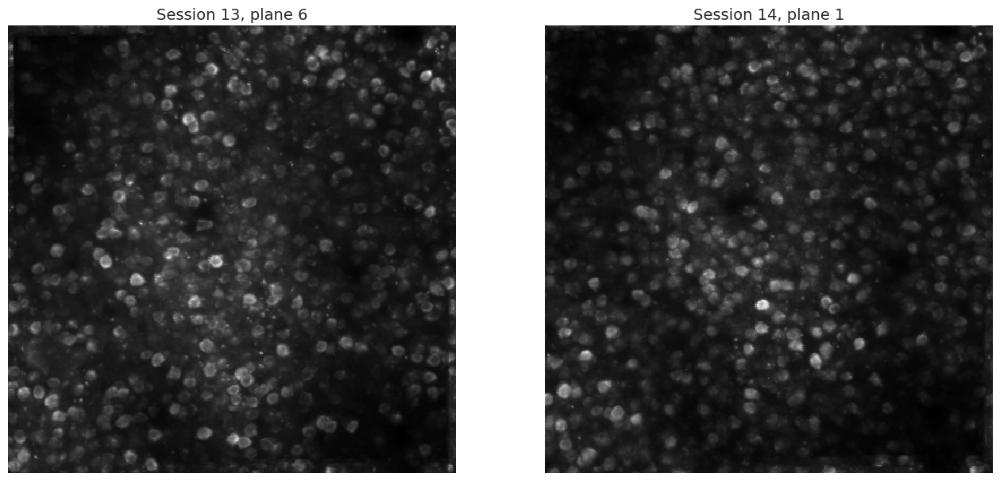

In [41]:
fig, axes = plt.subplots(1,2,figsize=(16,8))
    
img_list = []
proj_raw_mean, proj_raw_max, proj_de_mean, proj_de_max, proj_de_corr = sess13.get_plane_projection_images(6)
img_list.append(proj_de_max)
ax = axes[0]
ax.axis('off')
ax.set_title(f'Session 13, plane {6}')
ax.imshow(proj_de_max, cmap='gray', interpolation='nearest')

proj_raw_mean, proj_raw_max, proj_de_mean, proj_de_max, proj_de_corr = sess14.get_plane_projection_images(1)

ax = axes[1]
ax.axis('off')
ax.set_title(f'Session 14, plane 1')
ax.imshow(proj_de_max, cmap='gray', interpolation='nearest')
img_list.append(proj_de_max)

121 120 96 97
121 120 96 97
118 120 99 97


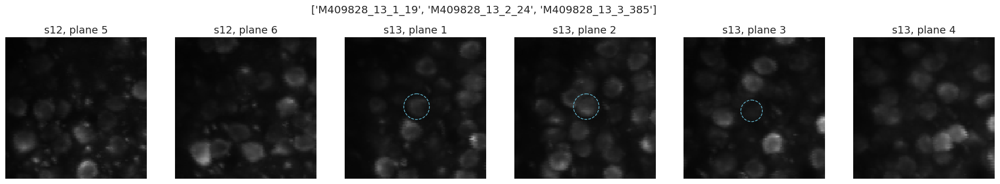

In [51]:
dupli = ['M409828_13_1_19', 'M409828_13_2_24', 'M409828_13_3_385']


xc_list = []
yc_list = []
roi_duplicates = []
for ii, d in enumerate(dupli):

    text = d.split('_')
    col = int(text[1][0])
    vol = int(text[1][1])
    plane = int(text[2])
    roi_center = int(text[3])
    
    xypixels = sess13.get_roi_xy_pixels(plane,roi_center)

    xc = np.mean(xypixels[0])
    yc = np.mean(xypixels[1])

    yc_list.append(yc)
    xc_list.append(xc)
    roi_duplicates.append((plane,roi_center))


xc = int(np.mean(xc_list))
yc = int(np.mean(yc_list))

def plot_12_13_boundaries(xc,yc,roi_duplicates,dupli,axes=None,pdfdoc=None,buff=50):

    if axes is None:
        fig, axes = plt.subplots(1,6,figsize=(24,4))
        plt.suptitle(dupli)

    # Session 12, plane 5
    plane = 5
    for i in range(2):
        plane = 5 + i
        proj_raw_mean, proj_raw_max, proj_de_mean, proj_de_max, proj_de_corr = sess12.get_plane_projection_images(plane)

        ax = axes[i]
        ax.axis('off')
        ax.set_title(f's12, plane {plane}')
        ax.imshow(proj_de_max, cmap='gray', interpolation='nearest')

        rois = np.array(sess12.get_rois(plane))
        xstart = int(xc)-50; ystart = int(yc)-50
        # ax.plot(buff,buff,'xc')
        ax.set_xlim(xc-buff, xc+buff)
        ax.set_ylim(yc+buff, yc-buff) 


    # Session 12, plane 5
    plane = 5
    for i in range(4):
        plane = i+1
        proj_raw_mean, proj_raw_max, proj_de_mean, proj_de_max, proj_de_corr = sess13.get_plane_projection_images(plane)

        ax = axes[i+2]
        ax.axis('off')
        ax.set_title(f's13, plane {plane}')
        ax.imshow(proj_de_max, cmap='gray', interpolation='nearest')

        rois = np.array(sess13.get_rois(plane))
        xstart = int(xc)-buff; ystart = int(yc)-buff
        # ax.plot(buff,buff,'xc')

        for roi in rois:
            if (plane,roi) in roi_duplicates:
                is_valid = sess13.is_roi_valid(plane,roi)
                xypixels = sess13.get_roi_xy_pixels(plane,roi)
                color = 'c' if is_valid else 'r'

                # x = np.mean(xypixels[1])
                # y = np.mean(xypixels[0])
            
                # if (x > xc - buff) & (x < xc + buff) & (y > yc - buff) & (y < yc + buff):
                #     ax.plot(y-ystart,x-xstart,color=color,marker=f'${roi}$',markersize=14)

                roi_mask = sess.get_roi_image_mask(plane, roi)
                area = int(np.sum(roi_mask))
                y, x = np.mean(np.where(roi_mask), axis=1)
                y = int(y)
                x = int(x)
                print(x,xc,y,yc)

                roi_radius = np.sqrt(area / np.pi) * 1.1
                ax.add_patch(mpl.patches.Circle((x,y), roi_radius, fill=False, edgecolor=color, linestyle="dashed", linewidth=1))

        ax.set_xlim(xc-buff, xc+buff)
        ax.set_ylim(yc+buff, yc-buff) 

        

    if pdfdoc is not None:
        pdfdoc.savefig(fig)
        plt.close()


plot_12_13_boundaries(xc,yc,roi_duplicates,dupli)


227 225 461 463
224 225 465 463


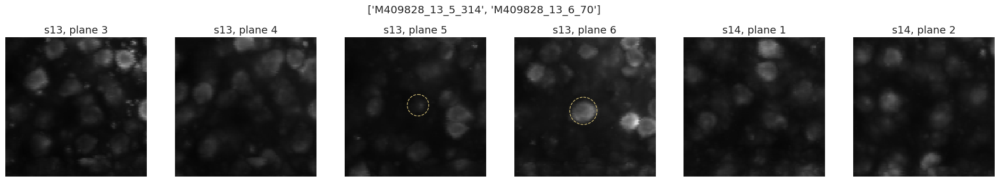

In [50]:
dupli = ['M409828_13_5_314','M409828_13_6_70']


xc_list = []
yc_list = []
roi_duplicates = []
for ii, d in enumerate(dupli):

    text = d.split('_')
    col = int(text[1][0])
    vol = int(text[1][1])
    plane = int(text[2])
    roi_center = int(text[3])
    
    xypixels = sess13.get_roi_xy_pixels(plane,roi_center)

    xc = np.mean(xypixels[0])
    yc = np.mean(xypixels[1])

    yc_list.append(yc)
    xc_list.append(xc)
    roi_duplicates.append((plane,roi_center))


xc = int(np.mean(xc_list))
yc = int(np.mean(yc_list))

def plot_13_14_boundaries(xc,yc,roi_duplicates,dupli,axes=None,pdfdoc=None,buff=50):

    if axes is None:
        fig, axes = plt.subplots(1,6,figsize=(24,4))
        plt.suptitle(dupli)
    # Session 13, planes 3, 4, 5, 6
    plane = 5
    for i in range(4):
        plane = i+3
        proj_raw_mean, proj_raw_max, proj_de_mean, proj_de_max, proj_de_corr = sess13.get_plane_projection_images(plane)

        ax = axes[i]
        ax.axis('off')
        ax.set_title(f's13, plane {plane}')
        ax.imshow(proj_de_max, cmap='gray', interpolation='nearest')

        rois = np.array(sess13.get_rois(plane))
        xstart = int(xc)-buff; ystart = int(yc)-buff
        # ax.plot(buff,buff,'xc')

        for roi in rois:
            if (plane,roi) in roi_duplicates:
                is_valid = sess13.is_roi_valid(plane,roi)
                xypixels = sess13.get_roi_xy_pixels(plane,roi)
                color = 'y' if is_valid else 'r'

                # x = np.mean(xypixels[1])
                # y = np.mean(xypixels[0])
        
                # if (x > xc - buff) & (x < xc + buff) & (y > yc - buff) & (y < yc + buff):
                #     ax.plot(y-ystart,x-xstart,color=color,marker=f'${roi}$',markersize=14)

                roi_mask = sess.get_roi_image_mask(plane, roi)
                area = int(np.sum(roi_mask))
                y, x = np.mean(np.where(roi_mask), axis=1)
                y = int(y)
                x = int(x)
                print(x,xc,y,yc)
                roi_radius = np.sqrt(area / np.pi) * 1.1
                ax.add_patch(mpl.patches.Circle((x,y), roi_radius, fill=False, edgecolor=color, linestyle="dashed", linewidth=1))
        ax.set_xlim(xc-buff, xc+buff)
        ax.set_ylim(yc+buff, yc-buff) 

        
    # Session 14, plane 1 & 2
    plane = 5
    for i in range(2):
        plane = i + 1
        proj_raw_mean, proj_raw_max, proj_de_mean, proj_de_max, proj_de_corr = sess14.get_plane_projection_images(plane)

        ax = axes[i+4]
        ax.axis('off')
        ax.set_title(f's14, plane {plane}')
        ax.imshow(proj_de_max, cmap='gray', interpolation='nearest')

        rois = np.array(sess12.get_rois(plane))
        xstart = int(xc)-50; ystart = int(yc)-50
        # ax.plot(buff,buff,'xc')

        ax.set_xlim(xc-buff, xc+buff)
        ax.set_ylim(yc+buff, yc-buff) 

    if pdfdoc is not None:
        pdfdoc.savefig(fig)
        plt.close()


plot_13_14_boundaries(xc,yc,roi_duplicates,dupli)


Text(0.5, 0, 'Time (s)')

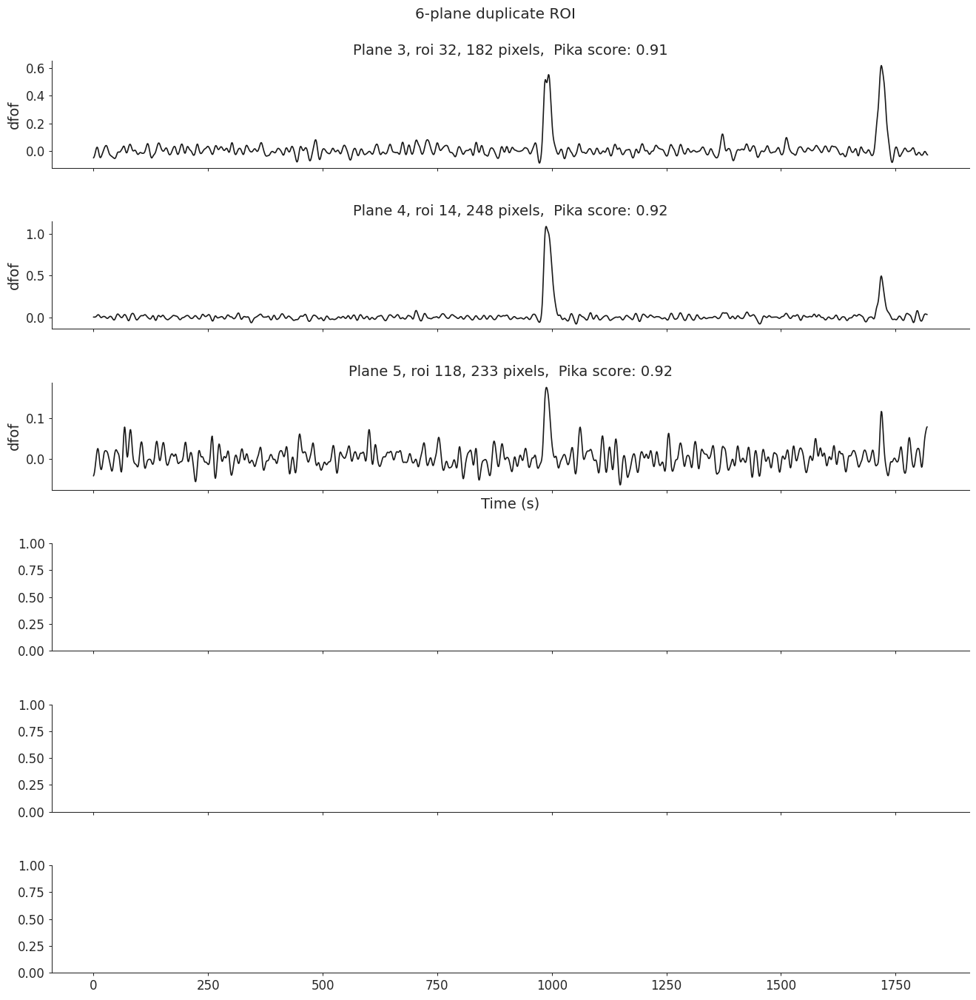

In [55]:
#Get stimulus table
stim_table, stim_meta = sess.get_stimulus_table("spontaneous")
tStart = stim_table.loc[0,'start']
tEnd = stim_table.loc[0,'end']

from scipy.ndimage import gaussian_filter1d

fig, axes = plt.subplots(6,1,figsize=(16,16),gridspec_kw={'hspace':0.5},sharey=False,sharex=True)
plt.suptitle('6-plane duplicate ROI',y=0.925)
trace_list = []
trace_list2 = []
for iPlane, roi_id in enumerate(dupli):
    # data_xr = data_list_interp[iPlane]

    data_xr = sess.get_traces(iPlane+1,'raw')
    str_split = roi_id.split('_')
    roi = int(str_split[-1])
    plane = int(str_split[-2])
    mask = sess.get_roi_image_mask(plane,roi)
    pika_score = sess.get_pika_roi_confidence(plane, roi)

    trace = sess.get_spont_traces(plane,'dff').sel(roi=roi)
    trace2 = data_xr.sel(roi=roi,time=slice(tStart, tEnd))
    trace_list.append(gaussian_filter1d(trace,sigma=3))
    trace_list2.append(gaussian_filter1d(trace2,sigma=3))
    ax = axes[iPlane]
    ax.plot(gaussian_filter1d(trace,sigma=3),'-k')
    ax.set_ylabel('dfof')
    ax.set_title(f'Plane {plane}, roi {roi}, {np.sum(mask)} pixels,  Pika score: {pika_score:.2f}')

    # ax2 = ax.twinx()
    # ax2.plot(gaussian_filter1d(trace2,sigma=3),'-r')
    # ax2.set_ylabel('raw')

ax.set_xlabel('Time (s)')

In [43]:
#Get stimulus table
stim_table, stim_meta = sess.get_stimulus_table("drifting_gratings_windowed")
last = len(stim_table)-1
tStart = stim_table.loc[0,'start']
tEnd = tStart + 180# stim_table.loc[last,'end']
stim_table

,start,end,temporal_frequency,spatial_frequency,direction
0,344.876038,346.861023,1.0,0.04,330.0
1,347.878540,349.863525,1.0,0.08,0.0
2,350.881042,352.865967,NaN,NaN,NaN
3,353.883514,355.868500,1.0,0.04,90.0
4,356.886017,358.871033,1.0,0.08,120.0
...,...,...,...,...,...
187,2687.826904,2689.812012,1.0,0.04,330.0
188,2690.829590,2692.814453,1.0,0.04,270.0
189,2693.832031,2695.816895,1.0,0.08,300.0
190,2696.834473,2698.819580,1.0,0.04,180.0


In [ ]:
fig = plt.figure(constrained_layout=False, figsize=(16,8))
gs0 = gridspec.GridSpec(ncols=6, nrows=2, figure=fig,wspace=0.5,hspace=.25)

In [64]:
duplicates_df

,mouse,column,volume,plane,roi,is_valid,is_ignored_duplicate,has_duplicate,n_duplicates,duplicate_rois,...,spontaneous_event_mean,spontaneous_event_std,depth_chunk,depth_trunc,vol_plane,dgw_is_responsive,dgf_is_responsive,ssi_fit,dgw_pref_dir_fit,dgf_pref_dir_fit
M409828_13_1_0,409828,1,3,1,0,True,False,True,2,"M409828_13_1_0, M409828_13_2_214",...,0.000429,0.002773,4,200,3-1,False,False,0.175127,19.837932,348.091708
M409828_13_1_1,409828,1,3,1,1,True,False,True,2,"M409828_13_1_1, M409828_13_2_35",...,0.000567,0.003633,4,200,3-1,False,False,0.218124,0.948082,314.819042
M409828_13_1_3,409828,1,3,1,3,True,False,True,2,"M409828_13_1_3, M409828_13_2_65",...,0.000782,0.005164,4,200,3-1,False,False,0.125851,131.588545,71.779196
M409828_13_1_6,409828,1,3,1,6,True,False,True,2,"M409828_13_1_6, M409828_13_2_66",...,0.000462,0.003177,4,200,3-1,True,True,0.498980,347.120415,337.325086
M409828_13_1_8,409828,1,3,1,8,True,False,True,2,"M409828_13_1_8, M409828_13_2_70",...,0.002514,0.013246,4,200,3-1,False,False,0.851674,197.153149,164.917122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
M409828_13_6_356,409828,1,3,6,356,True,False,True,2,"M409828_13_5_83, M409828_13_6_356",...,0.000448,0.003218,5,300,3-6,False,False,0.998835,120.672513,352.462473
M409828_13_6_381,409828,1,3,6,381,True,False,True,2,"M409828_13_5_262, M409828_13_6_381",...,0.000560,0.003715,5,300,3-6,True,False,0.551010,186.160096,136.726329
M409828_13_6_494,409828,1,3,6,494,True,False,True,2,"M409828_13_5_173, M409828_13_6_494",...,0.000523,0.003395,5,300,3-6,False,False,0.363132,228.376360,17.113792
M409828_13_6_506,409828,1,3,6,506,True,False,True,2,"M409828_13_5_100, M409828_13_6_506",...,0.000277,0.001995,5,300,3-6,True,False,0.534150,342.378612,0.000040


In [89]:
pdfdoc = PdfPages(os.path.join(PlotDir,'duplicates_tracestrengths3.pdf'))
duplicates_df = metrics.loc[metrics.has_duplicate]

from scipy.ndimage import gaussian_filter1d

import matplotlib as mpl
q = 0.995

for idx, row in duplicates_df.iterrows():
    
    
    in_set = False
    dupli = row['duplicate_rois'].split(', ')
    for d in dupli:
        if d in test_rois:
            in_set = True
    
    if not in_set:
        continue
    for ii, d in enumerate(dupli):

        text = d.split('_')
        col = int(text[1][0])
        vol = int(text[1][1])
        plane = int(text[2])
        roi_center = int(text[3])
        
        xypixels = sess13.get_roi_xy_pixels(plane,roi_center)

        xc = np.mean(xypixels[0])
        yc = np.mean(xypixels[1])

        yc_list.append(yc)
        xc_list.append(xc)
        roi_duplicates.append((plane,roi_center))


    xc = int(np.mean(xc_list))
    yc = int(np.mean(yc_list))

    trace_strength = []
    trace_strength2 = []
    plane_list = []
    xc_list = []
    yc_list = []
    roi_duplicates = []

    trace_list = []

    # fig, axes = plt.subplots(1,2,figsize=(16,4),gridspec_kw={'width_ratios':[3,1]})
    fig = plt.figure(constrained_layout=False, figsize=(16,8))
    gs0 = gridspec.GridSpec(ncols=6, nrows=2, figure=fig,wspace=0.5,hspace=.25)
    plt.suptitle(dupli,y=0.925)

    ax = fig.add_subplot(gs0[1,:3])
    for ii, d in enumerate(dupli):

        text = d.split('_')
        col = int(text[1][0])
        vol = int(text[1][1])
        plane = int(text[2])
        roi = int(text[3])
        pika_score = sess.get_pika_roi_confidence(plane, roi)

        xc = np.mean(xypixels[0])
        yc = np.mean(xypixels[1])

        yc_list.append(yc)
        xc_list.append(xc)
        roi_duplicates.append((plane,roi))

        plane_list.append(plane)
        full_trace = sess.get_traces(plane,'dff').sel(roi=roi)
        trace = gaussian_filter1d(full_trace,sigma=3)
        trace2 = gaussian_filter1d(sess.get_traces(plane,'raw').sel(roi=roi),sigma=3)
        trace_list.append(trace)
        ax.plot(full_trace.sel(time = slice(tStart, tEnd)),'-')

        trace_strength.append(np.quantile(trace,q))
        trace_strength2.append(np.quantile(trace2,q))

    corr_mat = np.zeros((len(trace_list),len(trace_list)))
    for i, t1 in enumerate(trace_list):
        for j, t2 in enumerate(trace_list):
            if i == j:
                continue
            corr_mat[i,j] = np.corrcoef(t1,t2)[0,1]

    xc = int(np.mean(xc_list))
    yc = int(np.mean(yc_list))
    ax = fig.add_subplot(gs0[1,4:])
    sns.heatmap(corr_mat,annot=True,square=True,ax=ax,cbar_kws={'shrink':0.35})


    ax = fig.add_subplot(gs0[1,3])
    ax.bar(plane_list,trace_strength/np.max(trace_strength))

    axes = [fig.add_subplot(gs0[0,ii]) for ii in range(6)]
    if roi_duplicates[-1][0] == 6:
        plot_13_14_boundaries(xc,yc,roi_duplicates,dupli,axes)
    else:

        plot_12_13_boundaries(xc,yc,roi_duplicates,dupli,axes)

    # pdb.set_trace()
    pdfdoc.savefig(fig)
    plt.close(fig)
pdfdoc.close()
    




151 152 214 215
152 152 215 215
290 292 201 203
292 292 203 203
170 170 278 280
170 170 280 280
300 303 149 147
303 303 149 147
304 303 148 147
303 303 147 147
255 257 231 233
257 257 232 233
257 257 233 233
347 351 236 242
349 351 239 242
351 351 242 242
273 275 249 247
275 275 247 247
232 231 367 368
230 231 368 368
230 231 368 368
231 231 368 368
271 268 292 293
271 268 293 293
271 268 295 293
268 268 293 293
245 244 230 231
244 244 231 231
244 244 231 231
271 268 292 293
271 268 293 293
271 268 295 293
268 268 293 293
151 152 214 215
152 152 215 215
255 257 231 233
257 257 232 233
257 257 233 233
300 303 149 147
303 303 149 147
304 303 148 147
303 303 147 147
227 226 345 348
226 226 348 348
273 275 249 247
275 275 247 247
170 170 278 280
170 170 280 280
347 351 236 242
349 351 239 242
351 351 242 242
207 208 289 290
206 208 291 290
208 208 290 290
290 292 201 203
292 292 203 203
232 231 367 368
230 231 368 368
230 231 368 368
231 231 368 368
228 228 165 164
227 228 165 164
255 257 

In [ ]:


q = 0.995
plane_of_choice = []
neuron_list = []
metrics_13_new = pd.DataFrame(columns=metrics_13.columns)
counter = 0
for idx, row in metrics_13.iterrows():

    if not row['has_duplicate']:
        metrics_13_new.loc[row.name] = metrics.loc[row.name]
        continue

    dupli = row['duplicate_rois'].split(', ')

    trace_strength = []
    trace_strength2 = []
    plane_list = []

    for ii, d in enumerate(dupli):

        text = d.split('_')
        col = int(text[1][0])
        vol = int(text[1][1])
        plane = int(text[2])
        roi = int(text[3])
        pika_score = sess.get_pika_roi_confidence(plane, roi)

        plane_list.append(plane)
        full_trace = sess.get_traces(plane,'dff').sel(roi=roi)
        trace = gaussian_filter1d(full_trace,sigma=3)
        trace2 = gaussian_filter1d(sess.get_traces(plane,'raw').sel(roi=roi),sigma=3)


        trace_strength.append(np.quantile(trace,q))
        trace_strength2.append(np.quantile(trace2,q))
    
    indy = np.argmax(np.array(trace_strength))
    plane_of_choice.append(plane_list[indy])

    strongest_roi = dupli[indy]

    neuron_list.append(strongest_roi)
    metrics_13_new.loc[strongest_roi] = metrics.loc[strongest_roi]
    if row.name != dupli[indy]:
        counter+=1
        # print(row.name,dupli[indy])
        
        # fig, ax = plt.subplots(figsize=(6,6))
        # ax.bar(plane_list,trace_strength/np.max(trace_strength))
        # pdb.set_trace()


# metrics13_new = pd.concat(neuron_list)
# metrics13_new

    

counter


In [ ]:
metrics_13_new.to_csv('/home/david.wyrick/Git/allen_v1dd/data_frames/v1dd_metrics13_new.csv')

In [ ]:
1393 + 351

In [ ]:
trace_strength = []
trace_strength2 = []
plane_list = []
fig, axes = plt.subplots(1,2,figsize=(16,4),gridspec_kw={'width_ratios':[3,1]})
plt.suptitle(dupli)
for ii, d in enumerate(dupli):

    text = d.split('_')
    col = int(text[1][0])
    vol = int(text[1][1])
    plane = int(text[2])
    roi = int(text[3])
    pika_score = sess.get_pika_roi_confidence(plane, roi)

    plane_list.append(plane)
    full_trace = sess.get_traces(plane,'dff').sel(roi=roi)
    trace = gaussian_filter1d(full_trace,sigma=3)
    trace2 = gaussian_filter1d(sess.get_traces(plane,'raw').sel(roi=roi),sigma=3)

    axes[0].plot(full_trace.sel(time = slice(tStart, tEnd)),'-')

    trace_strength.append(np.nanmax(trace))
    trace_strength2.append(np.quantile(trace2,q))


ax = axes[1]
ax.bar(plane_list,trace_strength/np.max(trace_strength))

In [ ]:
dupli = ['M409828_13_1_169', 'M409828_13_2_147', 'M409828_13_3_18', 'M409828_13_4_201', 'M409828_13_5_271']
dupli = ['M409828_13_1_179', 'M409828_13_2_7', 'M409828_13_3_9', 'M409828_13_4_28', 'M409828_13_5_519']
# fig, axes = plt.subplots(1,6,figsize=(24,2))
# for ax in axes:
#     ax.axis('off') 
sub_arrays = []
tmp = np.zeros((6,3)); depths = np.zeros((6,1))
for ii, d in enumerate(dupli):
    text = d.split('_')
    col = int(text[1][0])
    vol = int(text[1][1])
    plane = int(text[2])
    roi_center = int(text[3])
    xypixels = sess.get_roi_xy_pixels(plane,roi_center)

    mask = sess.get_roi_image_mask(plane,roi_center)
    proj_raw_mean, proj_raw_max, proj_de_mean, proj_de_max, proj_de_corr = sess.get_plane_projection_images(plane)

    yc = np.mean(xypixels[0])
    xc = np.mean(xypixels[1])
    area = np.sum(mask)
    # import pdb; pdb.set_trace()

    fig, axes = plt.subplots(1,2,figsize=(16,8))
    plt.suptitle(f'{d}, plane {plane}',y=0.95)

    ax = axes[0]
    buff = 50
    ax.imshow(proj_raw_max, cmap='gray', interpolation='nearest')
    # ax.imshow(proj_raw_max[slice(int(xc)-buff,int(xc)+buff),slice(int(yc)-buff,int(yc)+buff)], cmap='gray', interpolation='nearest')
    ax.plot(yc,xc,'xc')
    ax.vlines(int(yc)-buff,int(xc)-buff,int(xc)+buff,ls='--',color='g')
    ax.vlines(int(yc)+buff,int(xc)-buff,int(xc)+buff,ls='--',color='g')

    ax.hlines(int(xc)-buff,int(yc)-buff,int(yc)+buff,ls='--',color='g')
    ax.hlines(int(xc)+buff,int(yc)-buff,int(yc)+buff,ls='--',color='g')

    ax.set_title(f'max projection, {area} pixel area')

    ax = axes[1]
    # ax.imshow(proj_de_max, cmap='gray', interpolation='nearest')
    ax.imshow(proj_de_max[slice(int(xc)-buff,int(xc)+buff),slice(int(yc)-buff,int(yc)+buff)], cmap='gray', interpolation='nearest')
    sub_arrays.append(proj_de_max[slice(int(xc)-buff,int(xc)+buff),slice(int(yc)-buff,int(yc)+buff)])

    # ax.plot(buff,buff,'Xg')
    ax.set_title('zoomed in')

    rois = np.array(sess.get_rois(plane))
    xstart = int(xc)-50; ystart = int(yc)-50
    
    for roi in rois:
        is_valid = sess.is_roi_valid(plane,roi)
        xypixels = sess.get_roi_xy_pixels(plane,roi)
        color = 'g' if is_valid else 'r'
        x = np.mean(xypixels[1])
        y = np.mean(xypixels[0])
        if roi == roi_center:
            color = 'c'
        
        if (x > xc - 50) & (x < xc + 50) & (y > yc - 50) & (y < yc + 50):
            ax.plot(y-ystart,x-xstart,color=color,marker=f'${roi}$',markersize=14)


In [ ]:
duplicates_df.loc['M409828_13_3_24']['duplicate_rois']

## Calibrate hash size

In [6]:
metrics_13_new = pd.read_csv('/home/david.wyrick/Git/allen_v1dd/data_frames/v1dd_metrics13_new.csv')
metrics_13_new.rename(columns={"Unnamed: 0": "chase_roi"},inplace=True)
# metrics_13_new = metrics_13_new.set_index("Unnamed: 0")

metrics_13_new = metrics_13_new.set_index('chase_roi')
valid_roi_ids = metrics_13_new.index.values

#Get 2p functional data for column 1 volumn 3
nwb_file = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/processed/M409828_13_20181213.nwb'
with ROI_mask_nwb(nwb_file, vol=3, mode="r") as rmn:
    # import pdb; pdb.set_trace()
    all_roi_info = [*rmn.yield_roi_info()] 
    
# Get 2p ROI center of mass in xy plane, disregarding depth for now
all_roi_raw_center_pts = np.array([center_from_pix_mask(roi.pix_mask).tolist() + [roi.plane_z] for roi in all_roi_info])

# Get names
all_roi_names = np.array([roi.name for roi in all_roi_info])
all_roi_chasenames = np.array([roi.chase_ROI for roi in all_roi_info])

#Get pixel areas
all_roi_areas = np.array([len(roi.pix_mask[0]) for roi in all_roi_info])

#Select only valid and non-duplicate cells
indices = get_array_subset_indices(all_roi_chasenames, valid_roi_ids)
func_roi_centers = all_roi_raw_center_pts[indices]
func_roi_names = all_roi_chasenames[indices]
func_roi_areas = all_roi_areas[indices]

Building hashes for co-registered cells in ophys plane 1
Building hashes for co-registered cells in ophys plane 2
Building hashes for co-registered cells in ophys plane 3
Building hashes for co-registered cells in ophys plane 4
Building hashes for co-registered cells in ophys plane 5
Building hashes for co-registered cells in ophys plane 6


Text(0.5, 0, '2p dist (pixels)')

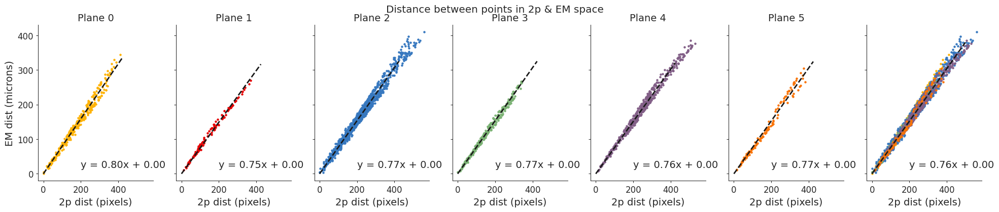

In [44]:
calibration = []

from sklearn.linear_model import LinearRegression

fig, axes = plt.subplots(1,7,figsize=(24,4),sharex=True,sharey=True)
plt.suptitle('Distance between points in 2p & EM space')
#Loop over ophys planes
for iPlane in range(6):
    print(f'Building hashes for co-registered cells in ophys plane {iPlane+1}')
    
    sub_df = coreg_df.loc[coreg_df.ophys_plane == iPlane+1]
    roi_names = np.array(sub_df['chase_key'].values)
    em_ids = np.array(sub_df['em_id'].values,dtype=int)
    em_xyz = np.array(sub_df[["pt_position_x","pt_position_y", "pt_position_z"]],dtype=float)
    em_coreg_microns = em_client.transform_position_to_microns(em_xyz)

    em_xz = em_coreg_microns[:,[0,2]] #np.array(sub_df[["pt_position_x", "pt_position_z"]],dtype=float)/scalar
    em_y = em_coreg_microns[:,1]
    
    # em_y = np.array(sub_df["pt_position_y"],dtype=float)/scalar
    ophys_xy = np.array(sub_df[["ophys_x", "ophys_y"]],dtype=float)    

    dist_list = []
    nCells = len(ophys_xy)
    dist_mat = np.zeros((2,nCells,nCells))
    iX,iY = np.triu_indices(nCells,1)
    #Loop over cells and create hashes with each cell
    for iC in range(nCells):
        for jC in range(iC+1,nCells):
            dist_mat[0,iC,jC] = np.linalg.norm(ophys_xy[iC] - ophys_xy[jC])
            dist_mat[1,iC,jC] = np.linalg.norm(em_xz[iC] - em_xz[jC])
    
    ax = axes[iPlane]; ax.set_title(f'Plane {iPlane}')
    x = dist_mat[0,iX,iY]; y = dist_mat[1,iX,iY]
    ax.scatter(x,y,marker='.',color=color_palette[iPlane])
    ax.set_xlabel('2p dist (pixels)')
    if iPlane == 0: ax.set_ylabel('EM dist (microns)')
    
    reg = LinearRegression(fit_intercept=False).fit(x.reshape(-1, 1), y.reshape(-1, 1))
    a = reg.coef_[0,0]; b = 0
    # a, b = np.polyfit(x, y, 1)
    # pdb.set_trace()
    ax.text(200, 17, f'y = {a:.2f}x + {b:.2f}', size=14)
    x = np.arange(0,425,1)
    ax.plot(x, a*x+b, color='k', linestyle='--', linewidth=2)
    
    calibration.append(np.array(((dist_mat[0,iX,iY],dist_mat[1,iX,iY]))))
    
    axes[-1].scatter(dist_mat[0,iX,iY],dist_mat[1,iX,iY],marker='.',color=color_palette[iPlane])
    # for roi_2p, roi_em in zip(ophys_xy,em_xz):


tmp = np.hstack(calibration).T

x = tmp2[:,0]; y = tmp2[:,1]
ax = axes[-1]

reg = LinearRegression(fit_intercept=False).fit(x.reshape(-1, 1), y.reshape(-1, 1))
a = reg.coef_[0,0]; b = 0

# a, b = np.polyfit(x, y, 1)

ax.text(200, 17, f'y = {a:.2f}x + {b:.2f}', size=14)
x = np.arange(0,500,1)
ax.plot(x, a*x+b, color='k', linestyle='--', linewidth=2)

ax.set_xlabel('2p dist (pixels)')
# ax.set_ylabel('EM dist (microns)')

In [8]:
pix_size = 0.77

#How many cells are within a 30x30 pixel grid?
grid_size = 102; grid_micron = grid_size*pix_size
grid_micron

78.54

In [9]:
min_um = np.min(em_coreg_microns,axis=0)
max_um = np.max(em_coreg_microns,axis=0)
min_um, max_um

(array([-242.44860756,  339.42362049, -528.53613362]),
 array([ 131.20746422,  442.05037638, -135.47481927]))

In [10]:
plane0 = 349
em_y_guesses = [plane0 + 15*i for i in range(6)]


In [12]:
buffer_um = 75
buffer = np.array((buffer_um, buffer_um, buffer_um))

min_um = np.min(em_coreg_microns,axis=0)
max_um = np.max(em_coreg_microns,axis=0)

iPlane = 0; width = 22
#Create boundin box
min_um2 = min_um.copy(); 
min_um2 = min_um2 - buffer
min_um2[1] = (em_y_guesses[iPlane] - width)

max_um2 = max_um.copy()
max_um2 = max_um2 + buffer
max_um2[1] = (em_y_guesses[iPlane] + width)
min_um2, max_um2

(array([-317.44860756,  327.        , -603.53613362]),
 array([206.20746422, 371.        , -60.47481927]))

In [46]:
pix_size = 0.77
pdfdoc = PdfPages(os.path.join(PlotDir,'whatareweworkingwith.pdf'))

#How many rois are within 50 micron grid 
grid_size_2p = 65; grid_micron = grid_size_2p*pix_size
grid_boundaries_2p = np.arange(0,512,grid_size_2p); 

# 50 um buffer around area
buffer_um = 50
buffer = np.array((buffer_um, buffer_um, buffer_um))
# plane0 = 353
# em_y_guesses = [plane0 + 13*i for i in range(6)]

plane0 = 349
em_y_guesses = [plane0 + 15*i for i in range(6)]
min_um = np.min(em_coreg_microns,axis=0)
max_um = np.max(em_coreg_microns,axis=0)

width = 20
# plt.suptitle(f'{grid_size}x{grid_size} pixel grids ->  {grid_micron:.1f}x{grid_micron:.1f} microns')
plt.suptitle(f'2-photon rois')

distances_per_plane = []
#Loop over ophys planes
for iPlane in range(6):
    fig, axes = plt.subplots(2,2,figsize=(12,12))
    plt.suptitle(f'Ophys plane {iPlane + 1}',y=0.95)

    #Create boundin box
    min_um2 = min_um.copy(); 
    min_um2 = min_um2 - buffer
    min_um2[1] = (em_y_guesses[iPlane] - width)

    max_um2 = max_um.copy()
    max_um2 = max_um2 + buffer
    max_um2[1] = (em_y_guesses[iPlane] + width)

    #Within same box, how many em cells
    grid_size_em = 50
    grid_boundaries_em = [np.arange(min_um2[0],max_um2[0],grid_size_em),np.arange(min_um2[2],max_um2[2],grid_size_em)]
    
    #Create arrays
    nGrids_2p = len(grid_boundaries_2p)
    nCells_per_grid_2p = np.zeros((nGrids_2p,nGrids_2p))
    nCells_per_grid_em = np.zeros([len(g) for g in grid_boundaries_em])

    #Get 2p cells in this plane
    indy = np.where(func_roi_centers[:,2] == iPlane)[0]
    func_roi_xy_in_plane = func_roi_centers[indy,:2]
    roi_names_in_plane = func_roi_names[indy]

    
    #Get all cells in EM volume within bounding region
    indy = np.all(nucleus_points_microns > min_um2,axis=1) & np.all(nucleus_points_microns < max_um2,axis=1)
    nucleus_points_sub = nucleus_points_microns[indy]
    em_xz = nucleus_points_sub[:,[0,2]]
    em_y = nucleus_points_sub[:,1]
    nucleus_ids_sub = nucleus_ids[indy]
    
    #Find number of 2p cells per grid
    for iX, x_bound in enumerate(grid_boundaries_2p):
        for iY, y_bound in enumerate(grid_boundaries_2p):
            #Get grid boundaries and center
            grid_xy_min = np.array([x_bound,y_bound])
            grid_xy_max = grid_xy_min + grid_size_2p
            grid_xy_ctr = grid_xy_min + grid_size_2p/2
            
            #How many are within the grid volume?
            nPts = np.sum((np.all(func_roi_xy_in_plane >= grid_xy_min,axis=1)) & (np.all(func_roi_xy_in_plane < grid_xy_max,axis=1)))
            nCells_per_grid_2p[iX,iY] = nPts

        
    #Do the same for em data
    for iX, x_bound in enumerate(grid_boundaries_em[0]):
        for iZ, z_bound in enumerate(grid_boundaries_em[1]):
            
            #Get grid boundaries and center
            grid_xz_min = np.array([x_bound,z_bound])
            grid_xz_max = grid_xz_min + grid_size_em
            grid_xz_ctr = grid_xz_min + grid_size_em/2
           
            #How many are within the grid volume?
            nPts = np.sum((np.all(em_xz >= grid_xz_min,axis=1)) & (np.all(em_xz < grid_xz_max,axis=1)))
            nCells_per_grid_em[iX,iZ] = nPts

    ax = axes[0,0]; ax.set_title('Ophys rois')
    ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color=cc(iPlane/6),marker='.',s=20)
    # ax.axis('off')

    # ax.hlines(np.median(em_y),650,1100,color='k',ls='-',zorder=0)
    ax.hlines(grid_boundaries_2p,0,512,color='k',ls='-',zorder=0,alpha=0.05)
    ax.vlines(grid_boundaries_2p,0,512,color='k',ls='-',zorder=0,alpha=0.05)
    ax.set_xlabel('Ophys-x')
    ax.set_ylabel('Ophys-y')

    ax = axes[1,0]
    sns.histplot(nCells_per_grid_2p.ravel(),color=cc(iPlane/6),ax=ax)
    ax.set_xlabel('# of cells per ophys grid grid')

    ax = axes[0,1]; ax.set_title(f'{len(em_xz)} nuclei points')
    ax.scatter(em_xz[:,0],em_xz[:,1],color=cc(iPlane/6),marker='.',s=5) #c=em_y,cmap='viridis'
    # ax.axis('off')
    # ax.hlines(np.median(em_y),650,1100,color='k',ls='-',zorder=0)
    ax.hlines(grid_boundaries_em[1],min_um2[0],max_um2[0],color='k',ls='-',zorder=0,alpha=0.15)
    ax.vlines(grid_boundaries_em[0],min_um2[2],max_um2[2],color='k',ls='-',zorder=0,alpha=0.15)
    ax.set_xlabel('EM-x')
    ax.set_ylabel('EM-z')

    ax = axes[1,1]
    sns.histplot(nCells_per_grid_em.ravel(),color=cc(iPlane/6),ax=ax)
    ax.set_xlabel('# of cells per EM grid')

    sub_df = coreg_df.loc[coreg_df.ophys_plane == iPlane+1]
    em_xyz = np.array(sub_df[["pt_position_x","pt_position_y", "pt_position_z"]],dtype=float)
    em_xyz_microns = em_client.transform_position_to_microns(em_xyz)

    em_xz = em_xyz_microns[:,[0,2]] #np.array(sub_df[["pt_position_x", "pt_position_z"]],dtype=float)/scalar
    em_y = em_xyz_microns[:,1]
    
    # em_y = np.array(sub_df["pt_position_y"],dtype=float)/scalar
    ophys_xy = np.array(sub_df[["ophys_x", "ophys_y"]],dtype=float)

    y_width = np.max(em_y)-np.min(em_y)
    # print(f'Plane {ii+1}:  min: {np.min(em_y):.1f}, max: {np.max(em_y):.1f},  mean: {np.mean(em_y):.1f}, 95th%tile: {np.percentile(em_y,95):.1f}, std: {np.std(em_y):.1f}')
    for jj in range(ophys_xy.shape[0]):
        # color = axes[0,0].scatter(ophys_xy[jj,0], ophys_xy[jj,1],marker= 'o', s=35).get_facecolors()[0]
        # axes[0,1].scatter(em_xz[jj, 0], em_xz[jj, 1],facecolors=color, marker='o',s=35)

        axes[0,0].scatter(ophys_xy[jj,0], ophys_xy[jj,1],marker= 'o',edgecolors='r',facecolors="none", s=35)
        axes[0,1].scatter(em_xz[jj, 0], em_xz[jj, 1],edgecolors='r',facecolors="none", marker='o',s=35)

    pdfdoc.savefig(fig)
    plt.close(fig)
pdfdoc.close()


            

<Figure size 640x480 with 0 Axes>

In [120]:
pix_size = 0.77
pdfdoc = PdfPages(os.path.join(PlotDir,'whatareweworkingwith_zoom.pdf'))

#How many rois are within 50 micron grid 
grid_size_2p = 65; grid_micron = grid_size_2p*pix_size
grid_boundaries_2p = np.arange(0,512,grid_size_2p); 

# 50 um buffer around area
buffer_um = 50
buffer = np.array((buffer_um, buffer_um, buffer_um))
# plane0 = 353
# em_y_guesses = [plane0 + 13*i for i in range(6)]
plane0 = 349
em_y_guesses = [plane0 + 15*i for i in range(6)]

min_um = np.min(em_coreg_microns,axis=0)
max_um = np.max(em_coreg_microns,axis=0)

width = 22
# plt.suptitle(f'{grid_size}x{grid_size} pixel grids ->  {grid_micron:.1f}x{grid_micron:.1f} microns')
plt.suptitle(f'2-photon rois')

distances_per_plane = []
#Loop over ophys planes
for iPlane in range(6):

    #Create boundin box
    min_um2 = min_um.copy(); 
    min_um2 = min_um2 - buffer
    min_um2[1] = (em_y_guesses[iPlane] - width)

    max_um2 = max_um.copy()
    max_um2 = max_um2 + buffer
    max_um2[1] = (em_y_guesses[iPlane] + width)

    #Get 2p cells in this plane
    indy = np.where(func_roi_centers[:,2] == iPlane)[0]
    func_roi_xy_in_plane = func_roi_centers[indy,:2]

    #Get all cells in EM volume within bounding region
    indy = np.all(nucleus_points_microns > min_um2,axis=1) & np.all(nucleus_points_microns < max_um2,axis=1)
    nucleus_points_sub = nucleus_points_microns[indy]
    em_xz = nucleus_points_sub[:,[0,2]]

    #Coregistered cells
    sub_df = coreg_df.loc[coreg_df.ophys_plane == iPlane+1]
    coreg_em_microns = em_client.transform_position_to_microns(np.array(sub_df[["pt_position_x","pt_position_y", "pt_position_z"]],dtype=float))
    coreg_em_xz = coreg_em_microns[:,[0,2]] 
    coreg_2p_xy = np.array(sub_df[["ophys_x", "ophys_y"]],dtype=float)

    for jj in range(coreg_2p_xy.shape[0]):
        idx = sub_df.index.values[jj]
        fig, axes = plt.subplots(1,2,figsize=(12,6))
        plt.suptitle(f'Ophys plane {iPlane + 1}',y=0.95)


        ax = axes[0]; ax.set_title(sub_df.at[idx,'chase_key'])
        ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color='k',marker='.',s=10)

        ax = axes[1]; ax.set_title(sub_df.at[idx,'em_id'])
        ax.scatter(em_xz[:,0],em_xz[:,1],color='k',marker='.',s=10) #c=em_y,cmap='viridis'

        for kk in range(coreg_2p_xy.shape[0]):
            color = axes[0].scatter(coreg_2p_xy[kk,0], coreg_2p_xy[kk,1],marker= 'o', s=35).get_facecolors()[0]
            axes[1].scatter(coreg_em_xz[kk, 0], coreg_em_xz[kk, 1],facecolors=color, marker='o',s=35)

        # axes[0].scatter(coreg_2p_xy[jj,0], coreg_2p_xy[jj,1],marker= 'o',edgecolors='r',facecolors="none", s=35)
        # axes[1].scatter(coreg_em_xz[jj, 0], coreg_em_xz[jj, 1],edgecolors='r',facecolors="none", marker='o',s=35)

        axes[0].set_xlim([coreg_2p_xy[jj,0]-39,coreg_2p_xy[jj,0]+39])
        axes[0].set_ylim([coreg_2p_xy[jj,1]-39,coreg_2p_xy[jj,1]+39])

        axes[1].set_xlim([coreg_em_xz[jj,0]-30,coreg_em_xz[jj,0]+30])
        axes[1].set_ylim([coreg_em_xz[jj,1]-30,coreg_em_xz[jj,1]+30])

        # plt.show()
        # pdb.set_trace()
        pdfdoc.savefig(fig)
        plt.close(fig)
pdfdoc.close()


            

<Figure size 640x480 with 0 Axes>

## Create hashes from coregistered cells

Building hashes for co-registered cells in ophys plane 1
Building hashes for co-registered cells in ophys plane 2
Building hashes for co-registered cells in ophys plane 3
Building hashes for co-registered cells in ophys plane 4
Building hashes for co-registered cells in ophys plane 5
Building hashes for co-registered cells in ophys plane 6


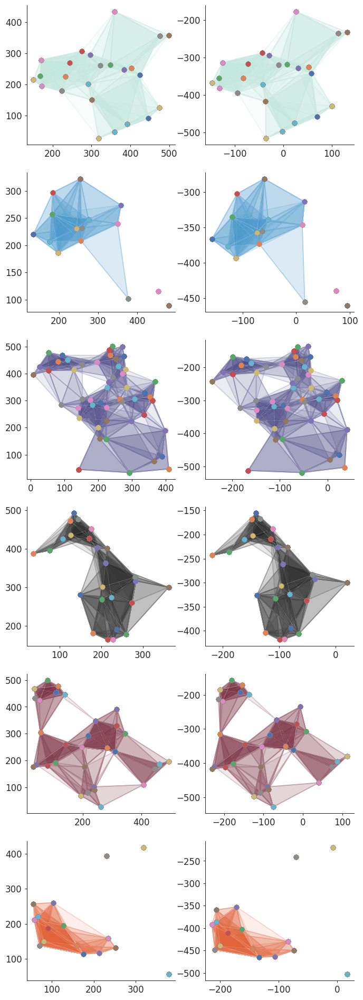

In [13]:
pix_size = 0.77; grid_size_em = 50

AC_min = 10
AD_min = 15
BC_min = 20
BD_min = 15

plane0 = 349
em_y_guesses = [plane0 + 15*i for i in range(6)]

fig, axes = plt.subplots(6,2,figsize=(8,24))

hash_dict_coreg = {}
#Loop over ophys planes
for iPlane in range(6):
    print(f'Building hashes for co-registered cells in ophys plane {iPlane+1}')
    
    #Coregistered cells
    sub_df = coreg_df.loc[coreg_df.ophys_plane == iPlane+1]
    coreg_em_microns = em_client.transform_position_to_microns(np.array(sub_df[["pt_position_x","pt_position_y", "pt_position_z"]],dtype=float))
    # coreg_em_microns = coreg_em_microns - em_origin
    coreg_em_xz = coreg_em_microns[:,[0,2]]; coreg_em_y = coreg_em_microns[:,1]
    coreg_2p_xy = np.array(sub_df[["ophys_x", "ophys_y"]],dtype=float)

    roi_names = np.array(sub_df['chase_key'].values)
    em_ids = np.array(sub_df['em_id'].values,dtype=int)

    #Create KDTree for easy searching
    kdt_2p = KDTree(coreg_2p_xy)
    kdt_em = KDTree(coreg_em_xz)
    
    # pdb.set_trace()
    hash_list = []
    #Loop over cells and create hashes with each cell
    for roi_2p, roi_em in zip(coreg_2p_xy,coreg_em_xz):
        
        #Look at the 20 closest cells in the plane and create quads out of them
        distances, indices = kdt_2p.query(roi_2p, k=10)
        
        hash_building = True; iter = 0; hashes_built = 0
        #Sub-select 4 cells to create 3 different hashes
        while hash_building:
            indy3 = np.random.choice(indices[1:],3,replace=False)
            indy4 = np.concatenate(([indices[0]],indy3))
            
            #Get quad xy
            quad_2p = coreg_2p_xy[indy4]
                
            #Calculate hash from 4 points
            hash_2p, i_abcd, error = calculate_hash(quad_2p)
            
            iter += 1
            #Check to quad was successfully created
            if (error == 1) & (iter < 1000):
                continue
            elif iter > 1000:
                hash_building = False
            
            #Calculate hash from 4 em points
            quad_em = coreg_em_xz[indy4]
            hash_em, i_abcd_em, error = calculate_hash(quad_em)
            
            #Check to quad was successfully created
            if (error == 1) & (iter < 1000):
                continue
            elif iter > 1000:
                hash_building = False
            
            if ~np.all(i_abcd_em == i_abcd):
                continue

            quad_indy = indy4[i_abcd]
            quad_2p = coreg_2p_xy[quad_indy]
            quad_em = coreg_em_xz[quad_indy]

            AB = np.linalg.norm(quad_2p[0]-quad_2p[1])*pix_size
            AC = np.linalg.norm(quad_2p[0]-quad_2p[2])*pix_size
            AD = np.linalg.norm(quad_2p[0]-quad_2p[3])*pix_size
            BC = np.linalg.norm(quad_2p[1]-quad_2p[2])*pix_size
            BD = np.linalg.norm(quad_2p[1]-quad_2p[3])*pix_size

            if (AB < grid_size_em) | (AB > 3*grid_size_em):
                continue
            
            if (AC < AC_min) | (AD < AD_min) | (BC < BC_min) | (BD < BD_min):
                continue

            #Save quad
            hash_list.append({'rois_2p': roi_names[quad_indy],
                            'nucleus_ids': em_ids[quad_indy], 
                            'ophys_xy': quad_2p,
                            'em_xz': quad_em,
                            'plane': iPlane,
                            'em_y': coreg_em_y[quad_indy],
                            'hash_2p': hash_2p,
                            'hash_em': hash_em,
                            })

            #update counter
            hashes_built += 1

            #Plot quads
            i_a = 0; i_b = 1; i_c = 2; i_d = 3
            ax = axes[iPlane,0]
            ax.plot(quad_2p[np.array([i_a,i_d,i_b,i_c,i_a]),0],quad_2p[np.array([i_a,i_d,i_b,i_c,i_a]),1],color=cc(iPlane/6),alpha=0.25,zorder=0)
            poly = Polygon(quad_2p[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
            ax.add_patch(poly)
            
            ax = axes[iPlane,1]
            ax.plot(quad_em[np.array([i_a,i_d,i_b,i_c,i_a]),0],quad_em[np.array([i_a,i_d,i_b,i_c,i_a]),1],color=cc(iPlane/6),alpha=0.25,zorder=0)
            poly = Polygon(quad_em[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
            ax.add_patch(poly)

            for jj in range(coreg_2p_xy.shape[0]):
                color = axes[iPlane,0].scatter(coreg_2p_xy[jj,0], coreg_2p_xy[jj,1],marker= 'o', s=35).get_facecolors()[0]
                axes[iPlane,1].scatter(coreg_em_xz[jj, 0], coreg_em_xz[jj, 1],facecolors=color, marker='o',s=35)
        
            if hashes_built == 5:
                hash_building = False
                
    #Save hashes for this plane
    hash_dict_coreg[iPlane] = hash_list           
    

In [14]:
hash_list = []
for iP in range(6):
    hash_list.extend(hash_dict_coreg[iP])

#Get coreg hashes 
hashes_coreg_em = np.array([t['hash_em'] for t in hash_list])
hashes_coreg_2p = np.array([t['hash_2p'] for t in hash_list])
quad_coreg_em = np.array([t['em_xz'] for t in hash_list])
quad_coreg_2p = np.array([t['ophys_xy'] for t in hash_list])
coreg_hash_distances = np.array([np.linalg.norm(h_2p-h_em) for h_2p,h_em in zip(hashes_coreg_2p,hashes_coreg_em)])

(0.0, 10.0)

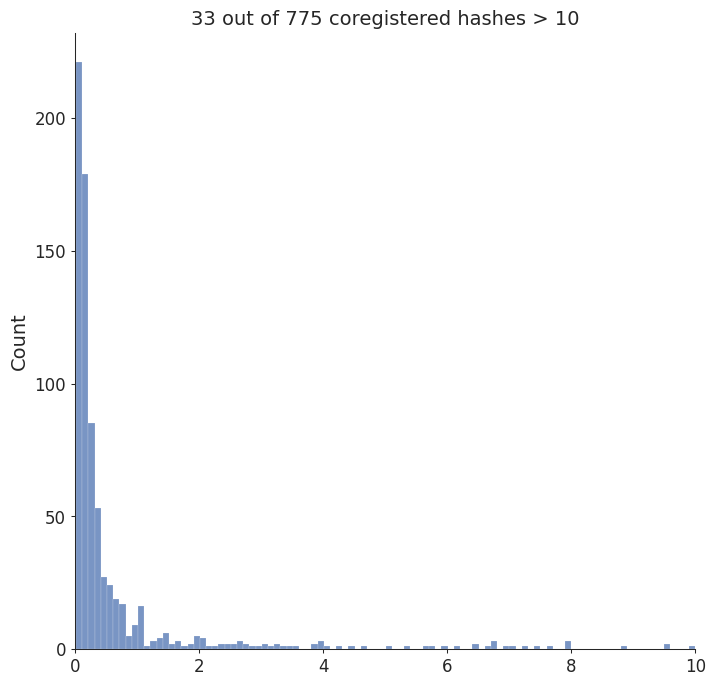

In [15]:
# coreg_hash_distances

fig, ax = plt.subplots(figsize=(8,8))
ax.set_title(f'{np.sum(coreg_hash_distances > 10)} out of {len(coreg_hash_distances)} coregistered hashes > 10')
sns.histplot(coreg_hash_distances,ax=ax)
ax.set_xlim([0,10])

In [47]:
min_um = np.min(nucleus_points_microns,axis=0)
max_um = np.max(nucleus_points_microns,axis=0)
min_um, max_um

(array([-795.73114203,   50.74799256, -718.74404532]),
 array([844.746281  , 950.42692527, 296.39706678]))

In [19]:
em_coreg_microns.shape

(161, 3)

In [51]:
em_y_guesses = np.array([349, 364, 379, 394, 409, 424])# - em_origin[1]

min_um = np.min(em_coreg_microns,axis=0)
max_um = np.max(em_coreg_microns,axis=0)

buffer_um = 50
buffer = np.array((buffer_um, buffer_um, buffer_um))
min_um, max_um

(array([-242.44860756,  339.42362049, -528.53613362]),
 array([ 131.20746422,  442.05037638, -135.47481927]))

In [16]:
pdfdoc = PdfPages(os.path.join(PlotDir,'coreg_hashes.pdf'))
zoom = False
hash_dist_list = []

width = 22
#Loop over ophys planes
for iPlane in range(6):

    #Create boundin box
    min_um2 = min_um.copy(); 
    min_um2 = min_um2 - buffer
    min_um2[1] = (em_y_guesses[iPlane] - width)

    max_um2 = max_um.copy()
    max_um2 = max_um2 + buffer
    max_um2[1] = (em_y_guesses[iPlane] + width)

    #Get 2p cells in this plane
    indy = np.where(func_roi_centers[:,2] == iPlane)[0]
    func_roi_xy_in_plane = func_roi_centers[indy,:2]

    #Get all cells in EM volume within bounding region
    indy = np.all(nucleus_points_microns > min_um2,axis=1) & np.all(nucleus_points_microns < max_um2,axis=1)
    nucleus_points_sub = nucleus_points_microns[indy]
    em_xz = nucleus_points_sub[:,[0,2]]

    #Coregistered cells
    sub_df = coreg_df.loc[coreg_df.ophys_plane == iPlane+1]
    coreg_em_microns = em_client.transform_position_to_microns(np.array(sub_df[["pt_position_x","pt_position_y", "pt_position_z"]],dtype=float))
    # coreg_em_microns = coreg_em_microns - em_origin

    coreg_em_xz = coreg_em_microns[:,[0,2]]; coreg_em_y = coreg_em_microns[:,1]
    coreg_2p_xy = np.array(sub_df[["ophys_x", "ophys_y"]],dtype=float)

    roi_names = np.array(sub_df['chase_key'].values)
    em_ids = np.array(sub_df['em_id'].values,dtype=int)

    # #Create KDTree for easy searching
    # kdt_2p = KDTree(ophys_xy)
    # kdt_em = KDTree(em_xz)

    hash_list = hash_dict_coreg[iPlane]
    
    ## Let's try to search for hashes 
    hashes_2p = np.array([t['hash_2p'] for t in hash_list])
    hashes_em = np.array([t['hash_em'] for t in hash_list])
    i_a = 0; i_b = 1; i_c = 2; i_d = 3
    
    #Loop over hashes and plot
    for iH, (h_2p, h_em) in enumerate(zip(hashes_2p,hashes_em)):
    
        quad_2p = np.vstack((np.array([[0,0],[1,1]]),h_2p.reshape(2,2)))
        quad_em = np.vstack((np.array([[0,0],[1,1]]),h_em.reshape(2,2)))

        fig, axes = plt.subplots(1,3,figsize=(24,8))
        plt.suptitle(f'Plane {iPlane}, hash {iH}')

        ax = axes[0]; ax.set_title(f'2p plane {iPlane + 1}')
        ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color='k',marker='.',s=10,alpha=.5)

        ax = axes[1]; ax.set_title('Potential EM matches')
        ax.scatter(em_xz[:,0],em_xz[:,1],color='k',marker='.',s=10,alpha=.5) #c=em_y,cmap='viridis'

        for jj in range(coreg_2p_xy.shape[0]):
            if np.any(np.all(coreg_em_xz[jj] == hash_list[iH]['ophys_xy'],axis=1)):
                continue
            color = axes[0].scatter(coreg_2p_xy[jj,0], coreg_2p_xy[jj,1],marker= 'o', s=35).get_facecolors()[0]
            axes[1].scatter(coreg_em_xz[jj, 0], coreg_em_xz[jj, 1],facecolors=color, marker='o',s=35)
            
        ax=axes[0]; ax.set_title('In 2p pixel space')
        ax=axes[1]; ax.set_title('In EM micron space')
        plot_quad(hash_list[iH]['ophys_xy'],ax=axes[0],polygon_c=color_palette[0])
        plot_quad(hash_list[iH]['em_xz'],ax=axes[1],polygon_c=color_palette[1])
        
        plot_quad(quad_2p,ax=axes[2],polygon_c=color_palette[0],label='2p hash')
        plot_quad(quad_em,ax=axes[2],polygon_c=color_palette[1],label='EM hash')
        
        hash_dist = np.linalg.norm(h_2p - h_em)
        axes[2].legend(); axes[2].set_title(f'Hash based on coordinates defined by A-B\n Hash EUC dist: {hash_dist:.2f}')
        hash_dist_list.append(hash_dist)

        center_2p = np.mean(hash_list[iH]['ophys_xy'],axis=0)
        center_em = np.mean(hash_list[iH]['em_xz'],axis=0)
        if zoom:
            axes[0].set_xlim([center_2p[0]-65,center_2p[0]+65])
            axes[0].set_ylim([center_2p[1]-65,center_2p[1]+65])

            axes[1].set_xlim([center_em[0]-50,center_em[0]+50])
            axes[1].set_ylim([center_em[1]-50,center_em[1]+50])

        # plt.show()
        # pdb.set_trace()

        pdfdoc.savefig(fig)
        plt.close(fig)
    # kdt_em = KDTree(hash_em)
    
    # distances, indices =  kdt_em.query(hash_2p[0],k=10)
    # pdb.set_trace()
pdfdoc.close()

In [17]:


hash_list = hash_dict_coreg[0]
#Get coreg hashes 
hashes_coreg_em = np.array([t['hash_em'] for t in hash_list])
hashes_coreg_2p = np.array([t['hash_2p'] for t in hash_list])
quad_coreg_em = np.array([t['em_xz'] for t in hash_list])
quad_coreg_2p = np.array([t['ophys_xy'] for t in hash_list])
coreg_hash_distances = np.array([np.linalg.norm(h_2p-h_em) for h_2p,h_em in zip(hashes_coreg_2p,hashes_coreg_em)])
np.where(coreg_hash_distances > 10)

(array([45, 48, 50, 54, 58, 87]),)

In [33]:
tmp_dict = hash_dict_coreg[0][50]
tmp_dict
# np.linalg.norm(tmp_dict['hash_2p'] - tmp_dict['hash_em'])

{'rois_2p': array(['M409828_13_1_149', 'M409828_13_1_150', 'M409828_13_1_176',
        'M409828_13_1_192'], dtype=object),
 'nucleus_ids': array([354968, 352203, 278053, 352384]),
 'ophys_xy': array([[359.60330357, 434.49975295],
        [384.42411588, 247.42104344],
        [296.34858544, 294.93833607],
        [348.38094136, 262.03118147]]),
 'em_xz': array([[  25.85220222, -176.89409494],
        [  30.27741434, -328.29720892],
        [ -28.85882537, -294.66271402],
        [   7.51190762, -318.09676954]]),
 'plane': 0,
 'em_y': array([345.17449982, 361.07704365, 344.70243089, 355.40675986]),
 'hash_2p': array([-2.54845479,  0.74600374, -0.45213517,  0.92190379]),
 'hash_em': array([-12.36348137,   0.77784806,  -4.14450067,   0.93262728])}

In [34]:
h_em, i_abcd_em, error_em = calculate_hash(tmp_dict['em_xz'])
h_2p, i_abcd_2p, error_2p = calculate_hash(tmp_dict['ophys_xy'])
h_2p, h_em

(array([-2.54845479,  0.74600374, -0.45213517,  0.92190379]),
 array([-12.36348137,   0.77784806,  -4.14450067,   0.93262728]))

In [35]:
i_abcd_em, i_abcd_2p, error_em, error_2p

(array([0, 1, 2, 3]), array([0, 1, 2, 3]), 0, 0)

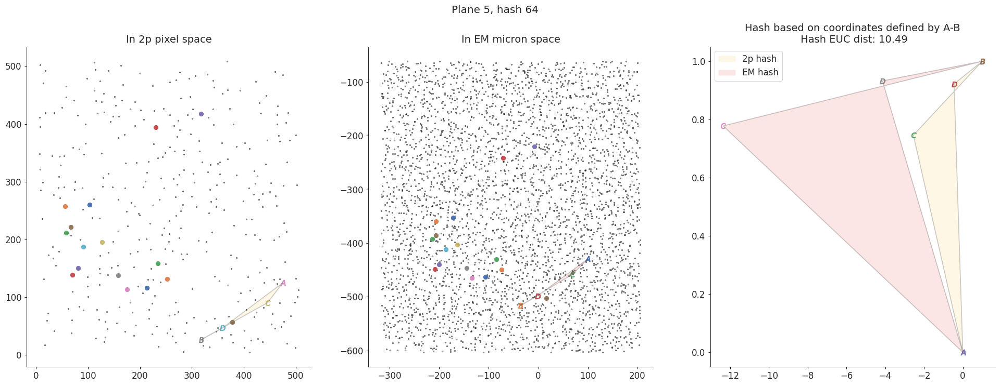

In [36]:
quad_2p = np.vstack((np.array([[0,0],[1,1]]),h_2p.reshape(2,2)))
quad_em = np.vstack((np.array([[0,0],[1,1]]),h_em.reshape(2,2)))

fig, axes = plt.subplots(1,3,figsize=(24,8))
plt.suptitle(f'Plane {iPlane}, hash {iH}')

ax = axes[0]; ax.set_title(f'2p plane {iPlane + 1}')
ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color='k',marker='.',s=10,alpha=.5)

ax = axes[1]; ax.set_title('Potential EM matches')
ax.scatter(em_xz[:,0],em_xz[:,1],color='k',marker='.',s=10,alpha=.5) #c=em_y,cmap='viridis'

for jj in range(coreg_2p_xy.shape[0]):
    if np.any(np.all(coreg_em_xz[jj] == hash_list[iH]['ophys_xy'],axis=1)):
        continue
    color = axes[0].scatter(coreg_2p_xy[jj,0], coreg_2p_xy[jj,1],marker= 'o', s=35).get_facecolors()[0]
    axes[1].scatter(coreg_em_xz[jj, 0], coreg_em_xz[jj, 1],facecolors=color, marker='o',s=35)
    
ax=axes[0]; ax.set_title('In 2p pixel space')
ax=axes[1]; ax.set_title('In EM micron space')
plot_quad(hash_list[iH]['ophys_xy'],ax=axes[0],polygon_c=color_palette[0])
plot_quad(hash_list[iH]['em_xz'],ax=axes[1],polygon_c=color_palette[1])

plot_quad(quad_2p,ax=axes[2],polygon_c=color_palette[0],label='2p hash')
plot_quad(quad_em,ax=axes[2],polygon_c=color_palette[1],label='EM hash')

hash_dist = np.linalg.norm(h_2p - h_em)
axes[2].legend(); axes[2].set_title(f'Hash based on coordinates defined by A-B\n Hash EUC dist: {hash_dist:.2f}')
hash_dist_list.append(hash_dist)

center_2p = np.mean(hash_list[iH]['ophys_xy'],axis=0)
center_em = np.mean(hash_list[iH]['em_xz'],axis=0)
if zoom:
    axes[0].set_xlim([center_2p[0]-65,center_2p[0]+65])
    axes[0].set_ylim([center_2p[1]-65,center_2p[1]+65])

    axes[1].set_xlim([center_em[0]-50,center_em[0]+50])
    axes[1].set_ylim([center_em[1]-50,center_em[1]+50])

In [19]:
# def calculate_hash(quad_xy):
quad_xy = tmp_dict['ophys_xy']
#Define cells A & B
max = 0
for i in range(4):
    for j in range(4):
        dist = np.linalg.norm(quad_xy[j]-quad_xy[i])
        if dist > max:
            i_a = i; i_b = j
            max = dist
            
A_xy = quad_xy[i_a]
B_xy = quad_xy[i_b]
A_xy, B_xy

(array([384.42411588, 247.42104344]), array([359.60330357, 434.49975295]))

In [20]:
B_xy - A_xy

array([-24.82081232, 187.07870951])

In [21]:
(quad_xy - A_xy)/(B_xy - A_xy)

array([[-0.        ,  0.        ],
       [ 1.        ,  1.        ],
       [-4.6038342 ,  0.59388676],
       [ 1.45213517,  0.07809621]])

In [ ]:

#Calculate local coordinates
quad_xy_local =  (quad_xy - A_xy)/(B_xy - A_xy)

#Define C&D relative to the coordinate system defined by A-B
i_cd = np.setxor1d([i_a,i_b],np.arange(4))

#Break C/D symmetry by x_c <= x_d & x_c + x_d<=1
if quad_xy_local[i_cd][0,0] < quad_xy_local[i_cd][1,0]:
    i_c = i_cd[0]; i_d = i_cd[1]
else:
    i_c = i_cd[1]; i_d = i_cd[0]
    
#Create hash based on CD local coordinates
quad_hash = np.concatenate((quad_xy_local[i_c],quad_xy_local[i_d]))

#Check to make sure x_c + x_d is less than 1
if (quad_hash[0] + quad_hash[2]) >= 1:
    error = 1
else: 
    error = 0

i_abcd = np.array([i_a,i_b,i_c,i_d])


In [173]:
quad_hash, i_abcd, error = calculate_hash(tmp_dict['em_xz'])
quad_hash

array([-2.00245658e+02,  4.14487228e-01, -1.14784913e+02,  1.79531009e-01])

In [144]:
len(np.unique(coreg_2p_xy[:,0]))

24

In [146]:
coreg_2p_xy[:,0]

array([172.18315505, 223.83636059, 318.00407808, 391.46631984,
       446.04172101, 233.83468478, 172.18315505, 168.51838305,
       243.79118542, 384.42411588, 498.6950205 , 359.60330357,
       475.45726869, 475.36213615, 359.30295343, 446.04172101,
       424.44536988, 402.83982199, 348.38094136, 274.83161981,
       296.34858544, 300.96137339, 170.26339286, 322.38709677,
       151.02202643, 290.93298969])

In [ ]:
for iPlane in range(6):
    print(f'Building hashes for ophys plane {iPlane+1}')
    
    #Get 2p cells in this plane
    indy = np.where(func_roi_centers[:,2] == 0)[0]
    func_roi_xy_in_plane = func_roi_centers[indy,:2]
    roi_names_in_plane = func_roi_names[indy]
    roi_areas_in_plane = func_roi_areas[indy]

    #Create KDTree for easy searching
    em_2p = KDTree(func_roi_xy_in_plane)

    hash_list = []
    #Loop over cells and create hashes with each cell
    for roi_xy in func_roi_xy_in_plane:
        
        #Look at the 20 closest cells in the plane and create quads out of them
        distances, indices = em_2p.query(roi_xy, k=20)

## Create hashes in 2p data

In [25]:
em_coreg = np.array(coreg_df[['pt_position_x','pt_position_y','pt_position_z']],dtype=float)
em_coreg = em_client.transform_position_to_microns(em_coreg)
ophys_coreg = np.array(coreg_df[['ophys_x','ophys_y','ophys_z']],dtype=float)


In [26]:
## Load data
base_folder = r"\\allen\programs\mindscope\workgroups\surround\v1dd_in_vivo_new_segmentation\data" #Server
base_folder = "/data/v1dd_in_vivo_new_segmentation" # Local on robinson for golden mouse
ophys_client = OPhysClient(base_folder)

## Central volume from golden mouse
mouse_id = 409828; col = 1; vol = 3; plane = 3

sess = ophys_client.load_ophys_session(mouse=mouse_id, column=col, volume=plane)

In [27]:
metrics_13_new = pd.read_csv('/home/david.wyrick/Git/allen_v1dd/data_frames/v1dd_metrics13_new.csv')
metrics_13_new.rename(columns={"Unnamed: 0": "chase_roi"},inplace=True)
# metrics_13_new = metrics_13_new.set_index("Unnamed: 0")
metrics_13_new = metrics_13_new.set_index('chase_roi')
valid_roi_ids = metrics_13_new.index.values



In [28]:
#Get 2p functional data for column 1 volumn 3
nwb_file = '/allen/programs/mindscope/workgroups/surround/v1dd_in_vivo_new_segmentation/data/nwbs/processed/M409828_13_20181213.nwb'
with ROI_mask_nwb(nwb_file, vol=3, mode="r") as rmn:
    # import pdb; pdb.set_trace()
    all_roi_info = [*rmn.yield_roi_info()] 
  

In [29]:
  
# Get 2p ROI center of mass in xy plane, disregarding depth for now
all_roi_raw_center_pts = np.array([center_from_pix_mask(roi.pix_mask).tolist() + [roi.plane_z] for roi in all_roi_info])

# Get names
all_roi_names = np.array([roi.name for roi in all_roi_info])
all_roi_chasenames = np.array([roi.chase_ROI for roi in all_roi_info])

#Get pixel areas
all_roi_areas = np.array([len(roi.pix_mask[0]) for roi in all_roi_info])

#Select only valid and non-duplicate cells
indices = get_array_subset_indices(all_roi_chasenames, valid_roi_ids)
func_roi_centers = all_roi_raw_center_pts[indices]
func_roi_names = all_roi_chasenames[indices]
func_roi_areas = all_roi_areas[indices]


Text(0.5, 0, 'ROI area')

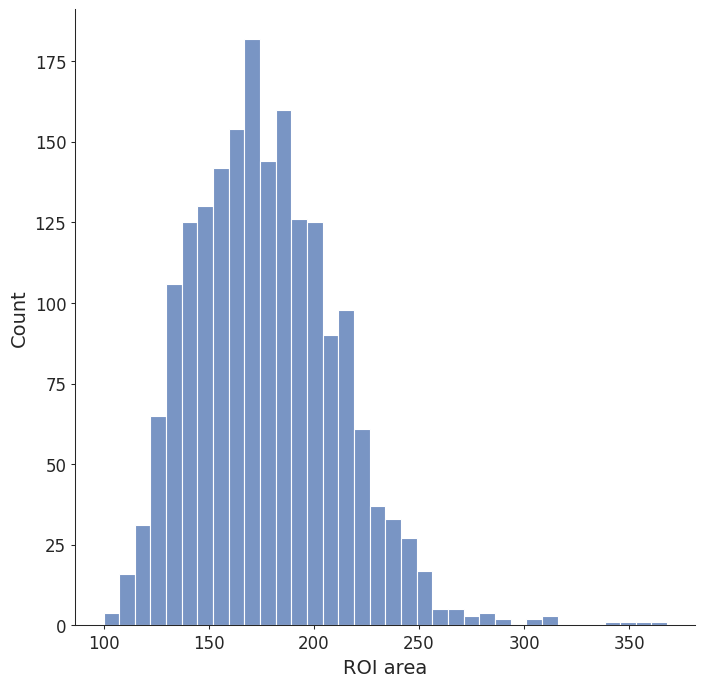

In [12]:
fig, ax = plt.subplots(figsize = (8,8))
sns.histplot(func_roi_areas)
ax.set_xlabel('ROI area')

In [30]:
pix_size = 0.77

#How many cells are within a 30x30 pixel grid?
grid_size = 65; grid_micron = grid_size*pix_size
grid_boundaries = np.arange(0,512,grid_size); 
grid_boundaries
# grid_boundaries[-1] = 512
nGrids = len(grid_boundaries)
nCells_per_grid = np.zeros((nGrids,nGrids))


In [31]:
50/.73

68.4931506849315

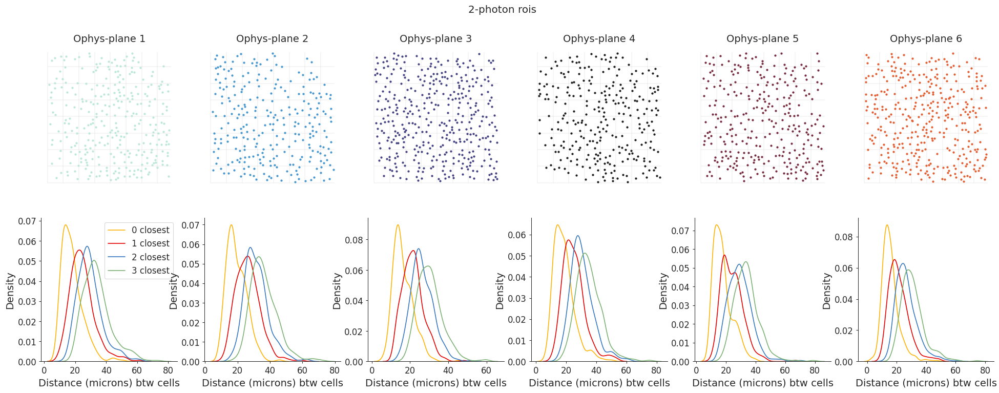

In [80]:
pix_size = 0.77
fig, axes = plt.subplots(2,6,figsize=(24,8))
# plt.suptitle(f'{grid_size}x{grid_size} pixel grids ->  {grid_micron:.1f}x{grid_micron:.1f} microns')
plt.suptitle(f'2-photon rois')

distances_per_plane = []
#Loop over ophys planes
for iPlane in range(6):
    
    #Get 2p cells in this plane
    indy = np.where(func_roi_centers[:,2] == iPlane)[0]
    func_roi_xy_in_plane = func_roi_centers[indy,:2]
    roi_names_in_plane = func_roi_names[indy]
    
    for iX, x_bound in enumerate(grid_boundaries):
        for iY, y_bound in enumerate(grid_boundaries):
            #Get grid boundaries and center
            grid_xy_min = np.array([x_bound,y_bound])
            grid_xy_max = grid_xy_min + grid_size
            grid_xy_ctr = grid_xy_min + grid_size/2
            
            #Of these 100 points, how many are within the grid volume?
            nPts = np.sum((np.all(func_roi_xy_in_plane >= grid_xy_min,axis=1)) & (np.all(func_roi_xy_in_plane < grid_xy_max,axis=1)))
            nCells_per_grid[iX,iY] = nPts
            
            # if nPts > 0:
            #     indy = np.where((np.all(func_roi_xy_in_plane >= grid_xy_min,axis=1)) & (np.all(func_roi_xy_in_plane < grid_xy_max,axis=1)))[0]
            #     roi_ids_in_grid = roi_names_in_plane[indy]
            #     for id in nucleus_ids_in_grid:
            #         if id in coreg_em_ids:
            #             coreg_dict[id] = (iX,iY,iZ) #Save grid location     
    
    ax = axes[0,iPlane]; ax.set_title(f'Ophys-plane {iPlane+1}')
    ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color=cc(iPlane/6),marker='.',s=20)
    ax.axis('off')
    # ax.hlines(np.median(em_y),650,1100,color='k',ls='-',zorder=0)
    ax.hlines(grid_boundaries,0,512,color='k',ls='-',zorder=0,alpha=0.05)
    ax.vlines(grid_boundaries,0,512,color='k',ls='-',zorder=0,alpha=0.05)
    ax.set_xlabel('Ophys-x')
    if iPlane == 0:
        ax.set_ylabel('Ophys-y')

    
    # ax = axes[1,iPlane]
    # sns.histplot(nCells_per_grid.ravel(),color=cc(iPlane/6),ax=ax)
    # ax.set_xlabel('# of cells per grid')
    # ax = axes[2,iPlane]
    # proj_raw_mean, proj_raw_max, proj_de_mean, proj_de_max, proj_de_corr = sess.get_plane_projection_images(iPlane+1)
    # ax.imshow(proj_de_max, cmap='gray', interpolation='nearest')
    # ax.set_xlim([250-grid_size/2,250+grid_size/2])
    # ax.set_ylim([250-grid_size/2,250+grid_size/2])
    
    #Create KDTree for easy searching
    kdt_2p = KDTree(func_roi_xy_in_plane)
    
    dist_list = []
    #Loop over cells and create hashes with each cell
    for roi_xy in func_roi_xy_in_plane:
        
        #Look at the 20 closest cells in the plane and create quads out of them
        distances, indices = kdt_2p.query(roi_xy, k=5)
        dist_list.append(distances[1:])
    distances = np.array(dist_list)
    distances_per_plane.append(distances)
    ax = axes[1,iPlane]
    for i in range(4):
        # sns.histplot(distances[:,i],ax=ax,color=color_palette[i],label=f'{i} closest')
        sns.kdeplot(distances[:,i],ax=ax,color=color_palette[i],label=f'{i} closest')
    if iPlane == 0:
        ax.legend()
    ax.set_xlabel('Distance (microns) btw cells')

            

In [32]:
AC_min = 10
AD_min = 15
BC_min = 20
BD_min = 15

grid_size_em = 50
grid_size_em/pix_size

64.93506493506493

Building hashes for ophys plane 1
	299 rois in plane, 2990 hashes created
Building hashes for ophys plane 2
	268 rois in plane, 2680 hashes created
Building hashes for ophys plane 3
	383 rois in plane, 3830 hashes created
Building hashes for ophys plane 4
	279 rois in plane, 2790 hashes created
Building hashes for ophys plane 5
	304 rois in plane, 3040 hashes created
Building hashes for ophys plane 6
	368 rois in plane, 3680 hashes created


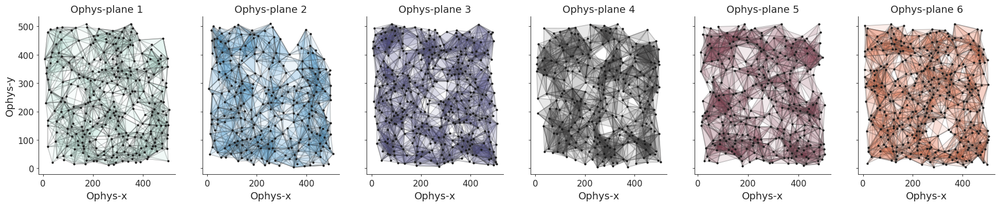

In [33]:
cc  = sns.color_palette("icefire", as_cmap=True)
cc2  = sns.color_palette("Spectral", as_cmap=True)
pix_size = 0.77
# pdfdoc = PdfPages(os.path.join(PlotDir,'hashes_per_2pcell_10random-hashes.pdf'))
fig, axes = plt.subplots(1,6,figsize=(24,4),sharey=True)

failed = []; 
star_logbook = []
hash_dict = {}
#Loop over ophys planes
for iPlane in range(6):
    print(f'Building hashes for ophys plane {iPlane+1}')
    
    #Get 2p cells in this plane
    indy = np.where(func_roi_centers[:,2] == iPlane)[0]
    func_roi_xy_in_plane = func_roi_centers[indy,:2]
    roi_names_in_plane = func_roi_names[indy]
    roi_areas_in_plane = func_roi_areas[indy]
    nCells = len(func_roi_xy_in_plane)

    #Create KDTree for easy searching
    kdt_2p = KDTree(func_roi_xy_in_plane)

    hash_list = []; stars_used = np.zeros((len(func_roi_xy_in_plane)))
    #Loop over cells and create hashes with each cell
    for iRoi, roi_xy in enumerate(func_roi_xy_in_plane):
        
        #Look at the 20 closest cells in the plane and create quads out of them
        distances, indices = kdt_2p.query(roi_xy, k=21)
        
        #Loop through 20 closest cells, creating hashes with each set of 4
        hash_building = True; iter = 0; hashes_built = 0
        #Sub-select 4 cells to create 3 different hashes
        while hash_building:
            indy3 = np.random.choice(indices[1:],3,replace=False)
            indy4 = np.concatenate(([indices[0]],indy3))
            
            #Get quad xy
            quad_2p = func_roi_xy_in_plane[indy4]
                        
            #Calculate hash from 4 points
            hash_2p, i_abcd, error = calculate_hash(quad_2p)
            quad_indy = indy4[i_abcd]
            ophys_xy = func_roi_xy_in_plane[quad_indy]

            # pdb.set_trace()
            iter += 1
            #Check to quad was successfully created
            if (error == 1) & (iter < 1000):
                continue
            elif iter > 1000:
                failed.append(hashes_built)
                hash_building = False
            
            for i in quad_indy:
                stars_used[i] += 1
            AB = np.linalg.norm(ophys_xy[0] - ophys_xy[1])*pix_size

            AC = np.linalg.norm(ophys_xy[0]-ophys_xy[2])*pix_size
            AD = np.linalg.norm(ophys_xy[0]-ophys_xy[3])*pix_size
            BC = np.linalg.norm(ophys_xy[1]-ophys_xy[2])*pix_size
            BD = np.linalg.norm(ophys_xy[1]-ophys_xy[3])*pix_size

            if (AB < grid_size_em) | (AB > 2*grid_size_em):
                continue
            
            if (AC < AC_min) | (AD < AD_min) | (BC < BC_min) | (BD < BD_min):
                continue

            #Save quad
            hash_list.append({'rois': roi_names_in_plane[quad_indy], 
                            'ophys_xy': ophys_xy,
                            'hash': hash_2p,
                            'plane': iPlane,
                            'center': np.mean(ophys_xy,axis=0),
                            'index': iRoi,
                            'AB': AB})
            
            hashes_built += 1
            if hashes_built == 10:
                hash_building = False
            
            # # # pdb.set_trace()
            # if iPlane == 0:
            #     fig2, axes2 = plt.subplots(1,2,figsize=(10,5))
            #     plt.suptitle(f'Plane {iPlane + 1}, Roi {iRoi}, sub-index {hashes_built}')
            #     axes2[0].scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color=cc(iPlane/6),marker='.',s=20,zorder=2)
            
            #     ax = axes2[0]; ax.set_title(f'AB length: {AB*pix_size:.1f} microns')
            #     ax.scatter(quad_2p[0,0],quad_2p[0,1],color='k',marker='x',s=20,zorder=2)
            #     ax.scatter(quad_2p[1:,0],quad_2p[1:,1],color='k',marker='.',s=20,zorder=2)
            #     i_a = 0; i_b = 1; i_c = 2; i_d = 3
            #     ax.plot(ophys_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],ophys_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.25,zorder=1)
            #     poly = Polygon(ophys_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc2(hashes_built/10), alpha=0.2)
            #     ax.add_patch(poly)

            #     ax = axes2[1]; ax.set_title('In local coordinates defined by pts A & B')
            #     quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),hash_2p.reshape(2,2)))
            #     plot_quad(quad_xy_local,ax=ax)

            #     pdfdoc.savefig(fig2)
            #     plt.close(fig2)
        # pdfdoc.close()
        # pdb.set_trace()
    star_logbook.append(stars_used)
    print(f'\t{nCells} rois in plane, {len(hash_list)} hashes created')   
    #Save hashes for this plane
    hash_dict[iPlane] = hash_list           
    
    #Plot hashes
    ax = axes[iPlane]; ax.set_title(f'Ophys-plane {iPlane+1}')
    ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color='k',marker='.',s=20,zorder=2)

    ax.set_xlabel('Ophys-x')
    if iPlane == 0:
        ax.set_ylabel('Ophys-y')

    hash_index = np.array([t['index'] for t in hash_list])
    for iRoi in range(nCells):
        indy = np.where(hash_index == iRoi)[0]
        for ii in np.random.choice(indy,2):
            roi_xy = hash_list[ii]['ophys_xy']
            i_a = 0; i_b = 1; i_c = 2; i_d = 3
            ax.plot(roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.25,zorder=1)
            poly = Polygon(roi_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
            ax.add_patch(poly)

# pdfdoc.close()
    

Text(0.5, 0, '# of times roi used in quad')

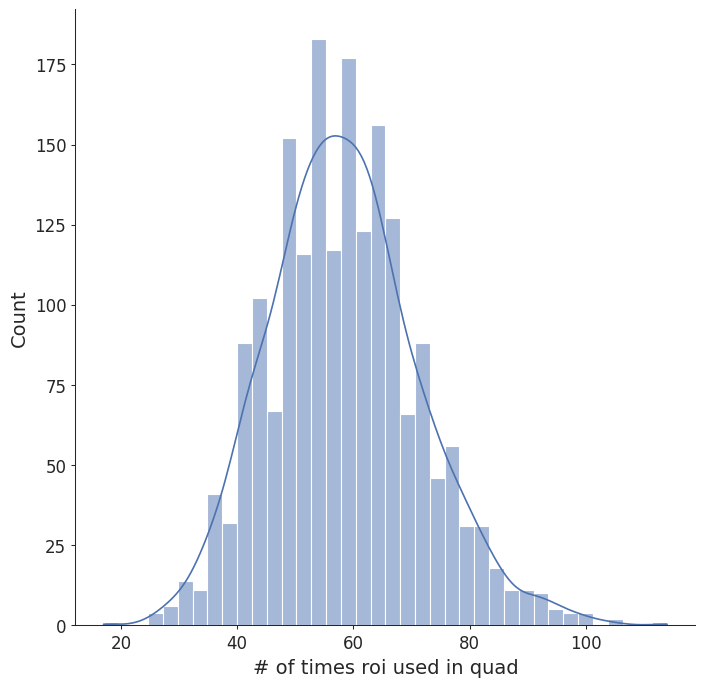

In [55]:
fig, ax = plt.subplots(figsize=(8,8))
sns.histplot(np.concatenate(star_logbook),ax=ax,kde=True)
ax.set_xlabel("# of times roi used in quad")

Building hashes for ophys plane 1
	299 rois in plane, 2646 hashes created
Building hashes for ophys plane 2
	268 rois in plane, 2418 hashes created
Building hashes for ophys plane 3
	383 rois in plane, 3326 hashes created
Building hashes for ophys plane 4
	279 rois in plane, 2462 hashes created
Building hashes for ophys plane 5
	304 rois in plane, 2634 hashes created
Building hashes for ophys plane 6
	368 rois in plane, 3290 hashes created


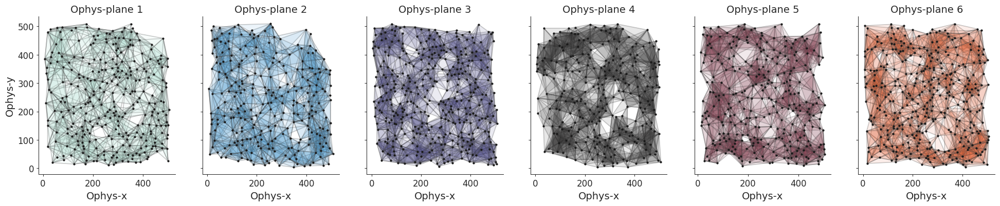

In [14]:
cc  = sns.color_palette("icefire", as_cmap=True)
cc2  = sns.color_palette("Spectral", as_cmap=True)
pix_size = 0.77
# pdfdoc = PdfPages(os.path.join(PlotDir,'hashes_per_2pcell2.pdf'))
fig, axes = plt.subplots(1,6,figsize=(24,4),sharey=True)

hash_dict = {}
#Loop over ophys planes
for iPlane in range(6):
    print(f'Building hashes for ophys plane {iPlane+1}')
    
    #Get 2p cells in this plane
    indy = np.where(func_roi_centers[:,2] == iPlane)[0]
    func_roi_xy_in_plane = func_roi_centers[indy,:2]
    roi_names_in_plane = func_roi_names[indy]
    roi_areas_in_plane = func_roi_areas[indy]
    nCells = len(func_roi_xy_in_plane)

    #Create KDTree for easy searching
    kdt_2p = KDTree(func_roi_xy_in_plane)

    hash_list = []
    #Loop over cells and create hashes with each cell
    for iRoi, roi_xy in enumerate(func_roi_xy_in_plane):
        
        #Look at the 20 closest cells in the plane and create quads out of them
        distances, indices = kdt_2p.query(roi_xy, k=21)
        hash_building = True; iter = 0; hashes_built = 0
        
        #Loop through 20 closest cells, creating hashes with each set of 4
        for iSub in range(18):
            indy3 = indices[1:][slice(iSub,iSub+3)]
            indy4 = np.concatenate(([indices[0]],indy3))
            
            #Get quad xy
            quad_2p = func_roi_xy_in_plane[indy4]
                        
            #Calculate hash from 4 points
            hash_2p, i_abcd, error = calculate_hash(quad_2p)
            quad_indy = indy4[i_abcd]
            ophys_xy = func_roi_xy_in_plane[quad_indy]

            # pdb.set_trace()
            iter += 1
            #Check to quad was successfully created
            if (error == 1) & (iter < 500):
                continue
            elif iter > 500:
                hash_building = False
            
            #Save quad
            AB = np.linalg.norm(ophys_xy[0] - ophys_xy[1])*pix_size
            hash_list.append({'rois': roi_names_in_plane[quad_indy], 
                            'ophys_xy': ophys_xy,
                            'hash': hash_2p,
                            'plane': iPlane,
                            'center': np.mean(ophys_xy,axis=0),
                            'index': iRoi,
                            'sub_index': iSub,
                            'AB': AB})
            
            hashes_built += 1
            
            # # pdb.set_trace()
            # if iPlane == 0:
            #     fig2, axes2 = plt.subplots(1,2,figsize=(10,5))
            #     plt.suptitle(f'Plane {iPlane + 1}, Roi {iRoi}, sub-index {iSub}')
            #     axes2[0].scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color=cc(iPlane/6),marker='.',s=20,zorder=2)
            
            #     ax = axes2[0]; ax.set_title(f'AB length: {AB*pix_size:.1f} microns')
            #     ax.scatter(quad_2p[0,0],quad_2p[0,1],color='k',marker='x',s=20,zorder=2)
            #     ax.scatter(quad_2p[1:,0],quad_2p[1:,1],color='k',marker='.',s=20,zorder=2)
            #     i_a = 0; i_b = 1; i_c = 2; i_d = 3
            #     ax.plot(ophys_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],ophys_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.25,zorder=1)
            #     poly = Polygon(ophys_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc2(iSub/12), alpha=0.2)
            #     ax.add_patch(poly)

            #     ax = axes2[1]; ax.set_title('In local coordinates defined by pts A & B')
            #     quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),hash_2p.reshape(2,2)))
            #     plot_quad(quad_xy_local,ax=ax)

            #     pdfdoc.savefig(fig2)
            #     plt.close(fig2)
        # pdfdoc.close()
        # pdb.set_trace()

    print(f'\t{nCells} rois in plane, {len(hash_list)} hashes created')   
    #Save hashes for this plane
    hash_dict[iPlane] = hash_list           
    
    #Plot hashes
    ax = axes[iPlane]; ax.set_title(f'Ophys-plane {iPlane+1}')
    ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color='k',marker='.',s=20,zorder=2)

    ax.set_xlabel('Ophys-x')
    if iPlane == 0:
        ax.set_ylabel('Ophys-y')

    hash_index = np.array([t['index'] for t in hash_list])
    for iRoi in range(nCells):
        indy = np.where(hash_index == iRoi)[0]
        for ii in np.random.choice(indy,2):
            roi_xy = hash_list[ii]['ophys_xy']
            i_a = 0; i_b = 1; i_c = 2; i_d = 3
            ax.plot(roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.25,zorder=1)
            poly = Polygon(roi_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
            ax.add_patch(poly)

# pdfdoc.close()
    

In [ ]:
# fig, axes = plt.subplots(1,6,figsize=(24,4),sharey=True)

# hash_dict = {}
# #Loop over ophys planes
# for iPlane in range(6):
#     print(f'Building hashes for ophys plane {iPlane+1}')
    
#     #Get 2p cells in this plane
#     indy = np.where(func_roi_centers[:,2] == 0)[0]
#     func_roi_xy_in_plane = func_roi_centers[indy,:2]
#     roi_names_in_plane = func_roi_names[indy]
#     roi_areas_in_plane = func_roi_areas[indy]

#     #Create KDTree for easy searching
#     kdt_2p = KDTree(func_roi_xy_in_plane)

#     hash_list = []
#     #Loop over cells and create hashes with each cell
#     for roi_xy in func_roi_xy_in_plane:
        
#         #Look at the 20 closest cells in the plane and create quads out of them
#         distances, indices = kdt_2p.query(roi_xy, k=21)
        
#         hash_building = True; iter = 0; hashes_built = 0
#         #Sub-select 4 cells to create 3 different hashes
#         while hash_building:
#             indy3 = np.random.choice(indices[1:],3,replace=False)
#             indy4 = np.concatenate(([indices[0]],indy3))
            
#             #Get quad xy
#             quad_2p = func_roi_xy_in_plane[indy4]
                        
#             #Calculate hash from 4 points
#             hash_2p, i_abcd, error = calculate_hash(quad_2p)
#             quad_indy = indy4[i_abcd]
#             ophys_xy = func_roi_xy_in_plane[quad_indy]
#             # pdb.set_trace()
#             iter += 1
#             #Check to quad was successfully created
#             if (error == 1) & (iter < 500):
#                 continue
#             elif iter > 500:
#                 hash_building = False
            
#             #Save quad
#             hash_list.append({'rois': roi_names_in_plane[quad_indy], 
#                             'ophys_xy': func_roi_xy_in_plane[quad_indy],
#                             'hash': hash_2p,
#                             'plane': iPlane})
#             # pdb.set_trace()
            
#             #update counter
#             hashes_built += 1

#             if hashes_built == 3:
#                 hash_building = False
                
#     #Save hashes for this plane
#     hash_dict[iPlane] = hash_list           
    
#     #Plot hashes
#     ax = axes[iPlane]; ax.set_title(f'Ophys-plane {iPlane+1}')
#     ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color=cc(iPlane/6),marker='.',s=20,zorder=2)
#     # ax.axis('off')
#     # # ax.hlines(np.median(em_y),650,1100,color='k',ls='-',zorder=0)
#     # ax.hlines(grid_boundaries,0,512,color='k',ls='-',zorder=0,alpha=0.05)
#     # ax.vlines(grid_boundaries,0,512,color='k',ls='-',zorder=0,alpha=0.05)
#     ax.set_xlabel('Ophys-x')
#     if iPlane == 0:
#         ax.set_ylabel('Ophys-y')

#     for index in np.arange(0,len(hash_list),4):
#         hash = hash_list[index]['hash']
#         quad_xy =  hash_list[index]['ophys_xy']
#         i_a = 0; i_b = 1; i_c = 2; i_d = 3
#         ax.plot(quad_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],quad_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color=cc(iPlane/6),alpha=0.25,zorder=1)
#         poly = Polygon(quad_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
#         ax.add_patch(poly)
    

Text(0.5, 0, 'Hash distances')

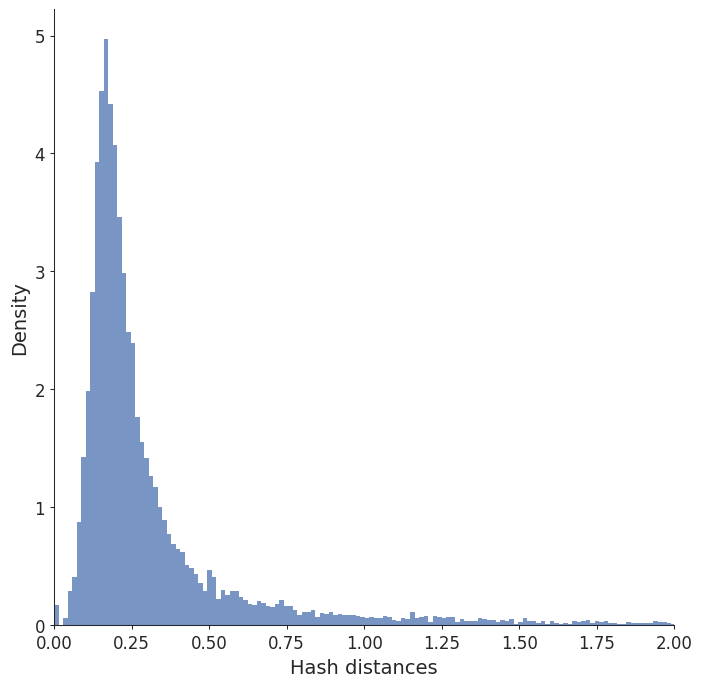

In [93]:
# #Concatenate all hashes from each plane
# all_hashes = []
# for iP in range(6):
#     all_hashes.extend(hash_dict[iP])
    
all_hashes = hash_dict[0]
## Let's try to search for hashes 
hashes = np.array([t['hash'] for t in all_hashes])
quad_xy = np.array([t['hash'] for t in all_hashes])
hash_planes = np.array([t['plane'] for t in all_hashes])

#Create KD tree of hashes
hash_kdt = KDTree(hashes)

dist_list = []; indy_list = []; closest_dist = []
for ii, hash in enumerate(hashes):
    #Query and inspect distances
    distances, indices = hash_kdt.query(hash, k=11)
    dist_list.append(distances[1:])
    closest_dist.append(distances[1])
    if np.any(distances[1:] < 0.15):
        indy_list.append(ii)
    
    
fig, ax = plt.subplots(figsize=(8,8))
sns.histplot(np.concatenate(dist_list),stat='density')
ax.set_xlim([0,2]); ax.set_xlabel('Hash distances')
# ax.vlines(0.15,0,3)

In [55]:
dist_thresh = 0.15

pdfdoc = PdfPages(os.path.join(PlotDir,'similar_hashes5.pdf'))
for iHash in indy_list:
    hash = hashes[iHash]
    quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),hash.reshape(2,2)))
    i_a = 0; i_b = 1; i_c = 2; i_d = 3
    
    #Query tree
    distances, indices = hash_kdt.query(hash, k=11)
    
    #Plot main hash
    fig, ax = plt.subplots(figsize=(8,8))
    plot_quad(quad_xy_local,ax=ax,polygon_c=cc(0))
    
    #Plot similar hashes
    for ii, (indy, d) in enumerate(zip(indices[1:],distances[1:])):
        if d < dist_thresh:
            hash = hashes[indy]
            plane = hash_planes[indy]
            quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),hash.reshape(2,2)))
            plot_quad(quad_xy_local,ax=ax,polygon_c=cc(ii/10),label=f'Hash {indy}, plane {plane}')
    ax.legend()
    pdfdoc.savefig(fig)
    plt.close(fig)
            
pdfdoc.close()
    
    
    
    

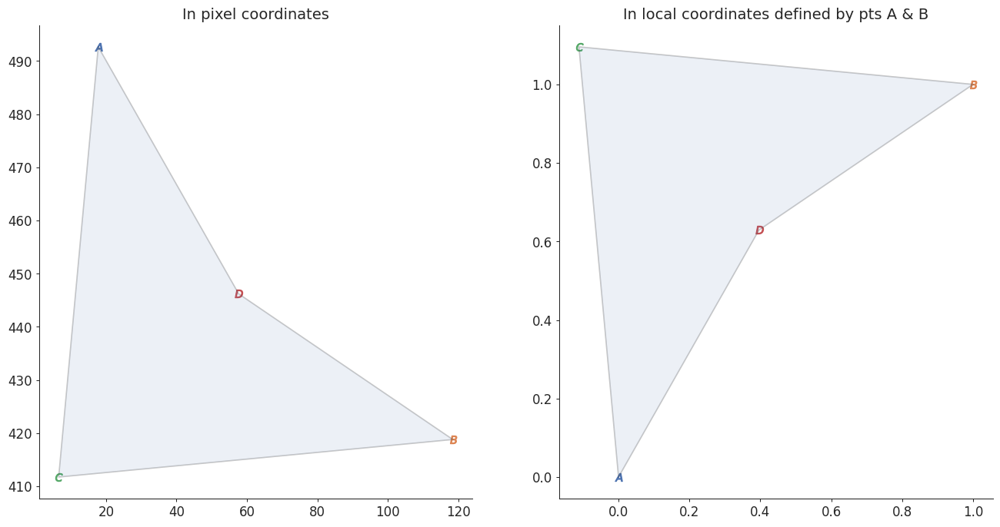

In [31]:
from matplotlib.patches import Polygon

quad_xy =  hash_list[5]['ophys_xy']
hash =  hash_list[5]['hash']
quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),hash.reshape(2,2)))

i_a = 0; i_b = 1; i_c = 2; i_d = 3

fig, axes = plt.subplots(1,2,figsize=(16,8))

ax = axes[0]; ax.set_title('In pixel coordinates')
plot_quad(quad_xy,ax=ax)

ax = axes[1]; ax.set_title('In local coordinates defined by pts A & B')
plot_quad(quad_xy_local,ax=ax)

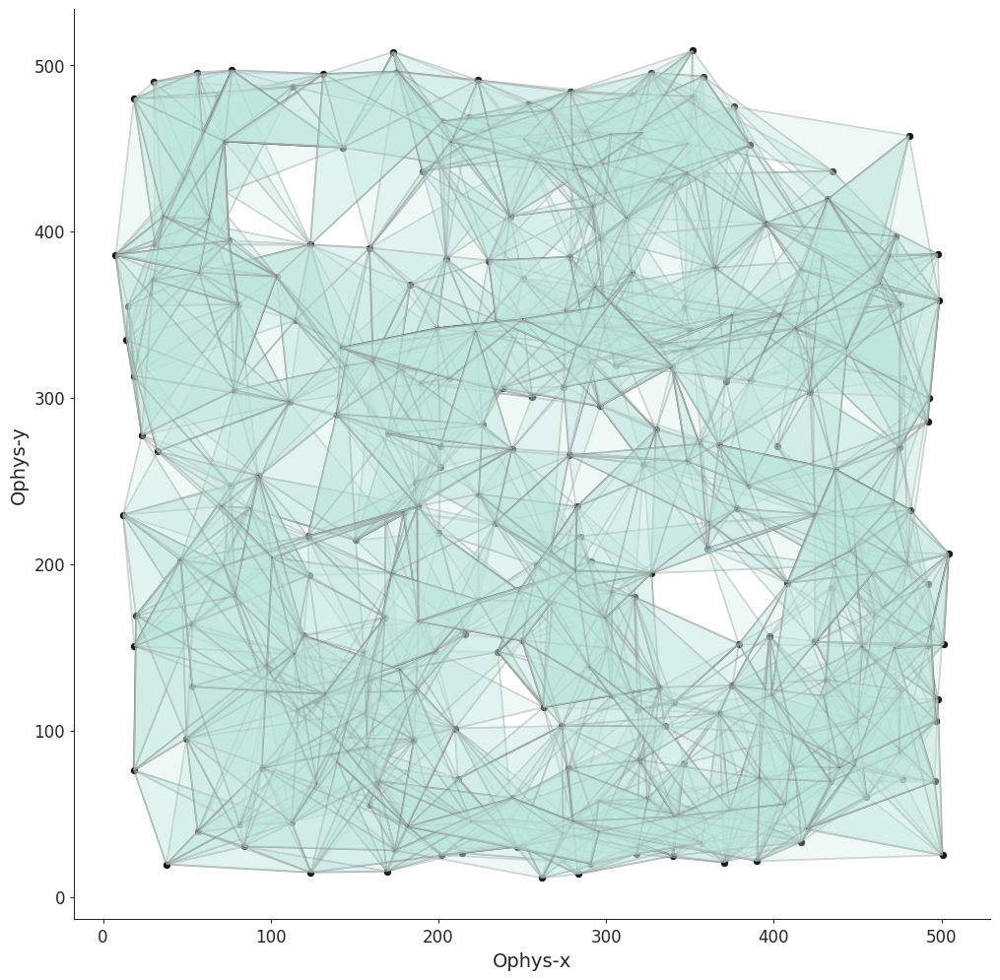

In [57]:
iPlane = 0
hash_list = hash_dict[iPlane]

## Let's try to search for hashes 
hashes = np.array([t['hash'] for t in hash_list])
ophys_xys = np.array([t['ophys_xy'] for t in hash_list])
hash_index = np.array([t['index'] for t in hash_list])

#Get 2p cells in this plane
indy = np.where(func_roi_centers[:,2] == iPlane)[0]
func_roi_xy_in_plane = func_roi_centers[indy,:2]
roi_names_in_plane = func_roi_names[indy]
roi_areas_in_plane = func_roi_areas[indy]
nCells = len(func_roi_xy_in_plane)


fig, ax = plt.subplots(figsize=(12,12))

ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],marker='o',color='k',s=20)
# ax.axis('off')
# # ax.hlines(np.median(em_y),650,1100,color='k',ls='-',zorder=0)
# ax.hlines(grid_boundaries,0,512,color='k',ls='-',zorder=0,alpha=0.05)
# ax.vlines(grid_boundaries,0,512,color='k',ls='-',zorder=0,alpha=0.05)
ax.set_xlabel('Ophys-x')
ax.set_ylabel('Ophys-y')

for iRoi in range(nCells):
    indy = np.where(hash_index == iRoi)[0]
    for ii in np.random.choice(indy,3):
        roi_xy = ophys_xys[ii]
        i_a = 0; i_b = 1; i_c = 2; i_d = 3
        ax.plot(roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.25,zorder=1)
        poly = Polygon(roi_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.25)
        ax.add_patch(poly)

In [40]:
all_hashes = []
for iP in range(6):
    all_hashes.extend(hash_dict[iP])

# all_hashes = hash_dict[0]
## Let's try to search for hashes 
hashes = np.array([t['hash'] for t in all_hashes])
quad_xy = np.array([t['ophys_xy'] for t in all_hashes])
hash_planes = np.array([t['plane'] for t in all_hashes])
sub_indices = np.array([t['sub_index'] for t in all_hashes])
np.unique(sub_indices)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17])

AB -> range: [50.0,100.0], mean: 73.6, std: 13.1
AC -> range: [10.0,98.7], mean: 38.6, std: 17.2
AD -> range: [15.0,97.8], mean: 41.6, std: 13.4
BC -> range: [20.0,99.7], mean: 54.7, std: 14.1
BD -> range: [15.0,99.2], mean: 41.1, std: 13.0


Text(0.5, 0, 'Euc distance between hash points (microns)')

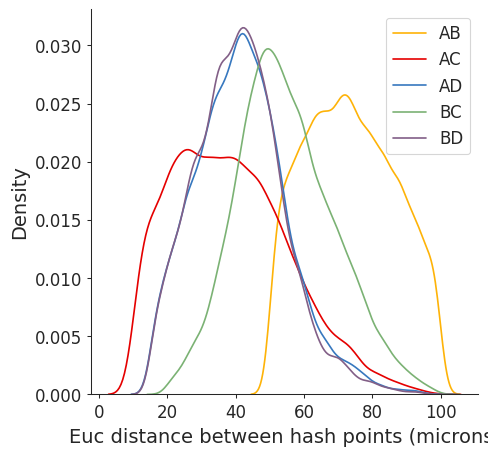

In [56]:
pix_size = 0.77
## What are the size of the query hashes? 
# #Concatenate all hashes from each plane
all_hashes = []
for iP in range(6):
    all_hashes.extend(hash_dict[iP])

# all_hashes = hash_dict[0]
## Let's try to search for hashes 
hashes = np.array([t['hash'] for t in all_hashes])
quad_xy = np.array([t['ophys_xy'] for t in all_hashes])
hash_planes = np.array([t['plane'] for t in all_hashes])
# sub_indices = np.array([t['sub_index'] for t in all_hashes])

# fig, axes = plt.subplots(3,6,figsize=(18,9),sharey=True,sharex=True)
# plt.suptitle('Hash sizes?',y=0.92)
lengths = []
# for iSub in range(18):
fig, ax = plt.subplots(figsize=(5,5))
# ax = axes[iSub//6,iSub%6]; ax.set_title(f'Sub-index {iSub}')
# indy = np.where(sub_indices == iSub)[0]

#Calculate distance between A-B, A-C, A-D, B-C, B-D
AB = []; BC = []; AC = []; AD = []; BC = []; BD = []
for quad in quad_xy:
    AB.append(np.linalg.norm(quad[0]-quad[1]))
    AC.append(np.linalg.norm(quad[0]-quad[2]))
    AD.append(np.linalg.norm(quad[0]-quad[3]))
    BC.append(np.linalg.norm(quad[1]-quad[2]))
    BD.append(np.linalg.norm(quad[1]-quad[3]))
    
print(f'AB -> range: [{np.min(AB)*pix_size:.1f},{np.max(AB)*pix_size:.1f}], mean: {np.mean(AB)*pix_size:.1f}, std: {np.std(AB)*pix_size:.1f}')
print(f'AC -> range: [{np.min(AC)*pix_size:.1f},{np.max(AC)*pix_size:.1f}], mean: {np.mean(AC)*pix_size:.1f}, std: {np.std(AC)*pix_size:.1f}')
print(f'AD -> range: [{np.min(AD)*pix_size:.1f},{np.max(AD)*pix_size:.1f}], mean: {np.mean(AD)*pix_size:.1f}, std: {np.std(AD)*pix_size:.1f}')
print(f'BC -> range: [{np.min(BC)*pix_size:.1f},{np.max(BC)*pix_size:.1f}], mean: {np.mean(BC)*pix_size:.1f}, std: {np.std(BC)*pix_size:.1f}')
print(f'BD -> range: [{np.min(BD)*pix_size:.1f},{np.max(BD)*pix_size:.1f}], mean: {np.mean(BD)*pix_size:.1f}, std: {np.std(BD)*pix_size:.1f}')
sns.kdeplot(np.array(AB)*pix_size,ax=ax,color=color_palette[0],label='AB')
sns.kdeplot(np.array(AC)*pix_size,ax=ax,color=color_palette[1],label='AC')
sns.kdeplot(np.array(AD)*pix_size,ax=ax,color=color_palette[2],label='AD')
sns.kdeplot(np.array(BC)*pix_size,ax=ax,color=color_palette[3],label='BC')
sns.kdeplot(np.array(BD)*pix_size,ax=ax,color=color_palette[4],label='BD')

lengths.append((np.mean(np.array(AB)*pix_size),np.mean(np.array(AC)*pix_size),np.mean(np.array(AD)*pix_size),np.mean(np.array(BC)*pix_size),np.mean(np.array(BD)*pix_size)))

ax.legend()
ax.set_xlabel('Euc distance between hash points (microns)')  

## Create hashes in EM data

Plane 1:  min: 339.4, max: 365.2,  mean: 352.8, median: 353.0 width: 25.8, 95th%tile: 363.4, std: 7.4
Plane 2:  min: 352.7, max: 379.4,  mean: 366.5, median: 364.9 width: 26.6, 95th%tile: 379.2, std: 7.8
Plane 3:  min: 361.1, max: 396.8,  mean: 375.0, median: 373.1 width: 35.7, 95th%tile: 392.1, std: 8.5
Plane 4:  min: 373.2, max: 402.6,  mean: 386.3, median: 385.5 width: 29.4, 95th%tile: 395.9, std: 7.2
Plane 5:  min: 384.6, max: 425.4,  mean: 404.1, median: 403.6 width: 40.9, 95th%tile: 424.0, std: 12.3
Plane 6:  min: 409.0, max: 442.1,  mean: 419.8, median: 415.1 width: 33.0, 95th%tile: 434.6, std: 8.9


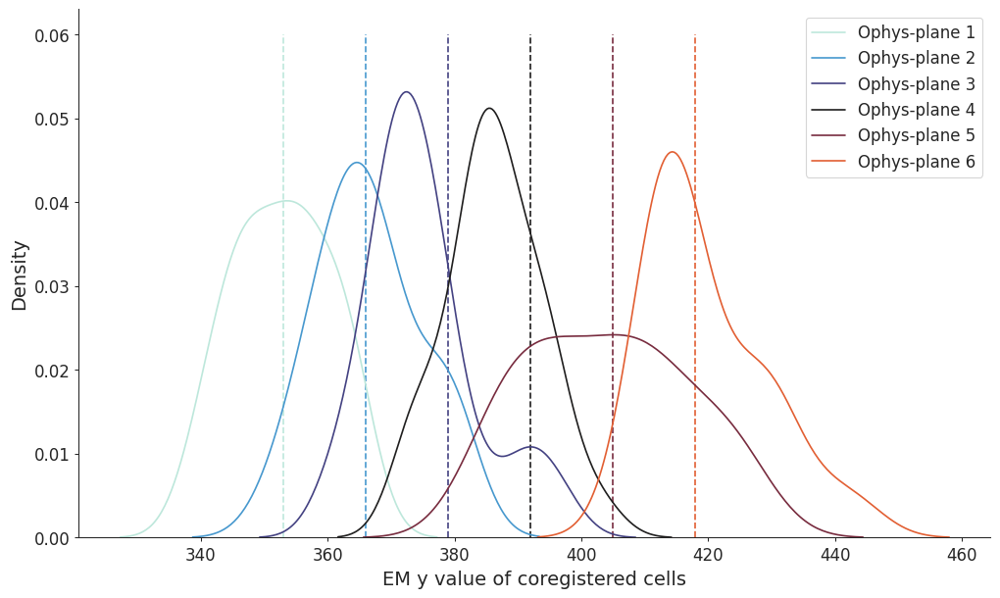

In [34]:
scalar = 1000
##Plot coregistered cells from each plane and the corresponding EM locations
fig, ax = plt.subplots(figsize=(12,7))
cc = sns.color_palette("icefire", as_cmap=True)
em_y_list = []
marker_list = ['o','x','^','*','+','s']
plane0 = 353

em_y_guesses = [plane0 + 13*i for i in range(6)]
for ii in range(6):
    

    # #Plot all 2p cells in plane
    # indy = all_2p_cell_centers[:,2] == ii
    # ax.scatter(all_2p_cell_centers[indy,0], all_2p_cell_centers[indy,1],marker= '.', color='k',s=35)

    sub_df = coreg_df.loc[coreg_df.ophys_plane == ii+1]
    em_xyz = np.array(sub_df[["pt_position_x","pt_position_y", "pt_position_z"]],dtype=float)
    em_coreg_microms = em_client.transform_position_to_microns(em_xyz)
    
    em_xz = em_coreg_microms[:,[0,2]] #np.array(sub_df[["pt_position_x", "pt_position_z"]],dtype=float)/scalar
    em_y = em_coreg_microms[:,1]
    
    ophys_xy = np.array(sub_df[["ophys_x", "ophys_y"]],dtype=float)

    em_y_list.append(em_y)
    
    sns.kdeplot(em_y,color=cc(ii/6),ax=ax,label=f'Ophys-plane {ii+1}')
    ax.vlines(em_y_guesses[ii],0,0.06,color=cc(ii/6),ls='--',zorder=0)
    # ax.scatter(em_xz[:,0],em_y,color=cc(ii/6),marker=marker_list[ii],s=30,label=f'Ophys-plane {ii+1}')
    # ax.hlines(em_y_guesses[ii],650,1100,color=cc(ii/6),ls='--',zorder=0)
    
    # print(f'Ophys plane {ii+1}: [{np.min(em_y):.1f},{np.max(em_y):.1f}], [{np.mean(em_y)-50:.1f},{np.mean(em_y)+50:.1f}]')
    print(f'Plane {ii+1}:  min: {np.min(em_y):.1f}, max: {np.max(em_y):.1f},  mean: {np.mean(em_y):.1f}, median: {np.median(em_y):.1f} width: {np.max(em_y)-np.min(em_y):.1f}, 95th%tile: {np.percentile(em_y,95):.1f}, std: {np.std(em_y):.1f}')
    
    # mean_list.append(np.median(em_y))
    
ax.set_xlabel('EM y value of coregistered cells')
ax.legend()


352.81014707094 24 24
366.5292055252722 15 15
374.95837676471484 50 50
386.28675595587697 25 25
404.10169485130905 30 31
419.7726767412654 16 16


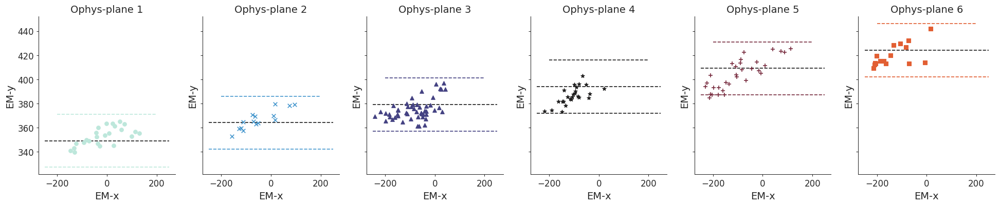

In [35]:
scalar = 1000
##Plot coregistered cells from each plane and the corresponding EM locations

fig, axes = plt.subplots(1,6,figsize=(24,4),sharey=True,sharex=True)
cc = sns.color_palette("icefire", as_cmap=True)
em_y_list = []
marker_list = ['o','x','^','*','+','s']
plane0 = 353
em_y_guesses = [plane0 + 13*i for i in range(6)]

plane0 = 349

em_y_guesses = [plane0 + 15*i for i in range(6)]

width = 22
for ii in range(6):
    
    # #Plot all 2p cells in plane
    # indy = all_2p_cell_centers[:,2] == ii
    # ax.scatter(all_2p_cell_centers[indy,0], all_2p_cell_centers[indy,1],marker= '.', color='k',s=35)

    #Coregistered cells
    sub_df = coreg_df.loc[coreg_df.ophys_plane == ii+1]
    coreg_em_microns = em_client.transform_position_to_microns(np.array(sub_df[["pt_position_x","pt_position_y", "pt_position_z"]],dtype=float))
    coreg_em_xz = coreg_em_microns[:,[0,2]]; coreg_em_y = coreg_em_microns[:,1]
    coreg_2p_xy = np.array(sub_df[["ophys_x", "ophys_y"]],dtype=float)

    em_y_list.append(coreg_em_y)
    
    # sns.kdeplot(em_y,color=cc(ii/6),ax=ax,label=f'Ophys-plane {ii+1}')
    # ax.vlines(em_y_guesses[ii],0,0.022,color=cc(ii/6),ls='--',zorder=0)
    
    ax = axes[ii]; ax.set_title(f'Ophys-plane {ii+1}')
    ax.scatter(coreg_em_xz[:,0],coreg_em_y,color=cc(ii/6),marker=marker_list[ii],s=30)
    
    ax.hlines(em_y_guesses[ii],-250,250,color='k',ls='--',zorder=0)
    
    ax.hlines(em_y_guesses[ii]-width,-250,250,color=cc(ii/6),ls='--',zorder=0)
    # if iPlane == 5:
    #     ax.hlines(em_y_guesses[ii]+25,-200,200,color=cc(ii/6),ls='--',zorder=0)
    #     print((em_y > em_y_guesses[ii]-22) & (em_y < em_y_guesses[ii]+25))
    # else:
    ax.hlines(em_y_guesses[ii]+width,-200,200,color=cc(ii/6),ls='--',zorder=0)
    print(np.mean(coreg_em_y),np.sum((coreg_em_y > em_y_guesses[ii]-width) & (coreg_em_y < em_y_guesses[ii]+width)),len(coreg_em_y))
    # ax.hlines(lower_plane_bounds[ii],-200,200,color=cc(ii/6),ls='--',zorder=0)
    # ax.hlines(upper_plane_bounds[ii],-200,200,color=cc(ii/6),ls='--',zorder=0)
    ax.set_xlabel('EM-x')
    ax.set_ylabel('EM-y')
    # print(f'Ophys plane {ii+1}: [{np.min(em_y):.1f},{np.max(em_y):.1f}], [{np.mean(em_y)-50:.1f},{np.mean(em_y)+50:.1f}]')
    
# ax.set_xlabel('EM y value of coregistered cells')
# ax.legend()
    

In [36]:
volume_thresh = 150
em_client = EMClient()

#Create query box of potential EM objects this ophys data could be coregistered to

# query_bbox = np.array([min_nm - buffer,max_nm + buffer])
#Get all cells in EM volume within bounding region
nucleus_table = em_client.materialize.query_table(
    "nucleus_detection_v0")#,filter_spatial_dict={"pt_position": query_bbox})
nucleus_table = nucleus_table.loc[nucleus_table.volume > volume_thresh]
nucleus_table.reset_index(inplace=True)

#Extract point position 
nucleus_pts = np.array([i for i in nucleus_table.pt_position])
nucleus_ids = np.array([i for i in nucleus_table.id])
nucleus_vols = np.array([i for i in nucleus_table.volume])

#Standard transform
nucleus_points_microns = em_client.transform_position_to_microns(nucleus_pts)
nucleus_table['em_microns'] = None

for ii in range(len(nucleus_points_microns)):
    nucleus_table.at[ii,'em_microns'] = nucleus_points_microns[ii]

nucleus_table = nucleus_table.set_index('id')
nucleus_ids = nucleus_table.index.values

nucleus_table.head()

/home/david.wyrick/anaconda3/envs/v1dd/lib/python3.10/site-packages/standard_transform/datasets.py:21: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot, _ = R.align_vectors(np.array([[0, 1, 0]]), [up])


,index,created,superceded_id,valid,volume,pt_supervoxel_id,pt_root_id,pt_position,bb_start_position,bb_end_position,em_microns
id,,,,,,,,,,,
228132,0,2022-02-04 06:21:10.292663+00:00,NaN,t,458.464831,87485049993200655,864691132737039043,"[632828, 749849, 738270]","[626620, 746124, 78876]","[638493, 753341, 80137]","[-272.90240857566243, 643.1244056729837, 99.05..."
203262,2,2022-02-04 06:21:10.297516+00:00,NaN,t,338.276613,87197526360541948,864691132654552792,"[624680, 531094, 283770]","[619869, 525818, 30089]","[629414, 535750, 31050]","[-282.70505678483306, 310.7332642296362, -280...."
350562,3,2022-02-04 06:21:10.300143+00:00,NaN,t,326.965400,94866276031228266,864691132773514104,"[894573, 478559, 163530]","[891003, 473981, 17111]","[898608, 483370, 18134]","[-13.227572489958257, 226.5862979342912, -382...."
718122,4,2022-02-04 06:21:10.302911+00:00,NaN,t,333.888647,118515535938912588,864691132774106773,"[1729859, 674111, 781200]","[1722177, 667205, 83852]","[1736610, 682026, 84536]","[823.8089641267544, 576.1823768548031, 160.695..."
680726,5,2022-02-04 06:21:10.305207+00:00,NaN,t,706.847075,115982398587674903,864691132780109973,"[1640231, 677370, 768015]","[1635265, 671938, 82014]","[1645663, 683268, 83401]","[734.1801361963976, 576.2391191404597, 147.119..."


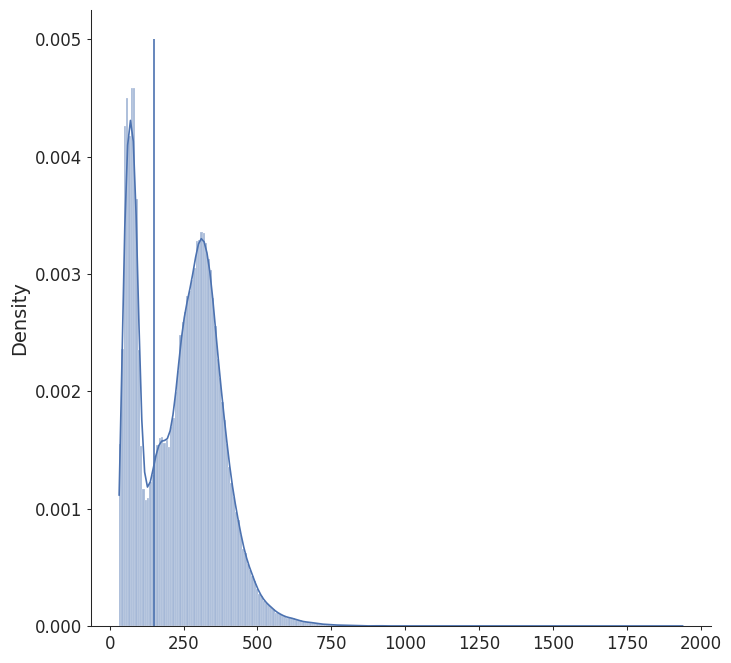

In [76]:
fig, ax = plt.subplots(figsize=(8,8))

sns.histplot(nucleus_table['volume'].values,ax=ax,kde=True,alpha=0.5,stat='density')
ax.vlines(volume_thresh,0,0.005)

0.0
0.0
0.0
0.0
0.0
0.0


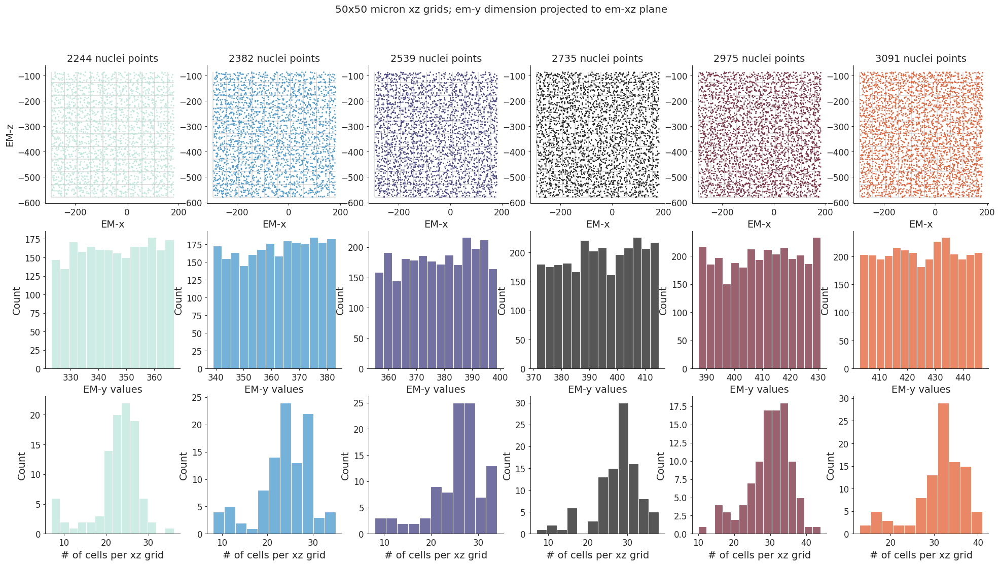

In [66]:

min_um = np.min(em_coreg,axis=0)
max_um = np.max(em_coreg,axis=0)

fig, axes = plt.subplots(3,6,figsize=(24,12))
plt.suptitle(f'{grid_size}x{grid_size} micron xz grids; em-y dimension projected to em-xz plane')

#Loop over ophys planes
for iPlane in range(6):
    
    #Create query box of potential EM objects this ophys data could be coregistered to
    min_um2 = min_um.copy(); 
    min_um2 = min_um2 - buffer
    min_um2[1] = (em_y_guesses[iPlane] - 22)

    max_um2 = max_um.copy()
    max_um2 = max_um2 + buffer
    max_um2[1] = (em_y_guesses[iPlane] + 22)
    
    #Get all cells in EM volume within bounding region
    indy = np.all(nucleus_points_microns > min_um2,axis=1) & np.all(nucleus_points_microns < max_um2,axis=1)
    nucleus_points_sub = nucleus_points_microns[indy]
    em_xz = nucleus_points_sub[:,[0,2]]
    em_y = nucleus_points_sub[:,1]
    nucleus_ids_sub = nucleus_ids[indy]
        
    # #Get 2p cells in this plane
    # indy = np.where(func_roi_centers[:,2] == iPlane)[0]
    # func_roi_in_plane = func_roi_centers[indy]
    # print(f'Ophys plane {iPlane+1} -> Ophys neurons: {len(indy)}, EM pts: {len(nucleus_pts)}')
    
    #Create KD-tree for easy searching 
    kdt_em = KDTree(em_xz)
    
    #How many cells are within a 32x32 micron grid across xz plane? 
    grid_size = 50
    em_volume_um = max_um2 - min_um2
    grid_cellnum = np.round(em_volume_um/grid_size)


    grid_boundaries = [np.arange(min_um2[0],max_um2[0],grid_size),np.arange(min_um2[2],max_um2[2],grid_size)]
    nCells_per_grid = np.zeros([len(g) for g in grid_boundaries])

    coreg_dict = {}
    for iX, x_bound in enumerate(grid_boundaries[0]):
        for iZ, z_bound in enumerate(grid_boundaries[1]):
            
            #Get grid boundaries and center
            grid_xz_min = np.array([x_bound,z_bound])
            grid_xz_max = grid_xz_min + grid_size
            grid_xz_ctr = grid_xz_min + grid_size/2

            #Use center to query em table
            distances, indices = kdt_em.query(grid_xz_ctr, k=100)
            
            #Of these 100 points, how many are within the grid volume?
            nPts = np.sum((np.all(em_xz[indices] >= grid_xz_min,axis=1)) & (np.all(em_xz[indices] < grid_xz_max,axis=1)))
            nCells_per_grid[iX,iZ] = nPts
            # pdb.set_trace()
            # if nPts > 0:
            #     indy = indices[(np.all(nucleus_pts[indices] >= grid_xyz_min,axis=1)) & (np.all(nucleus_pts[indices] < grid_xyz_max,axis=1))]
            #     nucleus_ids_in_grid = nucleus_ids[indy]
    
    ax = axes[0,iPlane]; ax.set_title(f'{len(em_xz)} nuclei points')
    ax.scatter(em_xz[:,0],em_xz[:,1],color=cc(iPlane/6),marker='.',s=5) #c=em_y,cmap='viridis'
    # ax.axis('off')
    # ax.hlines(np.median(em_y),650,1100,color='k',ls='-',zorder=0)
    ax.hlines(grid_boundaries[1],min_um2[0],max_um2[0],color='k',ls='-',zorder=0,alpha=0.15)
    ax.vlines(grid_boundaries[0],min_um2[2],max_um2[2],color='k',ls='-',zorder=0,alpha=0.15)
    ax.set_xlabel('EM-x')
    if iPlane == 0:
        ax.set_ylabel('EM-z')

    ax = axes[1,iPlane]
    sns.histplot(em_y,color=cc(iPlane/6),ax=ax)
    ax.set_xlabel('EM-y values')
    
    ax = axes[2,iPlane]
    sns.histplot(nCells_per_grid.ravel(),color=cc(iPlane/6),ax=ax)
    ax.set_xlabel('# of cells per xz grid')
    print(np.sum(nCells_per_grid.ravel()) - len(em_xz))
    
    
    # print(em_volume_nm/scalar,'microns')
    # print('# of grids per dimension: ',grid_cellnum)
    ## Create hashes of EM data in X-Z plane 
    
    # fig, axes = plt.subplots(1,2,figsize=(24,12))
    # ax = axes[0]
    # ax.scatter(nucleus_pts[:,0]/scalar,nucleus_pts[:,2]/scalar,c=nucleus_pts[:,1],cmap='viridis')
    # ax.set_xlabel('EM-x'); ax.set_ylabel('EM-z')
    # ax = axes[1]
    # ax.scatter(func_roi_in_plane[:,0]/512,func_roi_in_plane[:,1]/512,c='k')
    # ax.set_xlabel('Ophys-x'); ax.set_ylabel('Ophys-y')
    
    
    

In [38]:
min_um = np.min(em_coreg,axis=0)
max_um = np.max(em_coreg,axis=0)

buffer_um = 50
buffer = np.array((buffer_um, buffer_um, buffer_um))

In [66]:


iPlane = 0
print(f'Building hashes for ophys plane {iPlane+1}')

plane_buff = 22
#Create query box of potential EM objects this ophys data could be coregistered to
min_um2 = min_um.copy(); 
min_um2 = min_um2 - buffer
min_um2[1] = (em_y_guesses[iPlane] - plane_buff)

max_um2 = max_um.copy()
max_um2 = max_um2 + buffer
max_um2[1] = (em_y_guesses[iPlane] + plane_buff)

#Get all cells in EM volume within bounding region
indy = np.all(nucleus_points_microns > min_um2,axis=1) & np.all(nucleus_points_microns < max_um2,axis=1)
nucleus_points_sub = nucleus_points_microns[indy]
em_xz = nucleus_points_sub[:,[0,2]]
em_y = nucleus_points_sub[:,1]
nucleus_ids_sub = nucleus_ids[indy]
    
#Create KDTree for easy searching
kdt_em = KDTree(em_xz)

Building hashes for ophys plane 1


Building em hashes for ophys plane 1
	2288 rois in plane, 98900 hashes created
Building em hashes for ophys plane 2
	2381 rois in plane, 99700 hashes created
Building em hashes for ophys plane 3
	2557 rois in plane, 99800 hashes created
Building em hashes for ophys plane 4
	2761 rois in plane, 99700 hashes created
Building em hashes for ophys plane 5
	2975 rois in plane, 100000 hashes created
Building em hashes for ophys plane 6
	3091 rois in plane, 100000 hashes created


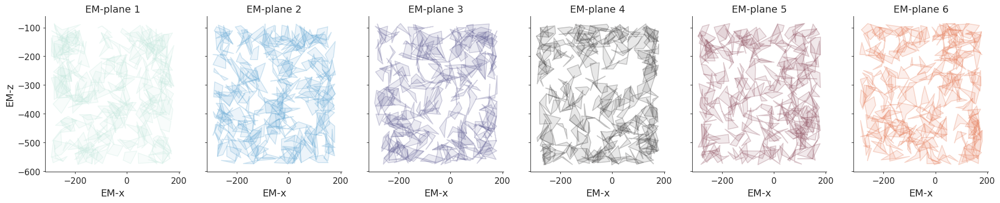

In [39]:
fig, axes = plt.subplots(1,6,figsize=(24,4),sharey=True)
hash_dict_em = {}
failed = 0

em_logbook = []
plane0 = 349
em_y_guesses = [plane0 + 15*i for i in range(6)]
plane_buff = 22
# #Loop over ophys planes
for iPlane in range(6):
# iPlane = 0
    print(f'Building em hashes for ophys plane {iPlane+1}')

    #Create query box of potential EM objects this ophys data could be coregistered to
    min_um2 = min_um.copy(); 
    min_um2 = min_um2 - buffer
    min_um2[1] = (em_y_guesses[iPlane] - plane_buff)

    max_um2 = max_um.copy()
    max_um2 = max_um2 + buffer
    max_um2[1] = (em_y_guesses[iPlane] + plane_buff)

    #Tile xz plane with grid
    grid_size = 50
    grid_boundaries = [np.arange(min_um2[0],max_um2[0],grid_size),np.arange(min_um2[2],max_um2[2],grid_size)]
    nCells_per_grid = np.zeros([len(g) for g in grid_boundaries])

    #Get all cells in EM volume within bounding region
    indy = np.all(nucleus_points_microns > min_um2,axis=1) & np.all(nucleus_points_microns < max_um2,axis=1)
    em_xyz = nucleus_points_microns[indy]; em_xz = em_xyz[:,[0,2]]; em_y = em_xyz[:,1]
    nPts = len(em_xz)
    #Subselect
    nucleus_ids_sub = nucleus_ids[indy]
    nucleus_vols_sub = nucleus_vols[indy]
        
    #Create KDTree for easy searching
    kdt_em = KDTree(em_xz)
    
    hash_list = []; stars_used = np.zeros((nPts)); em_vols = []
    #Loop over grid & attempt to build a quad in each one, a number of times
    for iX, x_bound in enumerate(grid_boundaries[0]):
        for iZ, z_bound in enumerate(grid_boundaries[1]):
            
            #Get grid boundaries and center
            grid_xz_min = np.array([x_bound,z_bound])
            grid_xz_max = grid_xz_min + grid_size
            grid_xz_ctr = grid_xz_min + grid_size/2

            #Use center to query em table
            distances, indices = kdt_em.query(grid_xz_ctr, k=100)
            
            #Of these points, how many are within the grid volume?
            indy = indices[(np.all(em_xz[indices] >= grid_xz_min,axis=1)) & (np.all(em_xz[indices] < grid_xz_max,axis=1))]

            # nucleus_ids_in_grid = nucleus_ids_sub[indy]
            # nucleus_pts_in_grid = em_xz[indy]
            nucleus_vols_in_grid = nucleus_vols_sub[indy]
            sub_indy = np.argsort(nucleus_vols_sub[indy])[::-1]
            indy10 = indy[sub_indy][:10]

            # indy10 = np.random.choice(indy,10,replace=False)

            for iCell1 in indy10:

                iter = 0
                hash_building = True; hashes_built = 0
                while hash_building:
                    
                    distances, indices = kdt_em.query(em_xz[iCell1], k=101)
                    indy3 = np.random.choice(indices[1:],3,replace=False)
                    indy4 = np.concatenate(([iCell1],indy3))

                    #Get quad xy
                    quad_em = em_xz[indy4]

                    #Calculate hash from 4 points
                    hash_em, i_abcd, error = calculate_hash(quad_em)
                    quad_indy = indy4[i_abcd]
                    quad_em = em_xz[quad_indy]
                
                    #Check to quad was successfully created
                    iter += 1
                    if (error == 1) & (iter < 5000):
                        continue
                    elif iter > 5000:
                        failed.append(hashes_built)
                        hash_building = False
                        

                    #AB, AC, AD, BC, BD
                    AB = np.linalg.norm(quad_em[0]-quad_em[1])
                    AC = np.linalg.norm(quad_em[0]-quad_em[2])
                    AD = np.linalg.norm(quad_em[0]-quad_em[3])
                    BC = np.linalg.norm(quad_em[1]-quad_em[2])
                    BD = np.linalg.norm(quad_em[1]-quad_em[3])
                    if (AB < grid_size) | (AB > 2*grid_size):
                        continue

                    if (AC < AC_min) | (AD < AD_min) | (BC < BC_min) | (BD < BD_min):
                        continue

                    for i in quad_indy:
                        stars_used[i] += 1

                    #Save quad
                    hash_list.append({'nucleus_ids': nucleus_ids_sub[quad_indy], 
                                    'em_xz': em_xz[quad_indy],
                                    'em_y': em_y[quad_indy],
                                    'hash': hash_em,
                                    'plane': iPlane,
                                    'center': np.mean(quad_em,axis=0),
                                    'volumes': nucleus_vols_sub[quad_indy],
                                    'AB': AB})

                    hashes_built += 1
                    if hashes_built == 100:
                        hash_building = False
            

    #         if iPlane == 0:
    #             fig2, axes2 = plt.subplots(1,2,figsize=(10,5))
    #             plt.suptitle(f'Plane {iPlane + 1}, Roi {iRoi}, sub-index {iSub}')
    #             axes2[0].scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color=cc(iPlane/6),marker='.',s=20,zorder=2)
            
    #             ax = axes2[0]; ax.set_title(f'AB length: {AB*pix_size:.1f} microns')
    #             ax.scatter(quad_2p[0,0],quad_2p[0,1],color='k',marker='x',s=20,zorder=2)
    #             ax.scatter(quad_2p[1:,0],quad_2p[1:,1],color='k',marker='.',s=20,zorder=2)
    #             i_a = 0; i_b = 1; i_c = 2; i_d = 3
    #             ax.plot(ophys_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],ophys_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.25,zorder=1)
    #             poly = Polygon(ophys_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc2(iSub/12), alpha=0.2)
    #             ax.add_patch(poly)

    #             ax = axes2[1]; ax.set_title('In local coordinates defined by pts A & B')
    #             quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),hash_2p.reshape(2,2)))
    #             plot_quad(quad_xy_local,ax=ax)

    #             pdfdoc.savefig(fig2)
    #             plt.close(fig2)
    #     # pdfdoc.close()
    #     # pdb.set_trace()
    em_logbook.append(stars_used)
    print(f'\t{nPts} rois in plane, {len(hash_list)} hashes created')   
    #Save hashes for this plane
    hash_dict_em[iPlane] = hash_list           

    #Plot hashes
    ax = axes[iPlane]; ax.set_title(f'EM-plane {iPlane+1}')
    # ax.scatter(em_xz[:,0],em_xz[:,1],color='k',marker='.',s=20,zorder=2)
    ax.set_xlabel('EM-x')
    if iPlane == 0:
        ax.set_ylabel('EM-z')

    plot_indices = np.random.choice(np.arange(len(hash_list)),200,replace=False)
    for index in plot_indices:
        hash = hash_list[index]['hash']
        quad_xy =  hash_list[index]['em_xz']
        i_a = 0; i_b = 1; i_c = 2; i_d = 3
        # plot_quad(quad_xy,ax=ax,polygon_c=cc(iPlane/6))
        ax.plot(quad_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],quad_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color=cc(iPlane/6),alpha=0.25,zorder=1)
        poly = Polygon(quad_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
        ax.add_patch(poly)     


In [40]:
all_hashes = []
for iP in range(6):
    all_hashes.extend(hash_dict_em[iP])

# all_hashes = hash_dict[0]
## Let's try to search for hashes 
volumes = np.array([t['volumes'] for t in all_hashes])
volumes.shape

(598100, 4)

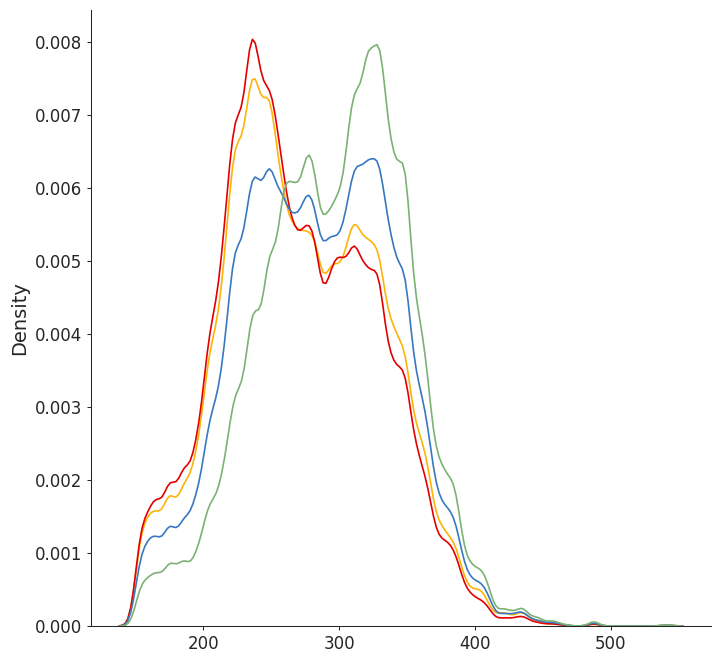

In [41]:
fig, ax = plt.subplots(figsize=(8,8))

for i in range(4):
    sns.kdeplot(volumes[:,i],ax=ax,color=color_palette[i])
# ax.set_xlabel("# of times em point used in quad")

Text(0.5, 0, '# of times em point used in quad')

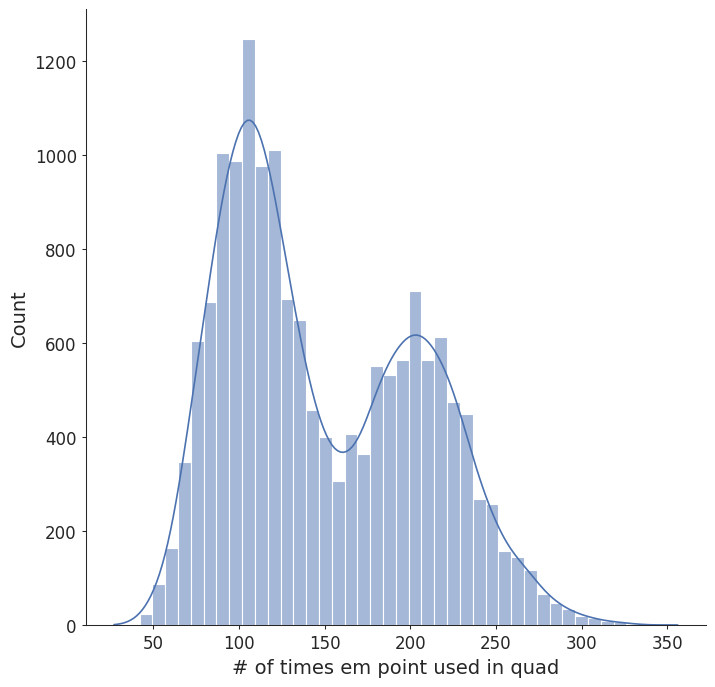

In [42]:
fig, ax = plt.subplots(figsize=(8,8))
sns.histplot(np.concatenate(em_logbook),ax=ax,kde=True)
ax.set_xlabel("# of times em point used in quad")

2p AB -> range: [50.0,100.0], mean: 73.3, std: 13.2
EM AB -> range: [50.0,100.0], mean: 72.7, std: 12.9
2p AC -> range: [10.0,98.2], mean: 38.4, std: 17.0
EM AC -> range: [10.0,99.6], mean: 38.1, std: 16.5
2p AD -> range: [15.0,96.7], mean: 41.7, std: 13.5
EM AD -> range: [15.0,99.6], mean: 41.0, std: 12.7
2p BC -> range: [20.1,99.7], mean: 54.6, std: 14.4
EM BC -> range: [20.0,99.7], mean: 53.5, std: 13.7
2p BD -> range: [15.0,96.3], mean: 40.9, std: 13.0
EM BD -> range: [15.0,99.4], mean: 40.5, std: 12.3


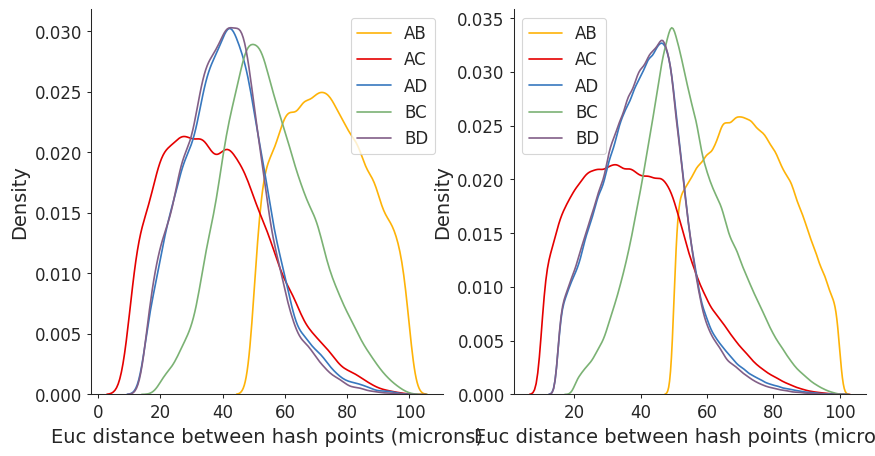

In [43]:
pix_size = 0.77
## What are the size of the query hashes? 
# #Concatenate all hashes from each plane
all_hashes = []
for iP in range(6):
    all_hashes.extend(hash_dict[iP])

# all_hashes = hash_dict[0]
## Let's try to search for hashes 
hashes = np.array([t['hash'] for t in all_hashes])
quad_xy = np.array([t['ophys_xy'] for t in all_hashes])
hash_planes = np.array([t['plane'] for t in all_hashes])
# sub_indices = np.array([t['sub_index'] for t in all_hashes])

# fig, axes = plt.subplots(3,6,figsize=(18,9),sharey=True,sharex=True)
# plt.suptitle('Hash sizes?',y=0.92)
lengths = []
# for iSub in range(18):
fig, axes = plt.subplots(1,2,figsize=(10,5))

ax = axes[0]

#Calculate distance between A-B, A-C, A-D, B-C, B-D
AB = []; BC = []; AC = []; AD = []; BC = []; BD = []
for quad in quad_xy:
    AB.append(np.linalg.norm(quad[0]-quad[1]))
    AC.append(np.linalg.norm(quad[0]-quad[2]))
    AD.append(np.linalg.norm(quad[0]-quad[3]))
    BC.append(np.linalg.norm(quad[1]-quad[2]))
    BD.append(np.linalg.norm(quad[1]-quad[3]))

sns.kdeplot(np.array(AB)*pix_size,ax=ax,color=color_palette[0],label='AB')
sns.kdeplot(np.array(AC)*pix_size,ax=ax,color=color_palette[1],label='AC')
sns.kdeplot(np.array(AD)*pix_size,ax=ax,color=color_palette[2],label='AD')
sns.kdeplot(np.array(BC)*pix_size,ax=ax,color=color_palette[3],label='BC')
sns.kdeplot(np.array(BD)*pix_size,ax=ax,color=color_palette[4],label='BD')

lengths.append((np.mean(np.array(AB)*pix_size),np.mean(np.array(AC)*pix_size),np.mean(np.array(AD)*pix_size),np.mean(np.array(BC)*pix_size),np.mean(np.array(BD)*pix_size)))

ax.legend()
ax.set_xlabel('Euc distance between hash points (microns)')  



## What are the size of the query hashes? 
# #Concatenate all hashes from each plane
all_hashes = []
for iP in range(6):
    all_hashes.extend(hash_dict_em[iP])

# all_hashes = hash_dict[0]
## Let's try to search for hashes 
hashes = np.array([t['hash'] for t in all_hashes])
quad_xz = np.array([t['em_xz'] for t in all_hashes])
hash_planes = np.array([t['plane'] for t in all_hashes])
# sub_indices = np.array([t['sub_index'] for t in all_hashes])
ax = axes[1]

#Calculate distance between A-B, A-C, A-D, B-C, B-D
AB2 = []; BC2 = []; AC2 = []; AD2 = []; BC2 = []; BD2 = []
for quad in quad_xz:
    AB2.append(np.linalg.norm(quad[0]-quad[1]))
    AC2.append(np.linalg.norm(quad[0]-quad[2]))
    AD2.append(np.linalg.norm(quad[0]-quad[3]))
    BC2.append(np.linalg.norm(quad[1]-quad[2]))
    BD2.append(np.linalg.norm(quad[1]-quad[3]))


sns.kdeplot(np.array(AB2),ax=ax,color=color_palette[0],label='AB')
sns.kdeplot(np.array(AC2),ax=ax,color=color_palette[1],label='AC')
sns.kdeplot(np.array(AD2),ax=ax,color=color_palette[2],label='AD')
sns.kdeplot(np.array(BC2),ax=ax,color=color_palette[3],label='BC')
sns.kdeplot(np.array(BD2),ax=ax,color=color_palette[4],label='BD')

lengths.append((np.mean(np.array(AB)*pix_size),np.mean(np.array(AC)*pix_size),np.mean(np.array(AD)*pix_size),np.mean(np.array(BC)*pix_size),np.mean(np.array(BD)*pix_size)))
ax.legend()
ax.set_xlabel('Euc distance between hash points (microns)')  


    
print(f'2p AB -> range: [{np.min(AB)*pix_size:.1f},{np.max(AB)*pix_size:.1f}], mean: {np.mean(AB)*pix_size:.1f}, std: {np.std(AB)*pix_size:.1f}')
print(f'EM AB -> range: [{np.min(AB2):.1f},{np.max(AB2):.1f}], mean: {np.mean(AB2):.1f}, std: {np.std(AB2):.1f}')

print(f'2p AC -> range: [{np.min(AC)*pix_size:.1f},{np.max(AC)*pix_size:.1f}], mean: {np.mean(AC)*pix_size:.1f}, std: {np.std(AC)*pix_size:.1f}')
print(f'EM AC -> range: [{np.min(AC2):.1f},{np.max(AC2):.1f}], mean: {np.mean(AC2):.1f}, std: {np.std(AC2):.1f}')

print(f'2p AD -> range: [{np.min(AD)*pix_size:.1f},{np.max(AD)*pix_size:.1f}], mean: {np.mean(AD)*pix_size:.1f}, std: {np.std(AD)*pix_size:.1f}')
print(f'EM AD -> range: [{np.min(AD2):.1f},{np.max(AD2):.1f}], mean: {np.mean(AD2):.1f}, std: {np.std(AD2):.1f}')

print(f'2p BC -> range: [{np.min(BC)*pix_size:.1f},{np.max(BC)*pix_size:.1f}], mean: {np.mean(BC)*pix_size:.1f}, std: {np.std(BC)*pix_size:.1f}')
print(f'EM BC -> range: [{np.min(BC2):.1f},{np.max(BC2):.1f}], mean: {np.mean(BC2):.1f}, std: {np.std(BC2):.1f}')

print(f'2p BD -> range: [{np.min(BD)*pix_size:.1f},{np.max(BD)*pix_size:.1f}], mean: {np.mean(BD)*pix_size:.1f}, std: {np.std(BD)*pix_size:.1f}')
print(f'EM BD -> range: [{np.min(BD2):.1f},{np.max(BD2):.1f}], mean: {np.mean(BD2):.1f}, std: {np.std(BD2):.1f}')

In [ ]:
AC_min = 10
AD_min = 15
BC_min = 20
BD_min = 15

In [ ]:
# pdfdoc = PdfPages(os.path.join(PlotDir,'hashes_em_per_2pcell.pdf'))
# fig, axes = plt.subplots(1,6,figsize=(24,4),sharey=True)

# hash_dict_em = {}
# # #Loop over ophys planes
# for iPlane in range(6):
# # iPlane = 0
#     print(f'Building hashes for ophys plane {iPlane+1}')

#     #Create query box of potential EM objects this ophys data could be coregistered to
#     min_um2 = min_um.copy(); 
#     min_um2 = min_um2 - buffer
#     min_um2[1] = (em_y_guesses[iPlane] - 22)

#     max_um2 = max_um.copy()
#     max_um2 = max_um2 + buffer
#     max_um2[1] = (em_y_guesses[iPlane] + 22)

#     #Get all cells in EM volume within bounding region
#     indy = np.all(nucleus_points_microns > min_um2,axis=1) & np.all(nucleus_points_microns < max_um2,axis=1)
#     em_xyz = nucleus_points_microns[indy]; em_xz = em_xyz[:,[0,2]]; em_y = em_xyz[:,1]
#     nucleus_ids_sub = nucleus_ids[indy]
        
#     #Create KDTree for easy searching
#     kdt_em = KDTree(em_xz)

#     hash_list = []
#     #Loop over cells and create hashes with each cell
#     for indy1, pt_xz in enumerate(em_xz):
        
#         #Look at the 100 closest nuclei pts in the xz plane and create quads out of them
#         distances, indices = kdt_em.query(pt_xz, k=750)
        
#         #Select nuclei points where the points are at least greater than 20 microns and less than 120 microns
#         indy = np.where((distances <  125))[0] #distances
#         distances = distances[indy]; indices = indices[indy]
        
#         hash_building = True; iter = 0; hashes_built = 0
        
#         #Sub-select 4 cells to create 10 different hashes
#         while hash_building:
#             indy3 = np.random.choice(indices,3,replace=False)
#             indy4 = np.concatenate(([indy1],indy3))
            
#             #Get quad xy
#             quad_xy = em_xz[indy4] #np.vstack((pt_xz.reshape(1,2),em_xz[indy3]))
            
#             #Define cells A & B
#             max = 0
#             for i in range(4):
#                 for j in range(4):
#                     dist = np.linalg.norm(quad_xy[j]-quad_xy[i])
#                     if dist > max:
#                         i_a = i; i_b = j
#                         max = dist
                        
#             A_xy = quad_xy[i_a]
#             B_xy = quad_xy[i_b]
            
#             #Calculate local coordinates
#             quad_xy_local =  (quad_xy - A_xy)/(B_xy - A_xy)
            
#             #Define C&D relative to the coordinate system defined by A-B
#             i_cd = np.setxor1d([i_a,i_b],np.arange(4))
        
#             #Break C/D symmetry by x_c <= x_d & x_c + x_d<=1
#             if quad_xy_local[i_cd][0,0] < quad_xy_local[i_cd][1,0]:
#                 i_c = i_cd[0]; i_d = i_cd[1]
#             else:
#                 i_c = i_cd[1]; i_d = i_cd[0]
                
#             #Create hash based on CD local coordinates
#             quad_hash = np.concatenate((quad_xy_local[i_c],quad_xy_local[i_d]))
            
#             iter += 1
#             #Check to make sure x_c + x_d is less than 1
#             if (quad_hash[0] + quad_hash[2]) >= 1:
#                 continue
#             elif iter > 500:
#                 hash_building = False
            
#             #Save quad
#             quad_indy = indy4[np.array([i_a,i_b,i_c,i_d])]
#             hash_list.append({'nucleus_ids': nucleus_points_sub[quad_indy], 
#                             'em_xz': em_xz[quad_indy],
#                             'em_y': em_y[quad_indy],
#                             'hash': quad_hash})
#             # pdb.set_trace()
            
#             #update counter
#             hashes_built += 1

#             if hashes_built == 5:
#                 hash_building = False
                
#     #Save hashes for this plane
#     hash_dict_em[iPlane] = hash_list
    
    
#     #Plot hashes
#     ax = axes[iPlane]; ax.set_title(f'Ophys-plane {iPlane+1}')
#     # ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color=cc(iPlane/6),marker='.',s=20,zorder=2)
#     # ax.axis('off')
#     # # ax.hlines(np.median(em_y),650,1100,color='k',ls='-',zorder=0)
#     # ax.hlines(grid_boundaries,0,512,color='k',ls='-',zorder=0,alpha=0.05)
#     # ax.vlines(grid_boundaries,0,512,color='k',ls='-',zorder=0,alpha=0.05)
#     ax.set_xlabel('EM-x')
#     if iPlane == 0:
#         ax.set_ylabel('EM-z')

#     for index in np.arange(0,len(hash_list),5):
#         hash = hash_list[index]['hash']
#         quad_xy =  hash_list[index]['em_xz']
#         i_a = 0; i_b = 1; i_c = 2; i_d = 3
#         # plot_quad(quad_xy,ax=ax,polygon_c=cc(iPlane/6))
#         ax.plot(quad_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],quad_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color=cc(iPlane/6),alpha=0.25,zorder=1)
#         poly = Polygon(quad_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
#         ax.add_patch(poly)     


## Match query hashes in 2p to EM

In [53]:
iPlane = 0

#Get coreg hashes 
hash_list = hash_dict_coreg[iPlane]
hashes_coreg_em = np.array([t['hash_em'] for t in hash_list])
hashes_coreg_2p = np.array([t['hash_2p'] for t in hash_list])
quad_coreg_em = np.array([t['em_xz'] for t in hash_list])
quad_coreg_2p = np.array([t['ophys_xy'] for t in hash_list])

#Get em hashes
hash_list = hash_dict_em[iPlane]
hashes_em = np.array([t['hash'] for t in hash_list])
quad_em = np.array([t['em_xz'] for t in hash_list])
hash_em_y = np.array([t['em_y'] for t in hash_list])

#Get 2p hashes
hash_list = hash_dict[iPlane]
hashes_2p = np.array([t['hash'] for t in hash_list])
quad_2p = np.array([t['ophys_xy'] for t in hash_list])
hash_plane = np.array([t['plane'] for t in hash_list])

#Create KD tree of hashes
kdt_em = KDTree(hashes_em)

In [54]:
hashes_2p = np.vstack((hashes_coreg_2p,hashes_2p))
hashes_em = np.vstack((hashes_coreg_em,hashes_em))
quad_2p = np.vstack((quad_coreg_2p,quad_2p))
quad_em = np.vstack((quad_coreg_em,quad_em))

kdt_em = KDTree(hashes_em)

5.144949959299492

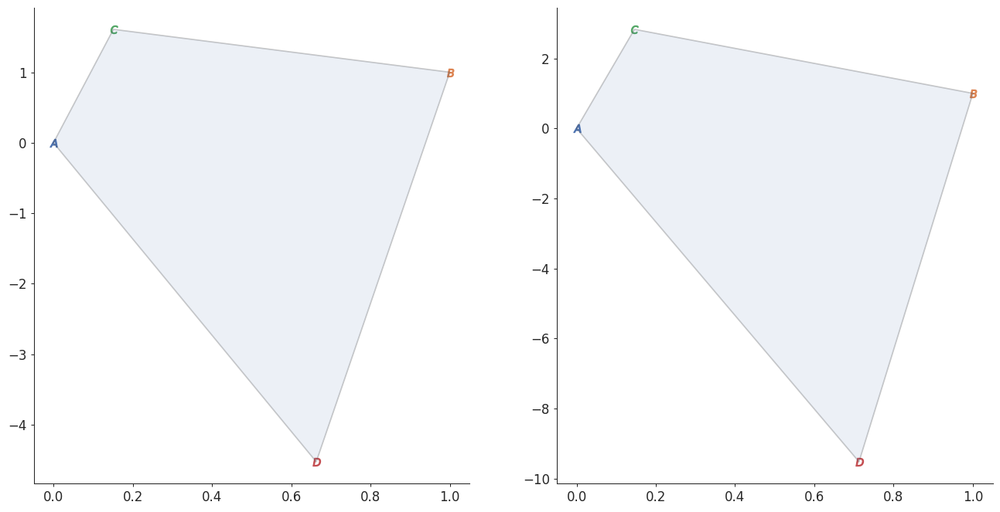

In [57]:

fig, axes = plt.subplots(1,2,figsize = (16,8))

h_2p = hashes_coreg_2p[iH]
quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),h_2p.reshape(2,2)))
plot_quad(quad_xy_local,ax=axes[0])

h_em = hashes_coreg_em[iH]
quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),h_em.reshape(2,2)))
plot_quad(quad_xy_local,ax=axes[1])

np.linalg.norm(h_2p - h_em)

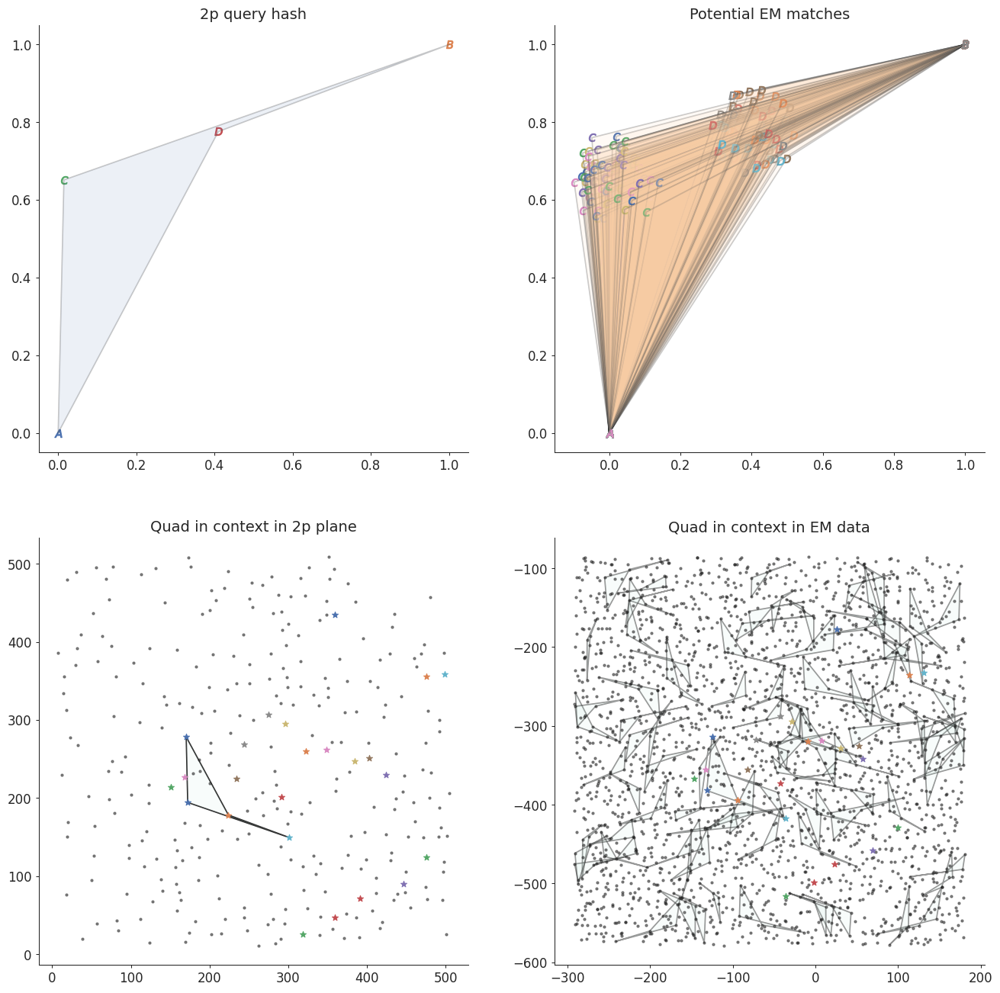

In [59]:
iPlane = 0
#Get 2p cells in this plane
indy = np.where(func_roi_centers[:,2] == iPlane)[0]
func_roi_xy_in_plane = func_roi_centers[indy,:2]

#Get potential EM pts for this plane
#Create query box of potential EM objects this ophys data could be coregistered to
min_um2 = min_um.copy(); 
min_um2 = min_um2 - buffer
min_um2[1] = (em_y_guesses[iPlane] - plane_buff)

max_um2 = max_um.copy()
max_um2 = max_um2 + buffer
max_um2[1] = (em_y_guesses[iPlane] + plane_buff)

#Get all cells in EM volume within bounding region
indy = np.all(nucleus_points_microns > min_um2,axis=1) & np.all(nucleus_points_microns < max_um2,axis=1)
em_xyz = nucleus_points_microns[indy]; em_xz = em_xyz[:,[0,2]]; em_y = em_xyz[:,1]

iH = 2
dist_thresh = 0.5

query_hash = hashes_2p[iH]
quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),query_hash.reshape(2,2)))
    
#Search index for matches
distances, indices = kdt_em.query(query_hash, k=100)

fig, axes = plt.subplots(2,2,figsize = (16,16))

axes[0,0].set_title('2p query hash')
plot_quad(quad_xy_local,ax=axes[0,0])

for ii, (indy, d) in enumerate(zip(indices,distances)):
    if d < dist_thresh:
        hash = hashes_em[indy]
        quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),hash.reshape(2,2)))
        plot_quad(quad_xy_local,ax=axes[0,1],polygon_c=cc(ii/10))

        ax = axes[1,1]
        
        quad_xz = quad_em[indy]
        i_a = 0; i_b = 1; i_c = 2; i_d = 3
        ax.plot(quad_xz[np.array([i_a,i_d,i_b,i_c,i_a]),0],quad_xz[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.5,zorder=1)
        poly = Polygon(quad_xz[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
        ax.add_patch(poly)

axes[0,1].set_title('Potential EM matches')

axes[1,0].set_title('Quad in context in 2p plane')
ax = axes[1,0]
ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color='k',marker='.',s=20,zorder=2,alpha=0.5)
roi_xy = quad_2p[iH]
i_a = 0; i_b = 1; i_c = 2; i_d = 3
ax.plot(roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',zorder=1)
poly = Polygon(roi_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
ax.add_patch(poly)

axes[1,1].set_title('Quad in context in EM data')
ax = axes[1,1]
ax.scatter(em_xz[:,0],em_xz[:,1],color='k',marker='.',s=20,zorder=2,alpha=0.5)

sub_df = coreg_df.loc[coreg_df.ophys_plane == iPlane+1]
coreg_em_microns = em_client.transform_position_to_microns(np.array(sub_df[["pt_position_x","pt_position_y", "pt_position_z"]],dtype=float))
coreg_em_xz = coreg_em_microns[:,[0,2]] 

# em_y = np.array(sub_df["pt_position_y"],dtype=float)/scalar
coreg_ophys_xy = np.array(sub_df[["ophys_x", "ophys_y"]],dtype=float)

for jj in range(coreg_ophys_xy.shape[0]):
    color = axes[1,0].scatter(coreg_ophys_xy[jj,0], coreg_ophys_xy[jj,1],marker= '*', s=35,zorder=2).get_facecolors()[0]
    axes[1,1].scatter(coreg_em_xz[jj, 0], coreg_em_xz[jj, 1],facecolors=color, marker='*',s=35,zorder=2)

    # axes[0,0].scatter(ophys_xy[jj,0], ophys_xy[jj,1],marker= 'o',edgecolors='r',facecolors="none", s=35)
    # axes[0,1].scatter(em_xz[jj, 0], em_xz[jj, 1],edgecolors='r',facecolors="none", marker='o',s=35)




In [60]:
pdfdoc = PdfPages(os.path.join(PlotDir,'em-2p_potential_matches3.pdf'))
#Get 2p cells in this plane
indy = np.where(func_roi_centers[:,2] == iPlane)[0]
func_roi_xy_in_plane = func_roi_centers[indy,:2]

#Get potential EM pts for this plane
#Create query box of potential EM objects this ophys data could be coregistered to
min_um2 = min_um.copy(); 
min_um2 = min_um2 - buffer
min_um2[1] = (em_y_guesses[iPlane] - plane_buff)

max_um2 = max_um.copy()
max_um2 = max_um2 + buffer
max_um2[1] = (em_y_guesses[iPlane] + plane_buff)

#Get all cells in EM volume within bounding region
indy = np.all(nucleus_points_microns > min_um2,axis=1) & np.all(nucleus_points_microns < max_um2,axis=1)
em_xyz = nucleus_points_microns[indy]; em_xz = em_xyz[:,[0,2]]; em_y = em_xyz[:,1]

iH = 5
dist_thresh = 0.5

for iH, query_hash in enumerate(tqdm(hashes_2p)):
    #Extract query hash
    quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),query_hash.reshape(2,2)))

    # query_hash = hashes_2p[iH]
    # quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),query_hash.reshape(2,2)))
        
    #Search index for matches
    distances, indices = kdt_em.query(query_hash, k=100)

    fig, axes = plt.subplots(2,2,figsize = (16,16))

    axes[0,0].set_title('2p query hash')
    plot_quad(quad_xy_local,ax=axes[0,0])

    for ii, (indy, d) in enumerate(zip(indices,distances)):
        if d < dist_thresh:
            hash = hashes_em[indy]
            quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),hash.reshape(2,2)))
            plot_quad(quad_xy_local,ax=axes[0,1],polygon_c=cc(ii/10))

            ax = axes[1,1]
            
            quad_xz = quad_em[indy]
            i_a = 0; i_b = 1; i_c = 2; i_d = 3
            ax.plot(quad_xz[np.array([i_a,i_d,i_b,i_c,i_a]),0],quad_xz[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.25,zorder=1)
            poly = Polygon(quad_xz[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
            ax.add_patch(poly)

    axes[0,1].set_title('Potential EM matches')

    axes[1,0].set_title('Quad in context in 2p plane')
    ax = axes[1,0]
    ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color='k',marker='.',s=20,zorder=2)
    roi_xy = quad_2p[iH]
    i_a = 0; i_b = 1; i_c = 2; i_d = 3
    ax.plot(roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.25,zorder=1)
    poly = Polygon(roi_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
    ax.add_patch(poly)

    axes[1,1].set_title('Quad in context in EM data')
    ax = axes[1,1]
    ax.scatter(em_xz[:,0],em_xz[:,1],color='k',marker='.',s=20,zorder=2)

    sub_df = coreg_df.loc[coreg_df.ophys_plane == iPlane+1]
    coreg_em_microns = em_client.transform_position_to_microns(np.array(sub_df[["pt_position_x","pt_position_y", "pt_position_z"]],dtype=float))
    coreg_em_xz = coreg_em_microns[:,[0,2]] 

    # em_y = np.array(sub_df["pt_position_y"],dtype=float)/scalar
    coreg_ophys_xy = np.array(sub_df[["ophys_x", "ophys_y"]],dtype=float)

    for jj in range(ophys_xy.shape[0]):
        color = axes[1,0].scatter(coreg_ophys_xy[jj,0], coreg_ophys_xy[jj,1],marker= 'o', s=35,zorder=2).get_facecolors()[0]
        axes[1,1].scatter(coreg_em_xz[jj, 0], coreg_em_xz[jj, 1],facecolors=color, marker='o',s=35,zorder=2)

        # axes[0,0].scatter(ophys_xy[jj,0], ophys_xy[jj,1],marker= 'o',edgecolors='r',facecolors="none", s=35)
        # axes[0,1].scatter(em_xz[jj, 0], em_xz[jj, 1],edgecolors='r',facecolors="none", marker='o',s=35)

    pdfdoc.savefig(fig)
    plt.close(fig)
pdfdoc.close()



  0%|          | 0/3110 [00:00<?, ?it/s]

In [ ]:
roi_xy

In [57]:
    ax.scatter(func_roi_xy_in_plane[:,0],func_roi_xy_in_plane[:,1],color='k',marker='.',s=20,zorder=2)

    ax.set_xlabel('Ophys-x')
    if iPlane == 0:
        ax.set_ylabel('Ophys-y')

    hash_index = np.array([t['index'] for t in hash_list])
    for iRoi in range(nCells):
        indy = np.where(hash_index == iRoi)[0]
        for ii in np.random.choice(indy,2):
            roi_xy = hash_list[ii]['ophys_xy']
            i_a = 0; i_b = 1; i_c = 2; i_d = 3
            ax.plot(roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),0],roi_xy[np.array([i_a,i_d,i_b,i_c,i_a]),1],color='k',alpha=0.25,zorder=1)
            poly = Polygon(roi_xy[np.array([i_a,i_d,i_b,i_c])], facecolor=cc(iPlane/6), alpha=0.1)
            ax.add_patch(poly)

array([0.07750835, 0.22886573, 0.25482787, 0.26438023, 0.27420481,
       0.29695385, 0.30475542, 0.30531649, 0.3072071 , 0.32369244])

In [ ]:
dist_thresh = 0.15

pdfdoc = PdfPages(os.path.join(PlotDir,'similar_hashes3.pdf'))
for iHash in indy_list:
    hash = hashes[iHash]
    quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),hash.reshape(2,2)))
    i_a = 0; i_b = 1; i_c = 2; i_d = 3
    
    #Query tree
    distances, indices = hash_kdt.query(hash, k=11)
    
    #Plot main hash
    fig, ax = plt.subplots(figsize=(8,8))
    plot_quad(quad_xy_local,ax=ax,polygon_c=cc(0))
    
    #Plot similar hashes
    for ii, (indy, d) in enumerate(zip(indices[1:],distances[1:])):
        if d < dist_thresh:
            hash = hashes[indy]
            plane = hash_planes[indy]
            quad_xy_local = np.vstack((np.array([[0,0],[1,1]]),hash.reshape(2,2)))
            plot_quad(quad_xy_local,ax=ax,polygon_c=cc(ii/10),label=f'Hash {indy}, plane {plane}')
    ax.legend()
    pdfdoc.savefig(fig)
    plt.close(fig)
            
pdfdoc.close()
    
    
    
    

## Construct 3D grid of EM data

In [ ]:
# How many cells are within a volume specified by grid_size?
grid_size = 32
scalar = 1E3

em_xyz_min = np.min(nucleus_pts,axis=0)
em_xyz_max = np.max(nucleus_pts,axis=0)

em_volume_nm = em_xyz_max-em_xyz_min
grid_cellnum = np.round(em_volume_nm/scalar/grid_size)
print(em_volume_nm/scalar,'microns')
print('# of grids per dimension: ',grid_cellnum)

In [ ]:
# Match cells used for creating co-registration transform to nucleus location 
em_kdt = KDTree(nucleus_pts)

grid_boundaries = [np.arange(em_xyz_min[i],em_xyz_max[i],grid_size*scalar) for i in range(3)]
nCells_per_grid = np.zeros([len(g) for g in grid_boundaries])

coreg_dict = {}
for iX, x_bound in enumerate(grid_boundaries[0]):
    for iY, y_bound in enumerate(grid_boundaries[1]):
        for iZ, z_bound in enumerate(grid_boundaries[2]):
            #Get grid boundaries and center
            grid_xyz_min = np.array([x_bound,y_bound,z_bound])
            grid_xyz_max = grid_xyz_min + grid_size*scalar
            grid_xyz_ctr = grid_xyz_min + grid_size*scalar/2

            #Use center to query em table
            distances, indices = em_kdt.query(grid_xyz_ctr, k=100)
            
            #Of these 100 points, how many are within the grid volume?
            nPts = np.sum((np.all(nucleus_pts[indices] >= grid_xyz_min,axis=1)) & (np.all(nucleus_pts[indices] < grid_xyz_max,axis=1)))
            nCells_per_grid[iX,iY,iZ] = nPts
            if nPts > 0:
                indy = indices[(np.all(nucleus_pts[indices] >= grid_xyz_min,axis=1)) & (np.all(nucleus_pts[indices] < grid_xyz_max,axis=1))]
                nucleus_ids_in_grid = nucleus_ids[indy]
                for id in nucleus_ids_in_grid:
                    if id in coreg_em_ids:
                        coreg_dict[id] = (iX,iY,iZ) #Save grid location         

In [ ]:
#If we did this right, the total sum of "nCells_per_grid" should be equal to the # of em pts in the table
np.sum(nCells_per_grid.ravel()) == len(nucleus_table)

In [ ]:
fig, ax = plt.subplots(figsize=(10,4))
cc,tt = np.unique(nCells_per_grid.ravel(),return_counts=True)
# sns.barplot(cc, tt,ax=ax)
ax.bar(cc, tt)
ax.set_xticks(cc)
ax.set_xlabel(f'# of em points per {grid_size}x{grid_size}x{grid_size}micron grid volume')
ax.set_ylabel('Counts')

In [ ]:
labels = ['x','y','z']
coreg_gridlocs = np.stack(coreg_dict.values())

fig, axes = plt.subplots(1,3,figsize = (9,3))
plt.suptitle('Co-registered cells grid locations')
for i in range(3):
    sns.histplot(coreg_gridlocs[:,i],ax=axes[i])
    axes[i].set_xlabel(f'{labels[i]} grid #')

## Within each grid, create quads of nucleus points
Set distance between the 2 most distant points to be 1 - sqrt(2) times that of the side-length -f the grid-cells

In [ ]:
# Match cells used for creating co-registration transform to nucleus location 
em_kdt = KDTree(nucleus_pts)

grid_boundaries = [np.arange(em_xyz_min[i],em_xyz_max[i],grid_size*scalar) for i in range(3)]
nCells_per_grid = np.zeros([len(g) for g in grid_boundaries])

coreg_dict = {}
for iX, x_bound in enumerate(grid_boundaries[0]):
    for iY, y_bound in enumerate(grid_boundaries[1]):
        for iZ, z_bound in enumerate(grid_boundaries[2]):

            #Get grid boundaries and center
            grid_xyz_min = np.array([x_bound,y_bound,z_bound])
            grid_xyz_max = grid_xyz_min + grid_size*scalar
            grid_xyz_ctr = grid_xyz_min + grid_size*scalar/2

            #Use center to query em table
            distances, indices = em_kdt.query(grid_xyz_ctr, k=100)
            
            #Of these 100 points, how many are within the grid volume?
            nPts = np.sum((np.all(nucleus_pts[indices] >= grid_xyz_min,axis=1)) & (np.all(nucleus_pts[indices] < grid_xyz_max,axis=1)))
            nCells_per_grid[iX,iY,iZ] = nPts

            #This grid has points within it
            if nPts > 0:
                indy = indices[(np.all(nucleus_pts[indices] >= grid_xyz_min,axis=1)) & (np.all(nucleus_pts[indices] < grid_xyz_max,axis=1))]
                nucleus_ids_in_grid = nucleus_ids[indy]
                nucleus_pts_in_grid = nucleus_pts[indy]

                if nPts >= 5:
                    pdb.set_trace()

                

   

In [ ]:
distances, indices = em_kdt.query(nucleus_pts_in_grid[0], k=10)


In [ ]:
nucleus_pts_in_grid

In [ ]:
xyz = nucleus_pts_in_grid


In [ ]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')

ax.scatter(xyz[:,0], xyz[:,1], xyz[:,2], marker='o')
ax.set_xlim(grid_xyz_min[0]-5*scalar,grid_xyz_max[0]+5*scalar)
ax.set_ylim(grid_xyz_min[1]-5*scalar,grid_xyz_max[1]+5*scalar)
ax.set_zlim(grid_xyz_min[2]-5*scalar,grid_xyz_max[2]+5*scalar)

In [ ]:
quad_indy = np.random.choice(nPts,4,replace=False)
plot_quad = np.concatenate((quad_indy,[quad_indy[0]]))
quad_indy

In [ ]:

CD

In [ ]:
dist_mat = np.zeros((4,4))
for ii, iPt in enumerate(quad_indy):
    for jj, jPt in enumerate(quad_indy):
        if ii > jj:
            continue
        dist_mat[ii,jj] = np.linalg.norm(xyz[iPt] - xyz[jPt])
# sns.heatmap(dist_mat/scalar,annot=True)
AB = np.squeeze(np.where(dist_mat == np.max(dist_mat)))

#define coordinates with pts A & B
AB_indy = quad_indy[AB]
pt_A = xyz[AB_indy[0]]
pt_B = xyz[AB_indy[1]]

CD_indy = quad_indy[np.setxor1d(np.arange(4),AB)]

#Define pt C
CD_tmp = xyz[CD_indy]
C_indy = np.argmin(CD_tmp[:,1])
D_indy = np.argmax(CD_tmp[:,1])
pt_C = CD_tmp[C_indy]
pt_D = CD_tmp[D_indy]


quad_hash = np.concatenate((pt_C - pt_A,pt_D - pt_A))
quad_hash

In [ ]:
import plotly.graph_objs as go

# create the trace
scatter_trace = go.Scatter3d(
    x=xyz[:,0],
    y=xyz[:,1],
    z=xyz[:,2],
    mode='markers',
    # marker=dict(
    #     size=5,
    #     color='k',
    #     # colorscale='Viridis',
    #     # opacity=0.8
    # )
)

# create the layout
layout = go.Layout(
    scene=dict(
        xaxis=dict(title='EM-X'),
        yaxis=dict(title='EM-Y'),
        zaxis=dict(title='EM-Z')
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)


polygon_trace = go.Scatter3d(
    x=[xyz[i,0] for i in plot_quad],
    y=[xyz[i,1] for i in plot_quad],
    z=[xyz[i,2] for i in plot_quad],
    mode='lines',
    line=dict(color='red', width=3),
    opacity=0.5
)

# create the figure
fig = go.Figure(data=[scatter_trace, polygon_trace])

# set the layout
fig.update_layout(scene=dict(
        xaxis_title='EM-X',
        yaxis_title='EM-Y',
        zaxis_title='EM-Z'),
        autosize=False,width=750, height=750,
        ) #margin=dict(l=50,r=50,b=100, t=100, pad=4)


In [ ]:
## Load functional data
base_folder = r"\\allen\programs\mindscope\workgroups\surround\v1dd_in_vivo_new_segmentation\data" #Server
base_folder = "/data/v1dd_in_vivo_new_segmentation" # Local on robinson for golden mouse
ophys_client = OPhysClient(base_folder)

##===== Load session from golden mouse =====##
mouse_id = 409828; col = 1; vol = 3; plane = 3

sess = ophys_client.load_ophys_session(mouse=mouse_id, column=col, volume=vol)
print(f"Loaded ophys session {sess.get_session_id()} (mouse {sess.get_mouse_id()}, column {sess.get_column_id()}, volume {sess.get_volume_id()})")


In [ ]:
#Get depths for each volume/plane

depth_dict = {}
depth_list = []
col = 1
for vol in range(1,10):
    ophys_session_id = f'M409828_1{vol}'
    session = ophys_client.load_ophys_session(session_id=ophys_session_id)

    if vol <= 5:
        planemax = 7
    else:
        planemax = 2
    for plane in range(1,planemax):
        depth = session.get_plane_depth(plane)
        depth_list.append((1,vol,plane,depth))
        depth_dict[(col,vol,plane)] = depth
depths_df = pd.DataFrame(np.array(depth_list),columns=['column','volume','plane','depth'])


In [ ]:
from allen_v1dd.stimulus_analysis import analysis_tools as at
metrics = at.load_roi_metrics('/home/david.wyrick/Git/allen_v1dd/data_frames/v1dd_metrics.csv',remove_duplicates=False)
metrics['volume'].unique()

In [ ]:
n_planes = []
for ii,row in tqdm(metrics.iterrows()):
    if np.isnan(row.duplicate_rois):
        continue
    n_planes.append(len(row.duplicate_rois))

In [ ]:
from nglui.statebuilder.helpers import make_neuron_neuroglancer_link
import caveclient
#Find the corresponding em nucleus location
cave_client = caveclient.CAVEclient('v1dd')

# you can use it to just visualize a single neuron
url=make_neuron_neuroglancer_link(cave_client, 864691132826115475, return_as='html')
url

In [ ]:
tmp = np.unique(metrics['n_duplicates'].values,return_counts=True)

plt.figure(figsize=(8,8))
plt.title('Column 1')
plt.bar(tmp[0],tmp[1])
plt.xlabel('# of planes')

for ii,t in zip(*tmp):
    plt.text(ii-0.25,t+100,t)